# Dwarf field diagnostics
**Purpose.** Reproduce, exactly, the pipeline in `analyze_known_dwarfs.py` for a single
target, and then overlay **every known satellite whose member stars fall in the field** —
not just the target — so we can see which system a $\Gamma$ cluster actually latched onto.

Motivated by Battaglia's reply on Bootes II and Carina III: the suspicion is that
EagleEye is locking onto the *densest* system in the centre tile
(Bootes **I** instead of Bootes II; Carina **II** instead of Carina III).
Catalog geometry already supports this — both interlopers sit **inside the $\mathcal{Y}$ tile**:

| target run | interloper | $\Delta$RA$\cos\delta$ | $\Delta$Dec | inside $\mathcal{Y}$? |
|---|---|---|---|---|
| Bootes II  | Bootes I  | $+0.49^\circ$ | $+1.66^\circ$ | yes (edge; tile half-width $1.67^\circ$) |
| Carina III | Carina II | $-0.28^\circ$ | $-0.10^\circ$ | yes (essentially on top) |
| Reticulum II | — | — | — | no known system → the extra overdensity is genuinely unidentified |

**Structure**

- **Part 0** — setup and configuration
- **Part 1** — field census: catalog systems + Battaglia members present in the window
- **Part 2** — the pipeline (identical calls, identical order, identical defaults as the script)
- **Part 3** — plots: sky, proper motion, $\Gamma$ distributions (null vs test), CMD, and the
  per-$\Gamma$-cluster attribution table
- **Part 4** — placeholder for the grid-geometry experiments (next step)

**Fidelity to `analyze_known_dwarfs.py`.** Every analysis step below calls the *same function
object* imported from that module — nothing is re-implemented. The only deviation is the Gaia
`SELECT` list, which additionally requests `phot_bp_mean_mag`, `phot_rp_mean_mag`, `bp_rp` so we
can produce the CMD Battaglia asked for. Those columns never enter the feature matrix
(`[\Delta\mathrm{RA}\cos\delta_0,\ \Delta\mathrm{Dec},\ \mu_\alpha,\ \mu_\delta]`), so results are
unaffected. Set `FETCH_PHOTOMETRY = False` for a byte-identical query.

## Part 0 — Setup

In [1]:
import os, sys, time, pickle, warnings
from pathlib import Path

import numpy as np
import pandas as pd
import matplotlib

PROJECT = Path("/data/ascaffid/Dwarfs")
if str(PROJECT) not in sys.path:
    sys.path.insert(0, str(PROJECT))

# The production pipeline. NOTE: importing it sets matplotlib to "Agg",
# so we switch back to the inline backend immediately afterwards.
import analyze_known_dwarfs as akd
# robustness.py: reference equalisation (used from Part 2 onwards) and the Part 5 scan.
# It must be imported HERE, not in Part 5 -- run_pipeline calls rb.equalise_references.
import importlib
import robustness as rb
importlib.reload(rb)

%matplotlib inline
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
from matplotlib.patches import Circle

from astropy.io import ascii as astro_ascii
from astroquery.gaia import Gaia
from astroquery.vizier import Vizier

warnings.filterwarnings("ignore")

plt.rcParams.update({
    "figure.dpi": 110, "savefig.dpi": 150,
    "font.size": 12, "axes.labelsize": 13, "axes.titlesize": 13,
    "legend.fontsize": 9, "legend.frameon": True, "legend.framealpha": 0.9,
    "axes.grid": False, "mathtext.fontset": "stix", "font.family": "STIXGeneral",
})

print("analyze_known_dwarfs :", akd.__file__)
print("EagleEye             :", akd.EagleEye.__file__)

analyze_known_dwarfs : /data/ascaffid/Dwarfs/analyze_known_dwarfs.py
EagleEye             : /data/ascaffid/LHC_Olympics/EagleEye/eagleeye/EagleEye.py


### The satellite census

All 61 systems in Drlica-Wagner+2020, numbered west-to-east, with the class key
below and the numbered name list to the right. The magenta star is the current
pointing. Marker area scales with luminosity, so the Clouds and Sagittarius stand out.


In [2]:
# ---- the same census as a text list ------------------------------------------
CLASS_NAME = {4: "kinematically confirmed dwarf",
              3: "probable dwarf",
              2: "probable star cluster",
              1: "unconfirmed"}

def print_satellite_census(table_path=None, sort="ra", classes=None,
                           near=None, max_sep=None):
    """Text listing of the DW20 census. Numbering matches plot_satellite_census.

    sort    : "ra" (matches the map), "name", "class", "vmag", or "sep" (needs `near`)
    classes : e.g. (3, 4) to list only dwarfs and probables; None = all
    near    : (ra, dec) to add a separation column
    max_sep : with `near`, list only systems within this many degrees
    """
    from astropy.io import ascii as _ascii
    t = _ascii.read(str(table_path or (PROJECT / "apjab7eb9t2_mrt.txt")))
    ra  = np.asarray(t["RAdeg"], float);  dec = np.asarray(t["DEdeg"], float)
    nm  = np.asarray(t["Name"]).astype(str)
    cls = np.asarray(t["Class"], int)
    sv  = np.asarray(t["Survey"]).astype(str)
    mv  = np.asarray(t["VMag"], float)
    dist = np.asarray(t["D"], float);     ah = np.asarray(t["ah"], float)

    num = {k: i for i, k in enumerate(np.argsort(ra), start=1)}   # map numbering

    sep = None
    if near is not None:
        sep = np.hypot(akd.wrap_dra_deg(ra, near[0]) * np.cos(np.deg2rad(near[1])),
                       dec - near[1])

    keep = np.ones(len(t), bool)
    if classes is not None:
        keep &= np.isin(cls, list(classes))
    if near is not None and max_sep is not None:
        keep &= sep <= max_sep

    key = {"ra": ra, "name": np.argsort(np.argsort(nm)), "class": -cls,
           "vmag": mv, "sep": (sep if sep is not None else ra)}[sort]
    order = [k for k in np.argsort(key) if keep[k]]

    sepcol = f" {'sep':>7}" if sep is not None else ""
    hdr = ("%3s  %-17s %2s %9s %8s %6s %6s %8s  %-8s%s  %s"
           % ("#", "Name", "cl", "RA", "Dec", "M_V", "D/kpc", "a_h[am]",
              "survey", sepcol, "type"))
    print(hdr); print("-" * len(hdr))
    for k in order:
        s = f" {sep[k]:7.3f}" if sep is not None else ""
        print("%3d  %-17s %2d %9.4f %8.4f %6.2f %6.0f %8.2f  %-8s%s  %s"
              % (num[k], nm[k], cls[k], ra[k], dec[k], mv[k], dist[k], ah[k],
                 sv[k], s, CLASS_NAME[cls[k]]))
    print("-" * len(hdr))
    for c in (4, 3, 2, 1):
        n = int(((cls == c) & keep).sum())
        if n:
            print(f"  class {c}: {n:2d}  {CLASS_NAME[c]}")
    print(f"  total   : {len(order)}")


print_satellite_census(near=((CENTER_RA, CENTER_DEC) if "CENTER_RA" in dir() else None))


  #  Name              cl        RA      Dec    M_V  D/kpc  a_h[am]  survey    type
-----------------------------------------------------------------------------------
  1  Tucana IV          4    0.7300 -60.8500  -3.50     48    11.80  DES       kinematically confirmed dwarf
  2  SMC                4   13.1867 -72.8286 -17.18     62   151.00  0         kinematically confirmed dwarf
  3  Sculptor           4   15.0183 -33.7186 -10.82     84    11.17  DES       kinematically confirmed dwarf
  4  Cetus II           3   19.4700 -17.4200   0.00     30     1.90  PS1; DES  probable dwarf
  5  Cetus III          3   31.3310  -4.2700  -2.50    251     1.23  PS1; DES  probable dwarf
  6  Triangulum II      3   33.3252  36.1702  -1.60     30     1.99  PS1       probable dwarf
  7  Segue 2            3   34.8226  20.1624  -1.86     35     3.76  PS1       probable dwarf
  8  DES J0225+0304     1   36.4267   3.0695  -1.10     24     2.68  DES       unconfirmed
  9  Hydrus I           4   37.3890 -7

In [3]:
# ======================= CONFIGURATION =======================
# Point the method either at a catalogued system BY NAME, or anywhere on the sky
# BY COORDINATES. TARGET_RADEC wins if it is set.
DWARF        = "Reticulum II"   # catalogue name, or None to point purely by coordinates
TARGET_RADEC = None             # (ra_deg, dec_deg) -> point anywhere; overrides DWARF
FIELD_LABEL  = None             # name used in titles/filenames; auto-derived if None

# DWARF        = None
# TARGET_RADEC = (183.7, -32)


# ---- grid geometry (Part 4 will sweep these; these values == the script) ----
DEGSEP      = 3                     # 5.0 -> Gaia box is +/- 5 deg
CELL_H      = DEGSEP / 3.0          # 3x3 tile half-width, as in run_for_dwarf
GRID_DRA    = -0.81                    # grid-centre offset from the dwarf [deg on sky]
GRID_DDEC   = -1
QUERY_PAD   = 0.0                    # extra deg queried beyond the grid (needed if shifting)
AUTO_QUERY_PAD = True                # recompute QUERY_PAD from the grid offsets below.
                                     # The Gaia box is centred on the DWARF but the 3x3 is
                                     # centred on the GRID: any shift pushes the outer tiles
                                     # past the queried footprint, which TRUNCATES them
                                     # silently instead of erroring.

# --- scan geometry, declared here so ONE query can be sized to cover it ---
PLAN_FOR_SCAN = True                 # also size the box for the Part 5 scan, so the scan
                                     # never needs a second query
SCAN_SCALES   = (1/1.5, 1.5)         # Part 5 box-size factors
# SCAN_SCALES   = (1/1.3,1)         # Part 5 box-size factors

SCAN_RHO      = 0.90                 # Part 5: fraction of the way to the tile edge the
                                     # anomaly is pushed by the shift configs (0..1)

# ---- EagleEye parameters (all == script defaults) ----
# KM: an int, or "auto" = the largest K_M that keeps the neighbourhood local,
# floor(0.05*min(min_j nX_j, nY)), resolved AFTER equalisation and shared by all
# eight references (Gamma sums the Upsilons, so they must be the same statistic).
# Larger is broadly better: the threshold Upsilon* grows only logarithmically with
# K_M while the ceiling -(K_M-1)*ln(1-p_hat) grows linearly, and the signal peaks at
# k ~ (number of anomaly members), so over-shooting is free and under-shooting is
# not. The bound exists because Upsilon assumes a constant X:Y ratio inside the
# neighbourhood; see rb.resolve_km for the measured false-positive inflation.
KM          = 150                     # 300  |  "auto"
P_EXT       = 5E-3                    # 1e-5
N_BOOT      = 20                      # 1   <-- single bootstrap realisation of the Gamma null
NULL_N      = akd.DEFAULT_NULL_N      # 200_000
DPA_Z       = akd.DEFAULT_Z           # 2.65
DBSCAN_EPS  = akd.DEFAULT_DBSCAN_EPS  # 1.0
DBSCAN_MIN  = akd.DEFAULT_DBSCAN_MIN  # 5
N_JOBS      = akd.DEFAULT_N_JOBS      # 8
SEED        = 42
# ---- diagnostics-only options ----
FETCH_PHOTOMETRY    = True  # True -> add BP/RP to the SELECT so we can draw a CMD
                             #         (requires a live Gaia query)
SEED_FROM_RUN_PICKLE = False  # skip Gaia entirely and reuse the rows already stored by
                             # analyze_known_dwarfs.py. Only valid with FETCH_PHOTOMETRY=False.
                             # Set False to force a fresh query.
# --- reference equalisation ---------------------------------------------------
# A CONCENTRATED clump in a reference tile (a globular, say) inflates nX_j while
# leaving the local density untouched, so p_hat deflates and every Y point gets a
# pedestal added to Upsilon. Measured on NGC 1261: p_hat 0.524 -> 0.389, +4.66 on
# Upsilon for all 7911 test stars. Equalisation cuts the IDE excess mass out of any
# reference where EagleEye finds an X-side cluster above EQ_SRB.
EQUALISE     = True          # cut localised overdensities out of the reference tiles
EQ_SRB       = 5.0           # X-side S/sqrt(B) gate
EQ_MAX_PASSES = 4
#
# K_M USED *DURING* EQUALISATION -- deliberately NOT the KM above.
# Upsilon is a composition statistic, so on the X side it can never exceed
#     Upsilon_max = -(K_M - 1) * ln(1 - p_hat),   p_hat = nY/(nY + nX_j),
# whatever the size of the contaminant. A reference swamped by a globular has
# nX_j >> nY, p_hat -> 0, and that ceiling collapses BELOW the detection threshold:
# nothing can be flagged and the pass looks like a clean reference. Measured on M3 in
# a Bootes III reference at DEGSEP=4, KM=50: Upsilon_max = Upsilon* = 5.19 exactly,
# X^+ empty, the worst contaminant in the field silently ignored.
#   "auto" -> run each equalisation pass at the locality ceiling
#             floor(0.05*min(nX_j, nY)), per reference, recomputed after every cut.
#   None   -> use KM (the old behaviour; will raise on a saturated reference).
#   <int>  -> pin it.
# The FINAL stacked Gamma always uses KM: equalisation is cleaning, not measurement.
EQ_KM        = "auto"
EQ_HEADROOM  = 0.5           # require Upsilon_max - Upsilon* > this, else raise

NEIGHBOUR_PMEMB_MIN = 0.5     # Battaglia membership probability cut
USE_CACHE           = True   # reuse a previous run of the identical configuration

CACHE_DIR = PROJECT / "field_diagnostics"
CACHE_DIR.mkdir(parents=True, exist_ok=True)

# FIELD_NAME / SAFE are resolved in the next cell, once the pointing is known.
print(f"pointing: {'RA/Dec ' + str(TARGET_RADEC) if TARGET_RADEC is not None else repr(DWARF)}"
      f"   grid offset = ({GRID_DRA}, {GRID_DDEC}) deg   cell half-width = {CELL_H:.4f} deg")

pointing: 'Reticulum II'   grid offset = (-0.81, -1) deg   cell half-width = 1.0000 deg


## Part 1 — Field census

Before running anything: *what else is in this field?*

In [4]:
# ---- Drlica-Wagner+2020 satellite catalog (the table the script iterates over) ----
dwarfs = astro_ascii.read(str(PROJECT / "apjab7eb9t2_mrt.txt"))
names  = np.asarray(dwarfs["Name"]).astype(str)

def radec_label(ra, dec):
    """Compact IAU-style Jhhmmss+ddmm tag, for titles and cache filenames."""
    h = (float(ra) % 360.0) / 15.0
    hh = int(h); mi = int((h - hh) * 60); ss = int(round((((h - hh) * 60) - mi) * 60))
    if ss == 60: ss, mi = 0, mi + 1
    if mi == 60: mi, hh = 0, (hh + 1) % 24
    sgn = "+" if dec >= 0 else "-"; a = abs(float(dec))
    dd = int(a); dm = int(round((a - dd) * 60))
    if dm == 60: dm, dd = 0, dd + 1
    return f"J{hh:02d}{mi:02d}{ss:02d}{sgn}{dd:02d}{dm:02d}"


if TARGET_RADEC is not None:
    CENTER_RA, CENTER_DEC = float(TARGET_RADEC[0]), float(TARGET_RADEC[1])
    row = None                                   # blind pointing: no catalogue row
    TARGET_NAME = None                           # nothing to call "the target"
    FIELD_NAME = FIELD_LABEL or radec_label(CENTER_RA, CENTER_DEC)
    print(f"blind pointing {FIELD_NAME}: RA={CENTER_RA:.4f}  Dec={CENTER_DEC:.4f}")
else:
    if DWARF is None:
        raise ValueError("set DWARF to a catalogue name, or TARGET_RADEC to (ra, dec)")
    _m = dwarfs[names == DWARF]
    if len(_m) == 0:
        raise ValueError(f"{DWARF!r} not in catalog. Options: {sorted(names)}")
    row = _m[0]
    CENTER_RA, CENTER_DEC = float(row["RAdeg"]), float(row["DEdeg"])
    TARGET_NAME = DWARF
    FIELD_NAME = FIELD_LABEL or DWARF

DWARF = FIELD_NAME                 # everything downstream uses DWARF purely as a label
SAFE  = FIELD_NAME.replace(" ", "_").replace("/", "_")

# Grid centre = dwarf centre + requested offset (RA offset given as a true sky angle).
GRID_RA0  = CENTER_RA + GRID_DRA / np.cos(np.deg2rad(CENTER_DEC))
GRID_DEC0 = CENTER_DEC + GRID_DDEC

if row is not None:
    print(f"{DWARF}: RA={CENTER_RA:.4f}  Dec={CENTER_DEC:.4f}  class={row['Class']}  "
          f"M_V={row['VMag']}  D={row['D']} kpc  a_h={row['ah']} arcmin")
else:
    # No catalogue row, so say what is nearby instead -- otherwise a blind pointing
    # gives no hint of what it might already be sitting on.
    _d = np.hypot(akd.wrap_dra_deg(np.asarray(dwarfs["RAdeg"], float), CENTER_RA)
                  * np.cos(np.deg2rad(CENTER_DEC)),
                  np.asarray(dwarfs["DEdeg"], float) - CENTER_DEC)
    print("nearest catalogued systems:")
    for k in np.argsort(_d)[:4]:
        print(f"    {_d[k]:7.3f} deg  class {dwarfs['Class'][k]}  {names[k]}")
print(f"grid centre: RA={GRID_RA0:.4f}  Dec={GRID_DEC0:.4f}")

# ---- does the queried box actually contain the whole 3x3? --------------------
# Tiles live in RAW RA, so a sky-degree shift costs 1/cos(dec) degrees of pad.
_need_ra  = 3*CELL_H + abs(GRID_DRA) / np.cos(np.deg2rad(CENTER_DEC)) - DEGSEP
_need_dec = 3*CELL_H + abs(GRID_DDEC) - DEGSEP
_need     = max(_need_ra, _need_dec, 0.0)
if PLAN_FOR_SCAN:
    # The anomaly can sit anywhere in the discovery Y tile, and a scan grid centred on
    # it spans 3h and may shift by rho*h with h = h0*max(SCAN_SCALES). Bounding that
    # here means the single query below covers every scan grid, whatever we find.
    import robustness as _rb
    _sra, _sdec = _rb.plan_query(CELL_H, scale_factors=SCAN_SCALES, rho=SCAN_RHO,
                                 grid_dra_raw=GRID_DRA/np.cos(np.deg2rad(CENTER_DEC)),
                                 grid_ddec=GRID_DDEC)
    _need = max(_need, _sra - DEGSEP, _sdec - DEGSEP)
    _area, _rows = _rb.estimate_rows(_sra, _sdec, CENTER_DEC)
    print(f"scan planning: needs RA +/-{_sra:.2f}, Dec +/-{_sdec:.2f} "
          f"(~{_area:.0f} sq deg, ~{_rows} rows)")
if AUTO_QUERY_PAD:
    _new = float(np.ceil(_need * 20) / 20)          # round up to 0.05 deg
    if abs(_new - QUERY_PAD) > 1e-9:
        print(f"QUERY_PAD {QUERY_PAD:.2f} -> {_new:.2f} deg "
              f"(need RA {_need_ra:+.3f}, Dec {_need_dec:+.3f})")
    QUERY_PAD = _new
elif QUERY_PAD + 1e-9 < _need:
    raise ValueError(
        f"QUERY_PAD={QUERY_PAD} is too small for this grid: need >= {_need:.3f} deg "
        f"(RA {_need_ra:+.3f}, Dec {_need_dec:+.3f}). The outer reference tiles would "
        f"fall outside the Gaia box and be silently truncated. "
        f"Set QUERY_PAD >= {np.ceil(_need*20)/20:.2f} or AUTO_QUERY_PAD=True.")
print(f"query half-width: {DEGSEP + QUERY_PAD:.2f} deg   (grid needs {3*CELL_H + max(abs(GRID_DRA)/np.cos(np.deg2rad(CENTER_DEC)), abs(GRID_DDEC)):.2f})")

Reticulum II: RA=53.9203  Dec=-54.0513  class=4  M_V=-3.88  D=30 kpc  a_h=5.52 arcmin
grid centre: RA=52.5405  Dec=-55.0513
scan planning: needs RA +/-8.53, Dec +/-8.15 (~163 sq deg, ~124065 rows)
QUERY_PAD 0.00 -> 5.55 deg (need RA +1.380, Dec +1.000)
query half-width: 8.55 deg   (grid needs 4.38)


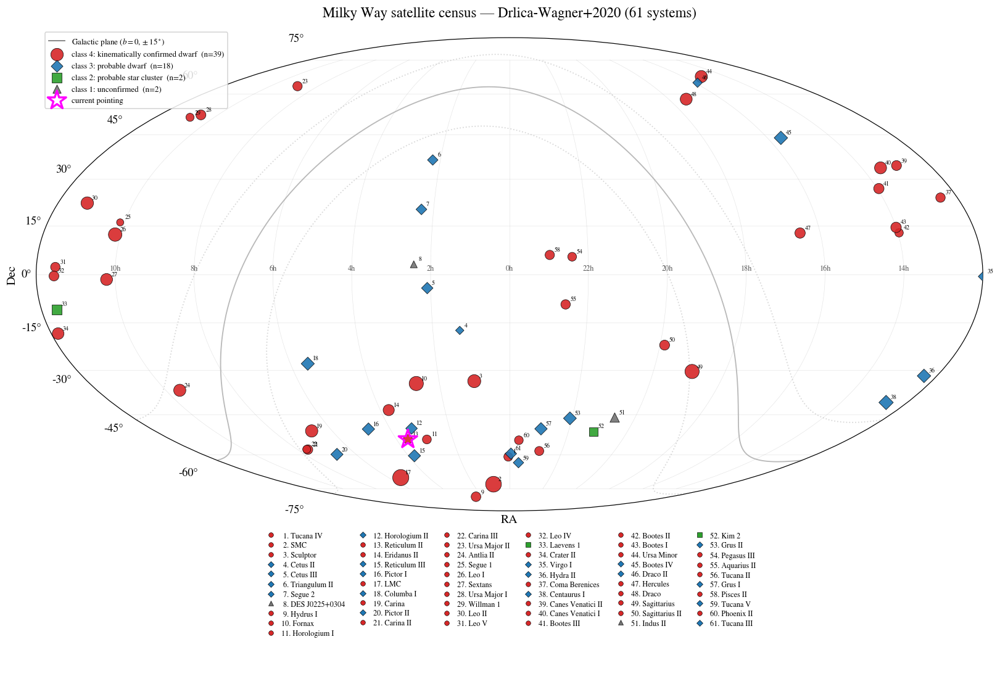

In [5]:
# ---- all-sky map of the Drlica-Wagner+2020 satellite census -------------------
# Self-contained: loads the catalogue itself, so it can sit up here before Part 1.
def plot_satellite_census(table_path=None, figsize=(18, 12.5), highlight=None,
                          annotate=True, galactic_plane=True, legend_ncol=6):
    """All 61 DW20 systems on one Mollweide sky, numbered, with a numbered legend.

    Class 1 = unconfirmed, 2 = probable star cluster, 3 = probable dwarf,
    4 = kinematically confirmed dwarf. Marker area scales with luminosity (M_V).
    """
    from astropy.io import ascii as _ascii
    from astropy.coordinates import SkyCoord
    import astropy.units as u

    t = _ascii.read(str(table_path or (PROJECT / "apjab7eb9t2_mrt.txt")))
    ra  = np.asarray(t["RAdeg"], float)
    dec = np.asarray(t["DEdeg"], float)
    cls = np.asarray(t["Class"], int)
    nm  = np.asarray(t["Name"]).astype(str)
    mv  = np.asarray(t["VMag"], float)
    order = np.argsort(ra)                      # number left-to-right across the sky

    # Mollweide wants radians, and RA conventionally increases to the LEFT
    def proj(a, d):
        return np.deg2rad(-(np.remainder(a + 180.0, 360.0) - 180.0)), np.deg2rad(d)

    style = {4: dict(name="kinematically confirmed dwarf", m="o", c="#d62728"),
             3: dict(name="probable dwarf",                m="D", c="#1f77b4"),
             2: dict(name="probable star cluster",         m="s", c="#2ca02c"),
             1: dict(name="unconfirmed",                   m="^", c="0.45")}

    # Map on top at FULL width, numbered list underneath. Anchoring the 61-entry
    # list to the right of the axes squeezes the mollweide badly.
    fig = plt.figure(figsize=figsize)
    gs = fig.add_gridspec(2, 1, height_ratios=[3.1, 1.0], hspace=0.04)
    ax  = fig.add_subplot(gs[0], projection="mollweide")
    lax = fig.add_subplot(gs[1]); lax.axis("off")
    ax.grid(True, lw=0.4, alpha=0.35)

    if galactic_plane:
        gl = np.linspace(0, 360, 721)
        for b_, ls, al in ((0.0, "-", 0.55), (-15.0, ":", 0.30), (15.0, ":", 0.30)):
            g = SkyCoord(l=gl * u.deg, b=np.full_like(gl, b_) * u.deg,
                         frame="galactic").icrs
            gx, gy = proj(g.ra.deg, g.dec.deg)
            k = np.argsort(gx)
            ax.plot(gx[k], gy[k], ls, color="0.5", lw=1.2, alpha=al, zorder=1)

    handles, groups = [], []
    if galactic_plane:
        # a Line2D proxy: ax.plot([], []) breaks under the mollweide transform
        groups.append(Line2D([], [], ls="-", color="0.5", lw=1.2,
                             label="Galactic plane ($b=0,\\pm15^\\circ$)"))
    for cl in (4, 3, 2, 1):                      # legend groups, most important first
        st = style[cl]
        sel = [k for k in order if cls[k] == cl]
        if not sel:
            continue
        x, y = proj(ra[sel], dec[sel])
        size = 40 + 14 * np.clip(-mv[sel], 0, 20)     # brighter -> bigger
        sc = ax.scatter(x, y, s=size, marker=st["m"], facecolors=st["c"],
                        edgecolors="k", linewidths=0.5, alpha=0.9, zorder=5,
                        label=f"class {cl}: {st['name']}  (n={len(sel)})")
        groups.append(sc)

    # numbered annotations + the numbered list that goes in the legend
    for i, k in enumerate(order, start=1):
        x, y = proj(ra[k], dec[k])
        if annotate:
            ax.annotate(str(i), (x, y), textcoords="offset points", xytext=(5, 4),
                        fontsize=6.5, color="k", zorder=6)
        handles.append(Line2D([], [], ls="", marker=style[cls[k]]["m"], ms=5,
                              mfc=style[cls[k]]["c"], mec="k", mew=0.4,
                              label=f"{i:2d}. {nm[k]}"))

    if highlight is not None:
        hx, hy = proj(np.atleast_1d(highlight[0]), np.atleast_1d(highlight[1]))
        hs = ax.scatter(hx, hy, s=420, marker="*", facecolors="none",
                        edgecolors="magenta", linewidths=2.2, zorder=8,
                        label="current pointing")
        groups.append(hs)

    # mollweide gives 11 default longitude ticks; label them as RA hours, increasing
    # to the left (the projection above already flipped the sign)
    _t = ax.get_xticks()
    ax.set_xticklabels([f"{(-np.rad2deg(v) % 360) / 15:.0f}h" for v in _t],
                       fontsize=8, color="0.35")
    ax.set_xlabel("RA"); ax.set_ylabel("Dec")
    ax.set_title(f"Milky Way satellite census — Drlica-Wagner+2020 ({len(t)} systems)",
                 fontsize=15, pad=22)

    # class key as a FIGURE legend (an axes legend below a mollweide axes gets
    # clipped); the numbered name list sits to the right of the map
    ax.legend(handles=groups, loc="upper left", bbox_to_anchor=(0.005, 1.02),
              fontsize=8.5, frameon=True, framealpha=0.85, borderpad=0.5)
    lax.legend(handles=handles, loc="upper center", ncol=legend_ncol,
               fontsize=8, frameon=False, handletextpad=0.4,
               columnspacing=1.4, labelspacing=0.32, borderaxespad=0.0)
    return fig, t


_hl = (CENTER_RA, CENTER_DEC) if "CENTER_RA" in dir() else None
plot_satellite_census(highlight=_hl)
plt.show()


In [6]:
def catalog_systems_in_window(dwarfs, ra0, dec0, half_deg,
                              grid_ra0, grid_dec0, cell_h, classes=None):
    """Every DW20 catalog system inside the queried box, with its 3x3 tile assignment.

    Tiles are defined exactly as in akd.split_into_3x3, i.e. in *raw* Delta-RA degrees
    (no cos(dec) factor) -- so tile edges are straight lines in an RA/Dec plot.
    """
    ra  = np.asarray(dwarfs["RAdeg"], float)
    dec = np.asarray(dwarfs["DEdeg"], float)
    dra_raw = akd.wrap_dra_deg(ra, ra0)
    ddec    = dec - dec0

    m = (np.abs(dra_raw) <= half_deg) & (np.abs(ddec) <= half_deg)
    if classes is not None:
        m &= np.isin(np.asarray(dwarfs["Class"], int), list(classes))

    sub = dwarfs[m]
    if len(sub) == 0:
        return pd.DataFrame()

    # tile assignment on the (possibly shifted) analysis grid
    parts_cat = akd.split_into_3x3(np.asarray(sub["RAdeg"], float),
                                   np.asarray(sub["DEdeg"], float),
                                   grid_ra0, grid_dec0, cell_h)
    cid = parts_cat["cell_id"]

    out = pd.DataFrame({
        "Name":   np.asarray(sub["Name"]).astype(str),
        "Class":  np.asarray(sub["Class"], int),
        "ra":     np.asarray(sub["RAdeg"], float),
        "dec":    np.asarray(sub["DEdeg"], float),
        "VMag":   np.asarray(sub["VMag"], float),
        "D_kpc":  np.asarray(sub["D"], float),
        "ah_arcmin": np.asarray(sub["ah"], float),
        "dRAcosd": akd.wrap_dra_deg(np.asarray(sub["RAdeg"], float), ra0)
                   * np.cos(np.deg2rad(dec0)),
        "dDec":   np.asarray(sub["DEdeg"], float) - dec0,
        "cell_id": cid,
        "in_Y":   cid == 4,
    })
    out["sep_deg"] = np.hypot(out["dRAcosd"], out["dDec"])
    return out.sort_values("sep_deg").reset_index(drop=True)


field_cat = catalog_systems_in_window(
    dwarfs, CENTER_RA, CENTER_DEC, DEGSEP + QUERY_PAD,
    GRID_RA0, GRID_DEC0, CELL_H, classes=None,     # None = every class, not just 4
)
n_inY = int(field_cat["in_Y"].sum()) if len(field_cat) else 0
print(f"{len(field_cat)} catalog system(s) in the field ({n_inY} inside the Y tile):")
field_cat

3 catalog system(s) in the field (0 inside the Y tile):


,Name,Class,ra,dec,VMag,D_kpc,ah_arcmin,dRAcosd,dDec,cell_id,in_Y,sep_deg
0,Reticulum II,4,53.9203,-54.0513,-3.88,30.0,5.52,0.000000,0.0000,8,False,0.000000
1,Horologium II,3,49.1077,-50.0486,-2.60,78.0,2.09,-2.825288,4.0027,-1,False,4.899373
2,Reticulum III,3,56.3600,-60.4500,-3.30,92.0,2.40,1.432252,-6.3987,-1,False,6.557035


In [7]:
# ---- Battaglia+2022 member catalog (cached locally: 645k rows, slow to refetch) ----
BAT_CACHE = CACHE_DIR / "battaglia2022_members.pkl"
BAT_RA, BAT_DEC, BAT_ID, BAT_P = "RA_ICRS", "DE_ICRS", "GaiaEDR3", "Pmemb"

def load_battaglia(force=False):
    if BAT_CACHE.exists() and not force:
        return pd.read_pickle(BAT_CACHE)
    print("fetching Battaglia+2022 from Vizier (one-off, ~1 min)...")
    v = Vizier(columns=["**"], row_limit=-1)
    df = v.get_catalogs(akd.BATTAGLIA_CATALOG)[0].to_pandas()
    df.to_pickle(BAT_CACHE)
    return df

bat = load_battaglia()
bat[BAT_ID] = bat[BAT_ID].astype("int64")
print(f"Battaglia+2022: {len(bat)} member entries across {bat['Galaxy'].nunique()} systems")

def battaglia_systems_in_window(bat, ra0, dec0, half_deg, pmemb_min=0.5):
    """Galaxy -> member rows, for every Battaglia system with members in the box.

    Found by *coordinates*, not by name matching, so nothing is missed because of
    a naming convention mismatch between DW20 and Battaglia.
    """
    dra  = akd.wrap_dra_deg(bat[BAT_RA].to_numpy(float), ra0)
    ddec = bat[BAT_DEC].to_numpy(float) - dec0
    m = (np.abs(dra) <= half_deg) & (np.abs(ddec) <= half_deg) \
        & (bat[BAT_P].to_numpy(float) > pmemb_min)
    sub = bat.loc[m]
    return {str(g): d.copy() for g, d in sub.groupby("Galaxy")}

bat_in_window = battaglia_systems_in_window(
    bat, CENTER_RA, CENTER_DEC, DEGSEP + QUERY_PAD, NEIGHBOUR_PMEMB_MIN)

print(f"\nBattaglia systems with members in the window (Pmemb > {NEIGHBOUR_PMEMB_MIN}):")
for g, d in sorted(bat_in_window.items(), key=lambda kv: -len(kv[1])):
    print(f"   {g:20s} {len(d):6d} members")

Battaglia+2022: 645720 member entries across 74 systems

Battaglia systems with members in the window (Pmemb > 0.5):
   ReticulumII              75 members
   ReticulumIII              7 members
   HorologiumII              4 members


### The Gaia query

Identical `WHERE` clause to `run_for_dwarf` (same `ra_condition`, same PM box, same
parallax cut). Only the `SELECT` list is extended, for the CMD.

In [8]:
def gaia_query(center_ra, center_dec, degsep, photometry=True, retries=4):
    """Byte-identical WHERE clause to akd.run_for_dwarf; optional extra photometry columns."""
    cols = ("source_id, ra, dec, pmra, pmdec, phot_g_mean_mag, parallax, "
            "parallax_error, ruwe")
    if photometry:
        cols += ", phot_bp_mean_mag, phot_rp_mean_mag, bp_rp"

    ra_cut  = akd.ra_condition(center_ra, degsep)
    dec_cut = f"(dec BETWEEN {center_dec - degsep} AND {center_dec + degsep})"
    query = f"""
    SELECT {cols}
    FROM gaiadr3.gaia_source
    WHERE {ra_cut}
      AND {dec_cut}
      AND pmra BETWEEN -5 AND 5
      AND pmdec BETWEEN -5 AND 5
      AND (parallax - 3*parallax_error) < 0.0
      AND ruwe < 1.4 
    """
    for attempt in range(1, retries + 1):
        try:
            return Gaia.launch_job_async(query).get_results()
        except Exception as e:
            wait = min(60, 5 * attempt)
            print(f"  Gaia attempt {attempt}/{retries} failed: {type(e).__name__}: {e} "
                  f"(retry in {wait}s)")
            if attempt == retries:
                raise
            time.sleep(wait)


def seed_from_run_pickle(safe, degsep_total):
    """Offline fallback: reuse the Gaia rows analyze_known_dwarfs.py already saved.

    run_for_dwarf pickles r_dict = (source_id, ra, dec, pmra, pmdec) for exactly the
    same query, so when the ESA archive is slow we can skip it entirely. No photometry,
    so no CMD -- everything else in this notebook works unchanged.
    """
    for p in (PROJECT / "known_dwarfs_runs" / safe / f"{safe}.pkl",
              PROJECT / "gaia_ee" / "known_dwarfs_runs" / safe / f"{safe}.pkl",
              PROJECT / "known_dwarfs_runs" / f"{safe}.pkl"):
        if not p.exists():
            continue
        with open(p, "rb") as f:
            pay = pickle.load(f)
        if "r_dict" not in pay:
            continue
        if abs(float(pay.get("degsep", np.nan)) - float(degsep_total)) > 1e-9:
            print(f"  {p.name}: degsep {pay.get('degsep')} != {degsep_total}, skipping")
            continue
        return pd.DataFrame(pay["r_dict"]), p
    return None, None


GAIA_CACHE = CACHE_DIR / f"{SAFE}_gaia_deg{DEGSEP + QUERY_PAD:g}_phot{int(FETCH_PHOTOMETRY)}.pkl"

if USE_CACHE and GAIA_CACHE.exists():
    r = pd.read_pickle(GAIA_CACHE)
    print(f"loaded cached Gaia table: {len(r)} rows  <- {GAIA_CACHE.name}")
elif SEED_FROM_RUN_PICKLE and not FETCH_PHOTOMETRY:
    r, src = seed_from_run_pickle(SAFE, DEGSEP + QUERY_PAD)
    if r is None:
        raise RuntimeError(
            f"SEED_FROM_RUN_PICKLE=True but no usable pickle for {SAFE} at degsep="
            f"{DEGSEP + QUERY_PAD}. Set SEED_FROM_RUN_PICKLE=False to query Gaia.")
    r.to_pickle(GAIA_CACHE)
    print(f"seeded from {src} : {len(r)} rows (no photometry) -> {GAIA_CACHE.name}")
else:
    t0 = time.time()
    r_tab = gaia_query(CENTER_RA, CENTER_DEC, DEGSEP + QUERY_PAD, FETCH_PHOTOMETRY)
    r = r_tab.to_pandas()
    r.to_pickle(GAIA_CACHE)
    print(f"Gaia: {len(r)} rows in {time.time()-t0:.1f}s  -> cached")

# akd's helpers index with r["col"][idx]; a DataFrame's columns do that fine,
# but a dict of ndarrays is cheaper and matches what the script pickles.
# (idempotent, so this cell is safe to re-run)
if isinstance(r, pd.DataFrame):
    r = {c: r[c].to_numpy() for c in r.columns}
r["source_id"] = np.asarray(r["source_id"]).astype("int64")

# CANONICAL ROW ORDER. Gaia does not guarantee a stable row order between
# submissions of the same query: re-running it returns the identical stars in a
# different order. Every cached run stores parts/gamma_clusters/noise_idx as
# integer indices into whatever order was current, so without this sort a
# re-query silently invalidates them and the clusters point at random stars.
_o = np.argsort(r["source_id"])
r = {c: np.asarray(v)[_o] for c, v in r.items()}

# Fingerprint of the star table, so a cached run built on a different table is
# rejected rather than silently misapplied.
import hashlib
R_HASH = hashlib.sha1(r["source_id"].tobytes()).hexdigest()[:12]
print(f"columns: {list(r.keys())}")
print(f"rows: {r['source_id'].size}   canonical order by source_id   R_HASH={R_HASH}")

loaded cached Gaia table: 123166 rows  <- Reticulum_II_gaia_deg8.55_phot1.pkl
columns: ['source_id', 'ra', 'dec', 'pmra', 'pmdec', 'phot_g_mean_mag', 'parallax', 'parallax_error', 'ruwe', 'phot_bp_mean_mag', 'phot_rp_mean_mag', 'bp_rp']
rows: 123166   canonical order by source_id   R_HASH=4a87c255f50f


## Part 2 — The pipeline

Steps 2–6 of `akd.run_for_dwarf`, called one at a time so every intermediate stays
available for plotting. Correspondence:

| script step | call here |
|---|---|
| 2. windowing + features | `akd.make_Xrefs_and_Y_from_window_3x3` |
| 3. per-reference nulls  | `akd.compute_the_null_multi_refs` |
| 4. Soar $\times 8$, $\Gamma_i=\sum_j\Upsilon^{(j)}_i$ | `akd.compute_Gamma_i_multi_ref` |
| 5. empirical $\Gamma$ null | `akd.bootstrap_gamma_null_uniform` |
| 6. DBSCAN + weighted $S/\sqrt{\hat B}$ | `akd.srootB_for_Gamma_clusters_from_Brefs` |

The grid centre and cell half-width are arguments, so Part 4 can re-run this on a shifted
or resized grid with no code change.

In [10]:
def run_pipeline(r, grid_ra0, grid_dec0, cell_h,
                 kM=None, p_ext=None, null_N=None, n_boot=None, n_jobs=None,
                 dpa_Z=None, dbscan_eps=None, dbscan_min=None,
                 seed=None, equalise=None, eq_srb=None, eq_max_passes=None,
                 eq_km="__cfg__", eq_headroom=None,
                 ref_workers=8, boot_workers=1,
                 keep_heavy=True, verbose=True):
    """Steps 2-6 of akd.run_for_dwarf, returning every intermediate.

    Every parameter defaults to None and is resolved from the CONFIG cell's globals
    *at call time*. Do NOT write `kM=KM` in the signature: default arguments are bound
    when the def cell runs, so editing CONFIG afterwards would silently have no effect.
    """
    kM         = KM         if kM         is None else kM
    p_ext      = P_EXT      if p_ext      is None else p_ext
    null_N     = NULL_N     if null_N     is None else null_N
    n_boot     = N_BOOT     if n_boot     is None else n_boot
    n_jobs     = N_JOBS     if n_jobs     is None else n_jobs
    dpa_Z      = DPA_Z      if dpa_Z      is None else dpa_Z
    dbscan_eps = DBSCAN_EPS if dbscan_eps is None else dbscan_eps
    dbscan_min = DBSCAN_MIN if dbscan_min is None else dbscan_min
    seed       = SEED       if seed       is None else seed
    equalise   = EQUALISE      if equalise      is None else equalise
    eq_srb     = EQ_SRB        if eq_srb        is None else eq_srb
    eq_max_passes = EQ_MAX_PASSES if eq_max_passes is None else eq_max_passes
    # EQ_KM is legitimately None ("use kM"), so the sentinel here must be a distinct
    # object -- resolving on `is None` would make EQ_KM=None unreachable.
    eq_km       = EQ_KM       if eq_km      == "__cfg__" else eq_km
    eq_headroom = EQ_HEADROOM if eq_headroom is None     else eq_headroom
    t0 = time.time()
    if verbose:
        print(f"  config: kM={kM!r} p_ext={p_ext:g} null_N={null_N} n_boot={n_boot} "
              f"Z={dpa_Z} eps={dbscan_eps} min_samples={dbscan_min} seed={seed}")

    # --- 2) windowing + features ---
    Y, X_refs, parts, scale = akd.make_Xrefs_and_Y_from_window_3x3(
        r, grid_ra0, grid_dec0, cell_h,
        fit_scaling_on="all", do_robust_scale=True,
    )
    nY, nXs = len(Y), [len(Xj) for Xj in X_refs]
    if verbose:
        print(f"  |Y| = {nY},  |X_j| = {nXs}")

    # ---- cut localised overdensities out of the references (see CONFIG) ----
    eq_info, eq_sids, eq_cells = None, set(), []
    if equalise:
        # kM may still be "auto" here (its bound depends on the post-equalisation
        # sizes -- circular). km_eq="auto" ignores it; resolve for the km_eq=None path.
        X_refs, eq_info = rb.equalise_references(
            Y, X_refs, kM=rb.resolve_km(kM, nXs, nY)[0],
            p_ext=p_ext, null_N=null_N, dpa_Z=dpa_Z,
            n_jobs=(1 if ref_workers > 1 else n_jobs), srb_threshold=eq_srb,
            max_passes=eq_max_passes, km_eq=eq_km, headroom_min=eq_headroom,
            ref_workers=ref_workers, verbose=verbose)
        nXs = [len(Xj) for Xj in X_refs]
        _sid = np.asarray(r["source_id"], dtype="int64")
        for _j, _rem in enumerate(eq_info["removed_idx"]):
            if _rem.size:
                _rows = np.asarray(parts["ref_idx_list"][_j], int)[_rem]
                eq_sids.update(int(x) for x in _sid[_rows])
                eq_cells.append(int(parts["ref_ids"][_j]))
        if verbose and eq_cells:
            print(f"  equalised tiles {eq_cells}: |X_j| now {nXs}")
    if nY < 1000 or min(nXs) < 1000:
        raise RuntimeError(f"empty/small cells: nY={nY}, nXs={nXs}")

    # ---- resolve K_M="auto" HERE, not earlier: equalisation shrinks the references,
    # so the locality bound must be taken on the sizes actually used below.
    _kM_req = kM                       # "auto" or the int the caller asked for
    kM, _bound, _kmode = rb.resolve_km(kM, nXs, nY)
    if verbose:
        print(f"  K_M = {kM}" + (f"  <- auto (0.05*min(min_j nX_j, nY) = {_bound})"
                                 if _kmode == "auto" else
                                 f"   (locality bound {_bound}"
                                 f"{'; ABOVE IT' if kM > _bound else ''})"))
    _hi = -(kM - 1) * np.log(nY / (nY + max(nXs)))
    if verbose and _hi < 20.0:
        print(f"  WARNING: Y-side ceiling Upsilon_max={_hi:.1f} -- references very "
              f"unbalanced, a real anomaly may not be able to clear Gamma*.")

    # --- 3) per-reference nulls ---
    p_list = [nY / (nY + nX) for nX in nXs]
    if verbose and rb.VERBOSITY >= 2: print(f"  nulls (N={null_N}) ...")
    with rb._q():
        stats_null_multi = akd.compute_the_null_multi_refs(
            p_list=p_list, K_M=kM, N=null_N, n_jobs=min(8, n_jobs))

    # --- 4) Soar on each reference -> Gamma_i ---
    if verbose and rb.VERBOSITY >= 2: print("  Soar on 8 references ...")
    # rb._q() swallows BOTH channels EagleEye prints on: plain print() and
    # IPython display() -- the latter bypasses stdout in a notebook, which is why
    # redirect_stdout alone still leaves "<IPython.core.display.Math object>" behind.
    if ref_workers > 1:
        import ee_parallel as ep
        out = ep.compute_Gamma_i_multi_ref_par(
            X_refs, Y, stats_null_multi, K_M=kM, p_ext=p_ext, n_jobs=1, Z=dpa_Z,
            ref_workers=ref_workers)
    else:
        with rb._q():
            out = akd.compute_Gamma_i_multi_ref(
                X_refs=X_refs, Y=Y, stats_null_multi=stats_null_multi,
                K_M=kM, p_ext=p_ext, n_jobs=n_jobs, Z=dpa_Z)
    Gamma_i = out["Gamma_i"]

    # --- 5) empirical Gamma null on Uniform([0,1]^d) ---
    if verbose and rb.VERBOSITY >= 2: print(f"  bootstrap Gamma null (n_boot={n_boot}) ...")
    if boot_workers > 1:
        import ee_parallel as ep
        Gamma_null_mat = ep.bootstrap_gamma_null_uniform_par(
            X_refs, Y, stats_null_multi, K_M=kM, p_ext=p_ext, n_jobs=1,
            n_boot=n_boot, seed=seed, workers=boot_workers)
    else:
        with rb._q():
            Gamma_null_mat = akd.bootstrap_gamma_null_uniform(
                X_refs=X_refs, Y=Y, stats_null_multi=stats_null_multi,
                K_M=kM, p_ext=p_ext, n_jobs=n_jobs, n_boot=n_boot, seed=seed)
    g = Gamma_null_mat.reshape(-1)
    g = g[np.isfinite(g)]
    Gamma_star = float(np.quantile(g, 1 - p_ext))
    A_Gamma_mask = Gamma_i > Gamma_star
    if verbose:
        print(f"  Gamma* = {Gamma_star:.3f}   |A_Gamma| = {int(A_Gamma_mask.sum())}")

    # --- 6) DBSCAN + weighted background ---
    with rb._q():
        cl = akd.srootB_for_Gamma_clusters_from_Brefs(
            EE_books=out["EE_books"], SrootB_by_ref=out["SrootB_by_ref"],
            B_by_ref=out["B_by_ref"], Y=Y, A_Gamma_mask=A_Gamma_mask,
            overlap_min=1, use_cluster_key="Repechaged", weight_mode="overlap",
            dbscan_eps=dbscan_eps, dbscan_min_samples=dbscan_min, cluster_cols=(0, 1, 2, 3))
    if verbose:
        print(f"  n_Gamma_clusters = {len(cl['gamma_clusters'])}   "
              f"({time.time()-t0:.1f}s)")

    run = {
        "Y": Y, "parts": parts, "scale": scale, "nY": nY, "nXs": nXs, "p_list": p_list,
        # Per-reference Upsilon: only R x nY floats (~0.2 MB), and without it the
        # reference-independence diagnostic cannot run. Always keep it.
        "Upsilon_by_ref": out["Upsilon_by_ref"],
        "Gamma_i": Gamma_i, "Gamma_null_mat": Gamma_null_mat, "Gamma_star": Gamma_star,
        "A_Gamma_mask": A_Gamma_mask,
        "gamma_clusters": cl["gamma_clusters"], "cluster_stats": cl["cluster_stats"],
        "labels_all": cl["labels_all"], "noise_idx": cl["noise_idx"],
        "grid": {"ra0": grid_ra0, "dec0": grid_dec0, "cell_h": cell_h},
        "eq_summary": (eq_info["summary"] if eq_info else None),
        "eq_detail":  (eq_info["detail"]  if eq_info else None),
        "eq_removed_sids": eq_sids, "eq_repaired_cells": eq_cells,
        "cfg": {"kM": kM, "p_ext": p_ext, "null_N": null_N, "n_boot": n_boot,
                "dpa_Z": dpa_Z, "dbscan_eps": dbscan_eps, "dbscan_min": dbscan_min,
                "seed": seed, "equalise": bool(equalise), "eq_srb": float(eq_srb),
                "eq_km": eq_km, "eq_headroom": float(eq_headroom),
                "km_mode": _kmode, "km_bound": int(_bound),
                "kM_requested": _kM_req},
        "r_hash": R_HASH,
        "wall_time_s": time.time() - t0,
    }
    if keep_heavy:      # result_dicts / EE_books are large; opt in when needed
        run["X_refs"] = X_refs
        run["stats_null_multi"] = stats_null_multi
        run["EE_books"] = out["EE_books"]
        run["result_dicts"] = out["result_dicts"]
        run["SrootB_by_ref"] = out["SrootB_by_ref"]
        run["B_by_ref"] = out["B_by_ref"]
    return run


def run_tag(grid_dra, grid_ddec, cell_h, kM=None, p_ext=None, null_N=None,
            n_boot=None, dpa_Z=None, dbscan_eps=None, dbscan_min=None, seed=None):
    """Cache key. MUST include every parameter that changes the result, or a config
    change silently loads a stale run. Resolved from globals at call time."""
    kM         = KM         if kM         is None else kM
    p_ext      = P_EXT      if p_ext      is None else p_ext
    null_N     = NULL_N     if null_N     is None else null_N
    n_boot     = N_BOOT     if n_boot     is None else n_boot
    dpa_Z      = DPA_Z      if dpa_Z      is None else dpa_Z
    dbscan_eps = DBSCAN_EPS if dbscan_eps is None else dbscan_eps
    dbscan_min = DBSCAN_MIN if dbscan_min is None else dbscan_min
    seed       = SEED       if seed       is None else seed
    # Equalisation changes X_refs, so it changes EVERY downstream number. It also
    # depends on p_ext (through Upsilon*), which is already in the tag.
    eq = ("eqOFF" if not EQUALISE else
          f"eq{EQ_SRB:g}x{EQ_MAX_PASSES}k{EQ_KM}h{EQ_HEADROOM:g}")
    return (f"{SAFE}_dra{grid_dra:+.3f}_ddec{grid_ddec:+.3f}_h{cell_h:.4f}"
            f"_kM{kM}_pext{p_ext:g}_nullN{null_N}_boot{n_boot}"
            f"_Z{dpa_Z:g}_eps{dbscan_eps:g}_ms{dbscan_min}_seed{seed}_{eq}")


# ---- equalisation report ------------------------------------------------------
def report_equalisation(run, label=""):
    """Per-reference and per-cluster summary of what equalisation cut, if anything."""
    summ, det = run.get("eq_summary"), run.get("eq_detail")
    if summ is None:
        print(f"{label}equalisation: OFF for this run")
        return None
    if not bool(summ["repaired"].any()):
        print(f"{label}equalisation: ON, nothing cut "
              f"(no X-side cluster above S/sqrt(B)={run['cfg'].get('eq_srb', '?')})")
        return summ
    cells = run.get("eq_repaired_cells", [])
    print(f"{label}equalisation: {int(summ.repaired.sum())}/{len(summ)} reference(s) "
          f"repaired (tiles {cells}), {int(summ.n_cut.sum())} points cut")
    cols = ["ref", "n_before", "n_after", "n_cut", "passes", "ratio_after",
            "kM_eq_last", "p_hat_last", "headroom_last", "max_srb", "min_purity"]
    print(summ[[c for c in cols if c in summ.columns]].to_string(index=False))
    if det is not None and len(det):
        print("\nper cluster (one row per pass):")
        print(det.to_string(index=False))
        print("\n  purity is recorded, not gated on: a low value means the cut was")
        print("  largely background, which costs B_0 -- watch it if it drops far.")
        print("  headroom = Upsilon_max - Upsilon* at the K_M of that pass. It is the")
        print("  detection margin: at <= 0 the X-side test is blind and the run raises.")
    return summ


In [11]:
TAG      = run_tag(GRID_DRA, GRID_DDEC, CELL_H)
RUN_PKL  = CACHE_DIR / f"{TAG}.pkl"
rb.VERBOSITY = 1
if USE_CACHE and RUN_PKL.exists():
    with open(RUN_PKL, "rb") as f:
        run = pickle.load(f)
    print(f"loaded cached run <- {RUN_PKL.name}  ({run['wall_time_s']:.0f}s originally)")
    # belt and braces: the tag should already make this impossible
    # Compare the REQUESTED kM: with KM="auto", cfg["kM"] holds the resolved int,
    # so keying on it would fail against the literal "auto" every time.
    _want = {"kM_requested": KM, "p_ext": P_EXT, "null_N": NULL_N, "n_boot": N_BOOT,
             "dpa_Z": DPA_Z, "dbscan_eps": DBSCAN_EPS, "dbscan_min": DBSCAN_MIN,
             "seed": SEED}
    if run.get("r_hash") != R_HASH:
        raise RuntimeError(
            f"cached run was built on a DIFFERENT star table "
            f"(cached r_hash={run.get('r_hash')}, current={R_HASH}).\n"
            f"Its parts/gamma_clusters are indices into the other table's row order "
            f"and would point at the wrong stars.\n"
            f"Delete {RUN_PKL} and re-run, or set USE_CACHE=False.")
    _bad = {k: (run["cfg"].get(k), v) for k, v in _want.items() if run["cfg"].get(k) != v}
    if run["cfg"].get("kM_requested") is None:      # pre-versioning pickle
        raise RuntimeError(f"cached run predates the kM='auto' option; delete "
                           f"{RUN_PKL.name} or set USE_CACHE=False.")
    if _bad:
        raise RuntimeError(
            "cached run does not match the current CONFIG (cached, wanted): "
            f"{_bad}\nDelete {RUN_PKL} or set USE_CACHE=False.")
else:
    run = run_pipeline(r, GRID_RA0, GRID_DEC0, CELL_H, keep_heavy=True)
    with open(RUN_PKL, "wb") as f:
        pickle.dump(run, f)
    print(f"saved -> {RUN_PKL.name}")

Y            = run["Y"]
parts        = run["parts"]
Gamma_i      = run["Gamma_i"]
Gamma_star   = run["Gamma_star"]
Gamma_null   = run["Gamma_null_mat"].reshape(-1)
Gamma_null   = Gamma_null[np.isfinite(Gamma_null)]
gamma_clusters = run["gamma_clusters"]
cluster_stats  = run["cluster_stats"]

print(f"\nK_M = {run['cfg']['kM']}"
      + (f"  <- auto (locality bound {run['cfg'].get('km_bound')})"
         if run['cfg'].get('km_mode') == 'auto' else "")
      + f"\nGamma* = {Gamma_star:.2f}   |A_Gamma| = {int(run['A_Gamma_mask'].sum())} / {run['nY']}"
      + f"   n_clusters = {len(gamma_clusters)}")
for gid in sorted(gamma_clusters):
    cs = cluster_stats[gid]
    print(f"   cluster {gid}: S={cs['S']:5d}  Bhat={cs['B_weighted']:8.2f}  "
          f"S/sqrt(B)={cs['s_over_rootB']:7.2f}")



loaded cached run <- Reticulum_II_dra-0.810_ddec-1.000_h1.0000_kM150_pext0.005_nullN200000_boot20_Z2.65_eps1_ms5_seed42_eq5x4kautoh0.5.pkl  (304s originally)

K_M = 150
Gamma* = 43.28   |A_Gamma| = 42 / 1595   n_clusters = 1
   cluster 0: S=   39  Bhat=   20.94  S/sqrt(B)=   8.52


In [12]:
0.05 * 1600


80.0

In [13]:
report_equalisation(run, label="discovery run: ")


discovery run: equalisation: 2/8 reference(s) repaired (tiles [5, 8]), 62 points cut
 ref  n_before  n_after  n_cut  passes  ratio_after  kM_eq_last  p_hat_last  headroom_last   max_srb  min_purity
   0      1487     1487      0       0     0.952900          74    0.517521      46.476574       NaN         NaN
   1      1606     1606      0       0     1.029157          79    0.498282      47.096943       NaN         NaN
   2      1635     1635      0       0     1.047741          79    0.493808      46.280510       NaN         NaN
   3      1564     1564      0       0     1.002243          78    0.504907      47.281440       NaN         NaN
   4      1567     1533     34       1     0.982377          76    0.509910      46.585848 11.065258    0.780875
   5      1557     1557      0       0     0.997757          77    0.506028      46.805530       NaN         NaN
   6      1543     1543      0       0     0.988786          77    0.508286      47.098218       NaN         NaN
   7      1

,ref,n_before,n_after,n_cut,passes,repaired,max_srb,min_purity,kM_eq_last,p_hat_last,headroom_last,ratio_after
0,0,1487,1487,0,0,False,NaN,NaN,74,0.517521,46.476574,0.952900
1,1,1606,1606,0,0,False,NaN,NaN,79,0.498282,47.096943,1.029157
2,2,1635,1635,0,0,False,NaN,NaN,79,0.493808,46.280510,1.047741
3,3,1564,1564,0,0,False,NaN,NaN,78,0.504907,47.281440,1.002243
4,4,1567,1533,34,1,True,11.065258,0.780875,76,0.509910,46.585848,0.982377
5,5,1557,1557,0,0,False,NaN,NaN,77,0.506028,46.805530,0.997757
6,6,1543,1543,0,0,False,NaN,NaN,77,0.508286,47.098218,0.988786
7,7,1613,1585,28,1,True,7.720492,0.616908,79,0.501572,47.494552,1.015700


### Attaching the known members to the run

For each Battaglia system in the field we resolve its members onto the Gaia rows we
actually queried. The match is **exact on `source_id`** (Battaglia lists EDR3 ids, which are
identical to the DR3 `source_id`), so there is no positional tolerance to tune.

Three counts matter and they are *not* the same:

- `n_bat` — members in the window per Battaglia
- `n_in_r` — of those, how many survive the query's PM / parallax cuts
- `n_in_Y` — of those, how many land in the centre tile, i.e. how many EagleEye could
  possibly have flagged

A low TPR with a low `n_in_Y` is a windowing problem, not a detection failure.

In [14]:
def attach_members_to_run(bat_in_window, r, parts, target_name=None):
    """Battaglia systems -> their rows in r, and their indices into Y."""
    r_sid = np.asarray(r["source_id"], dtype="int64")
    order = np.argsort(r_sid)
    r_sid_sorted = r_sid[order]

    test_idx = np.asarray(parts["test_idx"], dtype=int)
    y_sid = r_sid[test_idx]
    sid_to_y = {int(s): i for i, s in enumerate(y_sid)}

    has_bprp = "bp_rp" in r
    has_g    = "phot_g_mean_mag" in r

    neigh = {}
    for gal, d in bat_in_window.items():
        sid = d[BAT_ID].to_numpy("int64")
        pos = np.clip(np.searchsorted(r_sid_sorted, sid), 0, len(r_sid) - 1)
        cand = order[pos]
        ok = r_sid[cand] == sid
        idx_r = cand[ok]

        yi = np.array([sid_to_y[int(s)] for s in r_sid[idx_r] if int(s) in sid_to_y], dtype=int)

        neigh[gal] = {
            "n_bat":   int(len(d)),
            "n_in_r":  int(idx_r.size),
            "n_in_Y":  int(yi.size),
            "idx_r":   idx_r,
            "idx_Y":   yi,
            "sid":     r_sid[idx_r],
            "sid_Y":   set(int(s) for s in y_sid[yi]) if yi.size else set(),
            "ra":      np.asarray(r["ra"],   float)[idx_r],
            "dec":     np.asarray(r["dec"],  float)[idx_r],
            "pmra":    np.asarray(r["pmra"], float)[idx_r],
            "pmdec":   np.asarray(r["pmdec"],float)[idx_r],
            "g":       (np.asarray(r["phot_g_mean_mag"], float)[idx_r] if has_g else None),
            "bp_rp":   (np.asarray(r["bp_rp"], float)[idx_r] if has_bprp else None),
            "is_target": (target_name is not None
                          and gal.lower().replace(" ", "") == target_name.lower().replace(" ", "")),
        }
    return neigh


neigh = attach_members_to_run(bat_in_window, r, parts, target_name=TARGET_NAME)

member_table = pd.DataFrame(
    [{"Galaxy": g, "target": v["is_target"], "n_bat": v["n_bat"],
      "n_in_r": v["n_in_r"], "n_in_Y": v["n_in_Y"],
      "frac_reaching_Y": v["n_in_Y"] / v["n_bat"] if v["n_bat"] else np.nan}
     for g, v in neigh.items()],
    columns=["Galaxy", "target", "n_bat", "n_in_r", "n_in_Y", "frac_reaching_Y"],
).sort_values("n_in_Y", ascending=False).reset_index(drop=True)

print(f"Known members reaching the test set (target = {DWARF}):")
member_table

Known members reaching the test set (target = Reticulum II):


,Galaxy,target,n_bat,n_in_r,n_in_Y,frac_reaching_Y
0,HorologiumII,False,4,4,0,0.0
1,ReticulumII,True,75,75,0,0.0
2,ReticulumIII,False,7,7,0,0.0


## Part 3 — Plots

In [15]:
GAVO_TAP = "https://dc.zah.uni-heidelberg.de/tap"

def fetch_photometry_by_source_id(source_ids, chunk=3000, url=GAVO_TAP, verbose=True):
    """G, BP, RP for a list of DR3 source_ids, from a non-ESA mirror.

    Chunked because GAVO's sync endpoint has a short time limit. EDR3/DR3 source_ids
    are identical, so this matches the Battaglia ids too.
    """
    import pyvo
    svc = pyvo.dal.TAPService(url)
    ids = np.unique(np.asarray(source_ids, dtype="int64"))
    n_chunks = -(-ids.size // chunk)
    frames = []
    for k in range(0, ids.size, chunk):
        ch = ids[k:k + chunk]
        q = ("SELECT source_id, phot_g_mean_mag, phot_bp_mean_mag, phot_rp_mean_mag "
             "FROM gaia.dr3lite WHERE source_id IN (" + ",".join(map(str, ch)) + ")")
        frames.append(svc.run_sync(q, maxrec=ch.size + 10).to_table().to_pandas())
        if verbose:
            print(f"   chunk {k // chunk + 1}/{n_chunks}: {len(frames[-1])} rows")
    df = pd.concat(frames, ignore_index=True)
    df["source_id"] = df["source_id"].astype("int64")
    df["bp_rp"] = df["phot_bp_mean_mag"] - df["phot_rp_mean_mag"]
    return df


def attach_photometry(r, source_ids=None, cache=None, **kw):
    """Merge G and BP-RP into the r dict, aligned on source_id. NaN where unmatched."""
    sid = np.asarray(r["source_id"], dtype="int64")
    want = sid if source_ids is None else np.asarray(source_ids, dtype="int64")

    if cache is not None and Path(cache).exists():
        ph = pd.read_pickle(cache)
        print(f"photometry from cache: {len(ph)} rows <- {Path(cache).name}")
    else:
        t0 = time.time()
        ph = fetch_photometry_by_source_id(want, **kw)
        print(f"fetched {len(ph)}/{len(np.unique(want))} in {time.time()-t0:.1f}s")
        if cache is not None:
            ph.to_pickle(cache)

    ph = ph.drop_duplicates("source_id").set_index("source_id")
    idx = pd.Index(sid)
    r["phot_g_mean_mag"] = ph["phot_g_mean_mag"].reindex(idx).to_numpy(float)
    r["bp_rp"]           = ph["bp_rp"].reindex(idx).to_numpy(float)
    n_ok = int(np.isfinite(r["bp_rp"]).sum())
    print(f"attached photometry: {n_ok}/{sid.size} rows have BP-RP")
    return r


# Only the Y tile is ever drawn in a CMD, so that is all we fetch.
if "bp_rp" not in r or not np.isfinite(np.asarray(r.get("bp_rp", [np.nan]), float)).any():
    _y_sid = np.asarray(r["source_id"], dtype="int64")[np.asarray(parts["test_idx"], int)]
    r = attach_photometry(
        r, source_ids=_y_sid,
        cache=CACHE_DIR / f"{SAFE}_phot_gavo_deg{DEGSEP + QUERY_PAD:g}.pkl")
else:
    print("photometry already present — nothing to fetch")

photometry already present — nothing to fetch


In [16]:
# ---- shared style helpers -------------------------------------------------
GAMMA_CMAP  = plt.get_cmap("tab10")
NEIGH_CMAP  = plt.get_cmap("Dark2")   # no red: red is reserved for the target

def gamma_colour(k):  return GAMMA_CMAP(k % 10)

def neighbour_style(neigh):
    """Stable colour/marker per galaxy; the target always gets red stars."""
    gals = sorted(neigh, key=lambda g: (not neigh[g]["is_target"], -neigh[g]["n_in_Y"]))
    style, k = {}, 0
    for g in gals:
        if neigh[g]["is_target"]:
            style[g] = {"color": "red", "marker": "*", "size": 130}
        else:
            style[g] = {"color": NEIGH_CMAP(k % 8), "marker": "P", "size": 70}
            k += 1
    return style

# Drlica-Wagner+2020 system classes
CLASS_STYLE = {
    4: {"name": "confirmed dwarf",     "marker": "X", "ms": 12, "color": "k"},
    3: {"name": "probable dwarf",      "marker": "D", "ms": 9,  "color": "tab:blue"},
    2: {"name": "probable star cluster","marker": "s", "ms": 9,  "color": "tab:green"},
    1: {"name": "unconfirmed",         "marker": "^", "ms": 10, "color": "0.45"},
}

NSTYLE = neighbour_style(neigh)

def draw_grid(ax, grid, n_cells=3):
    """3x3 tile boundaries, drawn in raw RA/Dec to match akd.split_into_3x3."""
    h = grid["cell_h"]
    for i, d in enumerate([-3*h, -h, h, 3*h]):
        lw, c = (1.6, "0.25") if abs(d) == h else (1.0, "0.6")
        ax.axvline(grid["ra0"] + d,  color=c, ls="--", lw=lw, alpha=0.8, zorder=0)
        ax.axhline(grid["dec0"] + d, color=c, ls="--", lw=lw, alpha=0.8, zorder=0)

In [17]:
def plot_field(run, r, neigh, field_cat=None, space="sky",
               show_all_members=True, show_centres=True, show_halflight=True,
               show_noise=True, zoom_to_Y=False, figsize=None,
               cat_classes=None, show_equalised=True, show_cut_points=True,
               sky_aspect="equal", title=None, ax=None):
    """Gamma clusters + every known system's members, in sky or PM space.

    space = "sky" -> absolute RA/Dec (RA axis inverted, equal aspect)
    space = "pm"  -> pmra/pmdec
    """
    parts   = run["parts"]
    grid    = run["grid"]
    test_idx = np.asarray(parts["test_idx"], dtype=int)
    inside   = np.where(np.asarray(parts["inside"], bool))[0]

    if space == "sky":
        xk, yk = "ra", "dec"
        xlab, ylab = r"RA [deg]", r"Dec [deg]"
    else:
        xk, yk = "pmra", "pmdec"
        xlab, ylab = r"$\mu_{\alpha^*}$ [mas yr$^{-1}$]", r"$\mu_\delta$ [mas yr$^{-1}$]"

    # RA WRAP. A field straddling RA 0/360 (Tucana III at 359.15, say) returns stars
    # at both ~359 and ~1. Plotting absolute RA then spans the whole 360 deg and the
    # aspect constraint flattens Dec to a sliver. Unwrap about the grid centre so the
    # axis is continuous; tick labels are mapped back into [0,360) below.
    if space == "sky":
        def _ux(a):
            return grid["ra0"] + akd.wrap_dra_deg(np.asarray(a, float), grid["ra0"])
    else:
        def _ux(a):
            return np.asarray(a, float)

    X_all = _ux(r[xk])
    Y_all = np.asarray(r[yk], float)

    # SKY ASPECT. One RA degree subtends only cos(dec) on the sky, so "equal" squashes
    # Dec by 1/cos(dec) -- a factor 1.70 at dec = -54. Use the true sky aspect, and
    # size the figure to match it, otherwise the axes shrink inside a wide canvas and
    # the plot ends up a thin strip surrounded by margin.
    _cosd = np.cos(np.deg2rad(grid["dec0"]))
    _asp = (1.0 / _cosd) if (space == "sky" and sky_aspect == "sky") else 1.0
    if figsize is None:
        _w = 9.0
        figsize = ((_w, float(np.clip(_w * _asp * 0.78, 6.0, 13.0)))
                   if space == "sky" else (8.5, 8.0))

    if ax is None:
        fig, ax = plt.subplots(figsize=figsize)
    else:
        fig = ax.figure

    # ---- background: whole 3x3, then the Y tile a shade darker ----
    # Stars cut by reference equalisation are NOT part of the analysis any more, so
    # they must not be drawn as ordinary background -- the grey points below are the
    # EQUALISED reference set. The cut points go in faint purple instead.
    eq_sids  = run.get("eq_removed_sids", set()) or set()
    eq_cells = run.get("eq_repaired_cells", []) or []
    if eq_sids:
        _sid_in = np.asarray(r["source_id"], dtype="int64")[inside]
        _cut = np.isin(_sid_in, list(eq_sids))
        inside_keep, inside_cut = inside[~_cut], inside[_cut]
    else:
        inside_keep, inside_cut = inside, np.array([], dtype=int)

    ax.scatter(X_all[inside_keep], Y_all[inside_keep], s=1.5, alpha=0.18,
               color="0.75", rasterized=True, zorder=1, label="_nolegend_")
    if show_cut_points and inside_cut.size:
        ax.scatter(X_all[inside_cut], Y_all[inside_cut], s=1.5, alpha=0.30,
                   color="tab:purple", rasterized=True, zorder=1,
                   label=f"cut by equalisation (n={inside_cut.size})")
    ax.scatter(X_all[test_idx], Y_all[test_idx], s=1.5, alpha=0.30,
               color="0.45", rasterized=True, zorder=2,
               label=rf"$\mathcal{{Y}}$ (n={test_idx.size})")

    if space == "sky":
        draw_grid(ax, grid)
        # outline any reference tile that was equalised
        if show_equalised and eq_cells:
            _h = grid["cell_h"]
            for _n, _cid in enumerate(eq_cells):
                _rc, _dc = akd.cell_center_from_id(grid["ra0"], grid["dec0"], _cid, _h)
                ax.add_patch(plt.Rectangle((_rc - _h, _dc - _h), 2*_h, 2*_h,
                             fill=False, ec="tab:purple", lw=2.0, ls="-", alpha=0.75,
                             zorder=3,
                             label=("equalised reference tile" if _n == 0 else "_nolegend_")))

    # ---- everything above Gamma*, as one uniform marker -------------------
    # Plot the WHOLE of A_Gamma, then ring the points DBSCAN assigned to a cluster.
    # A point that clears Gamma* but ends up as DBSCAN noise is therefore still
    # drawn -- it simply has no ring -- so the sky/PM plots can never silently
    # disagree with panel (c) of the Gamma figure.
    A_idx = np.where(np.asarray(run["A_Gamma_mask"], bool))[0]
    n_noise = int(np.asarray(run.get("noise_idx", []), dtype=int).size)
    if A_idx.size:
        ridx = test_idx[A_idx]
        lab = rf"$\Gamma>\Gamma^\star$ (n={A_idx.size}"
        lab += rf", {n_noise} unclustered)" if n_noise else ")"
        # zorder 8: above the member markers, so an above-threshold catalogued
        # member reads as a coloured symbol with a small blue pip in its centre
        ax.scatter(X_all[ridx], Y_all[ridx], s=20, color="tab:blue", alpha=0.95,
                   zorder=8, rasterized=True, label=lab)

    # ---- a coloured ring per DBSCAN cluster ----
    for k, gid in enumerate(sorted(run["gamma_clusters"])):
        pts = np.asarray(run["gamma_clusters"][gid], dtype=int)
        if pts.size == 0:
            continue
        ridx = test_idx[pts]
        srb = run["cluster_stats"][int(gid)]["s_over_rootB"]
        ax.scatter(X_all[ridx], Y_all[ridx], s=95, facecolors="none",
                   edgecolors=gamma_colour(k), linewidths=1.3,
                   zorder=9, rasterized=True,
                   label=rf"$\Gamma$ cluster {gid}: n={pts.size}, "
                         rf"$S/\sqrt{{\hat B}}$={srb:.1f}")

    # ---- known members, one style per system ----
    if show_all_members:
        for gal in sorted(neigh, key=lambda g: (not neigh[g]["is_target"], -neigh[g]["n_in_Y"])):
            v = neigh[gal]
            if v["n_in_r"] == 0:
                continue
            st = NSTYLE[gal]
            inY = np.isin(v["idx_r"], test_idx)
            tag = "target" if v["is_target"] else "interloper"
            # inside Y: filled;  outside Y (reference tiles): open
            if inY.any():
                ax.scatter(_ux(v[xk])[inY], v[yk][inY], s=st["size"], marker=st["marker"],
                           facecolors=st["color"], edgecolors="k", linewidths=0.6,
                           alpha=0.95, zorder=7,
                           label=f"{gal} [{tag}]: {int(inY.sum())} in $\\mathcal{{Y}}$")
            if (~inY).any():
                ax.scatter(_ux(v[xk])[~inY], v[yk][~inY], s=st["size"] * 0.7, marker=st["marker"],
                           facecolors="none", edgecolors=st["color"], linewidths=1.1,
                           alpha=0.75, zorder=6,
                           label=f"{gal}: {int((~inY).sum())} outside $\\mathcal{{Y}}$")

    # ---- catalog centres / half-light radii (sky only) ----
    # Drlica-Wagner+2020 class: 1 unconfirmed, 2 probable star cluster,
    # 3 probable dwarf, 4 kinematically confirmed dwarf. Only class 4 has Battaglia
    # members, so 1-3 appear as a centre + half-light circle and nothing else --
    # which is exactly what you want to check an unmatched anomaly against.
    if space == "sky" and field_cat is not None and len(field_cat):
        sub = field_cat
        if cat_classes is not None:
            sub = sub[sub["Class"].isin(list(cat_classes))]
        seen = set()
        for _, s in sub.iterrows():
            cl = int(s["Class"])
            st = CLASS_STYLE.get(cl, CLASS_STYLE[1])
            lab = "_nolegend_"
            if cl not in seen:
                seen.add(cl)
                lab = f"class {cl}: {st['name']}"
            _sx = float(_ux(s["ra"]))
            ax.plot(_sx, s["dec"], marker=st["marker"], ms=st["ms"],
                    mew=2.0, mfc="none", mec=st["color"], zorder=8, label=lab)
            ax.annotate(s["Name"], (_sx, s["dec"]),
                        textcoords="offset points", xytext=(7, 7),
                        fontsize=8.5, weight=("bold" if cl == 4 else "normal"),
                        color=st["color"], zorder=9,
                        bbox=dict(fc="w", ec="none", alpha=0.6, pad=1.0))
            if show_halflight and np.isfinite(s["ah_arcmin"]):
                ax.add_patch(Circle((_sx, s["dec"]), s["ah_arcmin"] / 60.0,
                                    fill=False, ec=st["color"], ls=":", lw=1.2,
                                    alpha=0.7, zorder=8))

    ax.set_xlabel(xlab); ax.set_ylabel(ylab)
    ax.set_title(title if title is not None
                 else f"{DWARF} — {'sky' if space=='sky' else 'proper motion'}")

    if space == "sky":
        h = grid["cell_h"]
        if zoom_to_Y:
            ax.set_xlim(grid["ra0"] + h * 1.05, grid["ra0"] - h * 1.05)
            ax.set_ylim(grid["dec0"] - h * 1.05, grid["dec0"] + h * 1.05)
        else:                                   # exactly the 3x3, plus a small margin
            ax.set_xlim(grid["ra0"] + 3*h * 1.04, grid["ra0"] - 3*h * 1.04)
            ax.set_ylim(grid["dec0"] - 3*h * 1.04, grid["dec0"] + 3*h * 1.04)
        ax.xaxis.set_major_formatter(
            plt.FuncFormatter(lambda v, _: f"{v % 360:.1f}"))
        ax.set_aspect(_asp, adjustable="box")
    else:
        ax.set_aspect("equal", adjustable="box")

    ax.legend(loc="upper left", fontsize=8, markerscale=0.8)
    fig.tight_layout()
    return ax

Underful Vlist: Vlist<w=10.52 h=12.73 d=0.00 s=0.00>[Hrule, Glue, Hlist<w=10.52 h=12.53 d=0.00 s=0.00>[Hbox, Hlist<w=7.47 h=12.53 d=0.00 s=0.00>[Vlist<w=7.47 h=12.53 d=0.00 s=0.00>[HCentered<w=7.38 h=2.00 d=0.00 s=0.00>[Glue, Hbox, `\circumflexaccent`, Glue], Vbox, Hlist<w=7.47 h=9.00 d=0.00 s=0.00>[`B`, k0.09]]], Hbox]]
Underful Vlist: Vlist<w=10.52 h=12.73 d=0.00 s=0.00>[Hrule, Glue, Hlist<w=10.52 h=12.53 d=0.00 s=0.00>[Hbox, Hlist<w=7.47 h=12.53 d=0.00 s=0.00>[Vlist<w=7.47 h=12.53 d=0.00 s=0.00>[HCentered<w=7.38 h=2.00 d=0.00 s=0.00>[Glue, Hbox, `\circumflexaccent`, Glue], Vbox, Hlist<w=7.47 h=9.00 d=0.00 s=0.00>[`B`, k0.09]]], Hbox]]


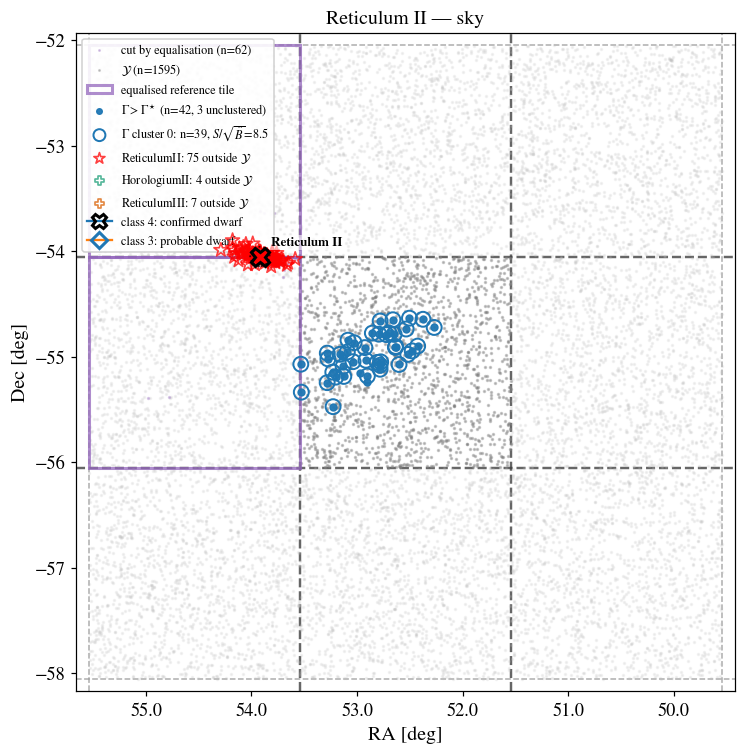

Underful Vlist: Vlist<w=10.52 h=12.73 d=0.00 s=0.00>[Hrule, Glue, Hlist<w=10.52 h=12.53 d=0.00 s=0.00>[Hbox, Hlist<w=7.47 h=12.53 d=0.00 s=0.00>[Vlist<w=7.47 h=12.53 d=0.00 s=0.00>[HCentered<w=7.38 h=2.00 d=0.00 s=0.00>[Glue, Hbox, `\circumflexaccent`, Glue], Vbox, Hlist<w=7.47 h=9.00 d=0.00 s=0.00>[`B`, k0.09]]], Hbox]]
Underful Vlist: Vlist<w=10.52 h=12.73 d=0.00 s=0.00>[Hrule, Glue, Hlist<w=10.52 h=12.53 d=0.00 s=0.00>[Hbox, Hlist<w=7.47 h=12.53 d=0.00 s=0.00>[Vlist<w=7.47 h=12.53 d=0.00 s=0.00>[HCentered<w=7.38 h=2.00 d=0.00 s=0.00>[Glue, Hbox, `\circumflexaccent`, Glue], Vbox, Hlist<w=7.47 h=9.00 d=0.00 s=0.00>[`B`, k0.09]]], Hbox]]


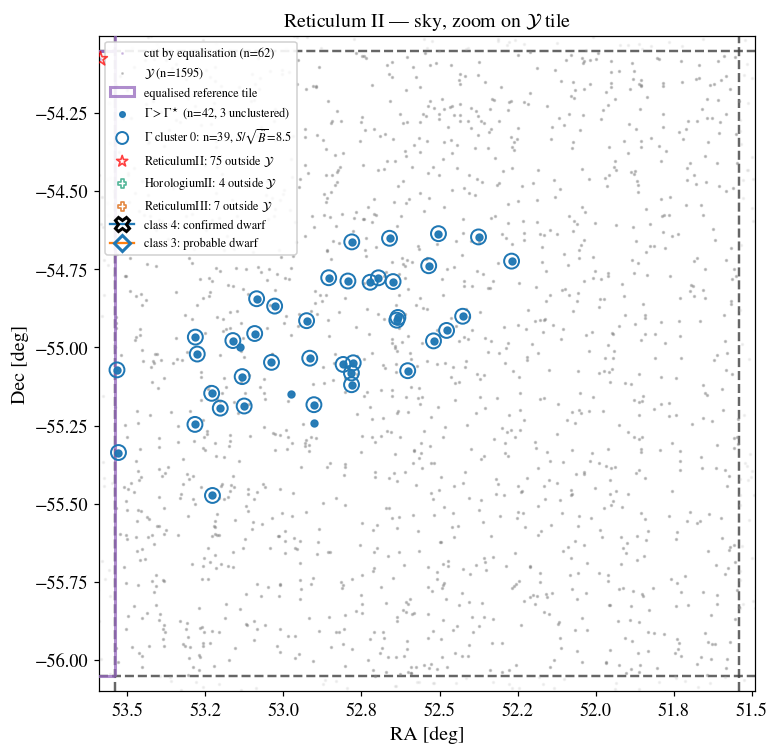

In [18]:
plot_field(run, r, neigh, field_cat, space="sky")
plt.show()

plot_field(run, r, neigh, field_cat, space="sky", zoom_to_Y=True,
           title=f"{DWARF} — sky, zoom on $\\mathcal{{Y}}$ tile")
plt.show()

Underful Vlist: Vlist<w=10.52 h=12.73 d=0.00 s=0.00>[Hrule, Glue, Hlist<w=10.52 h=12.53 d=0.00 s=0.00>[Hbox, Hlist<w=7.47 h=12.53 d=0.00 s=0.00>[Vlist<w=7.47 h=12.53 d=0.00 s=0.00>[HCentered<w=7.38 h=2.00 d=0.00 s=0.00>[Glue, Hbox, `\circumflexaccent`, Glue], Vbox, Hlist<w=7.47 h=9.00 d=0.00 s=0.00>[`B`, k0.09]]], Hbox]]
Underful Vlist: Vlist<w=10.52 h=12.73 d=0.00 s=0.00>[Hrule, Glue, Hlist<w=10.52 h=12.53 d=0.00 s=0.00>[Hbox, Hlist<w=7.47 h=12.53 d=0.00 s=0.00>[Vlist<w=7.47 h=12.53 d=0.00 s=0.00>[HCentered<w=7.38 h=2.00 d=0.00 s=0.00>[Glue, Hbox, `\circumflexaccent`, Glue], Vbox, Hlist<w=7.47 h=9.00 d=0.00 s=0.00>[`B`, k0.09]]], Hbox]]


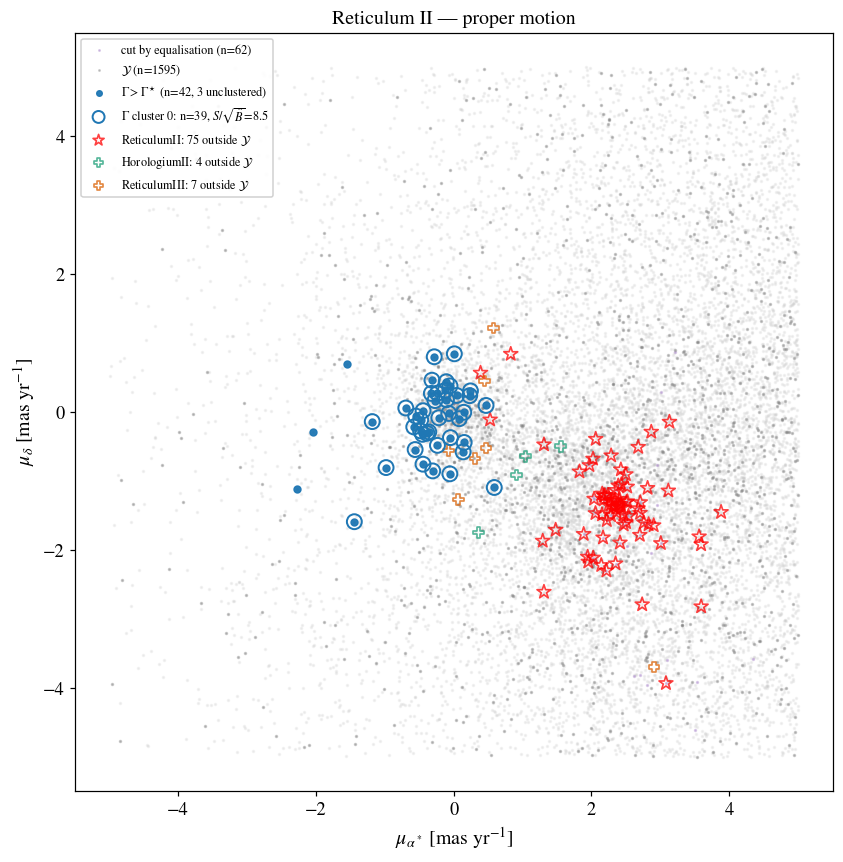

In [19]:
plot_field(run, r, neigh, field_cat, space="pm")
plt.show()

  recomputing 8 per-reference nulls (N=200000, K_M=150) ...
  persistence (upsilon), over the 42 points with Gamma > Gamma*:
    P      :     0     1     2     3     4     5     6     7     8
    count  :     1     8    15    12     6     0     0     0     0
    cum>=P :    42    41    33    18     6     0     0     0     0
  persistence (upsilon), over the 42 points with Gamma > Gamma*:
    P      :     0     1     2     3     4     5     6     7     8
    count  :     1     8    15    12     6     0     0     0     0
    cum>=P :    42    41    33    18     6     0     0     0     0
  persistence (upsilon), over the 42 points with Gamma > Gamma*:
    P      :     0     1     2     3     4     5     6     7     8
    count  :     1     8    15    12     6     0     0     0     0
    cum>=P :    42    41    33    18     6     0     0     0     0
  |A_Gamma|: 42 -> 18  (P >= 3, mode=upsilon)
  clusters : 1 -> 1
    cluster 0: S=  16  B_w=nan  S/sqrt(B)=nan
  persistence (upsilon), over 

Underful Vlist: Vlist<w=10.52 h=12.73 d=0.00 s=0.00>[Hrule, Glue, Hlist<w=10.52 h=12.53 d=0.00 s=0.00>[Hbox, Hlist<w=7.47 h=12.53 d=0.00 s=0.00>[Vlist<w=7.47 h=12.53 d=0.00 s=0.00>[HCentered<w=7.38 h=2.00 d=0.00 s=0.00>[Glue, Hbox, `\circumflexaccent`, Glue], Vbox, Hlist<w=7.47 h=9.00 d=0.00 s=0.00>[`B`, k0.09]]], Hbox]]
Underful Vlist: Vlist<w=10.52 h=12.73 d=0.00 s=0.00>[Hrule, Glue, Hlist<w=10.52 h=12.53 d=0.00 s=0.00>[Hbox, Hlist<w=7.47 h=12.53 d=0.00 s=0.00>[Vlist<w=7.47 h=12.53 d=0.00 s=0.00>[HCentered<w=7.38 h=2.00 d=0.00 s=0.00>[Glue, Hbox, `\circumflexaccent`, Glue], Vbox, Hlist<w=7.47 h=9.00 d=0.00 s=0.00>[`B`, k0.09]]], Hbox]]


({'Y': array([[ 0.80828154, -1.88557061, -1.34861978,  0.50434962],
         [ 0.29703444, -2.00274007,  0.16244467, -0.30234533],
         [ 0.22836119, -1.98000868,  0.90673164,  0.5664577 ],
         ...,
         [-0.73682372,  1.91799867, -1.94941558, -2.27793662],
         [-0.69016576,  2.02296609, -1.14839798,  3.82618073],
         [-0.61253845,  2.00249922,  1.4165107 , -1.5689759 ]]),
  'parts': {'cell_id': array([-1, -1, -1, ..., -1, -1, -1]),
   'inside': array([False, False, False, ..., False, False, False]),
   'test_idx': array([46422, 46428, 46429, ..., 70669, 70670, 70671]),
   'ref_idx_list': [array([34108, 34109, 34110, ..., 58764, 58765, 58767]),
    array([40626, 40628, 40629, ..., 47217, 47218, 47362]),
    array([40470, 40509, 40516, ..., 49929, 49930, 49931]),
    array([45804, 45805, 45806, ..., 65821, 65847, 65850]),
    array([43430, 43431, 43439, ..., 55089, 55090, 55092]),
    array([65122, 65125, 65126, ..., 75229, 75231, 75235]),
    array([54901, 54902,

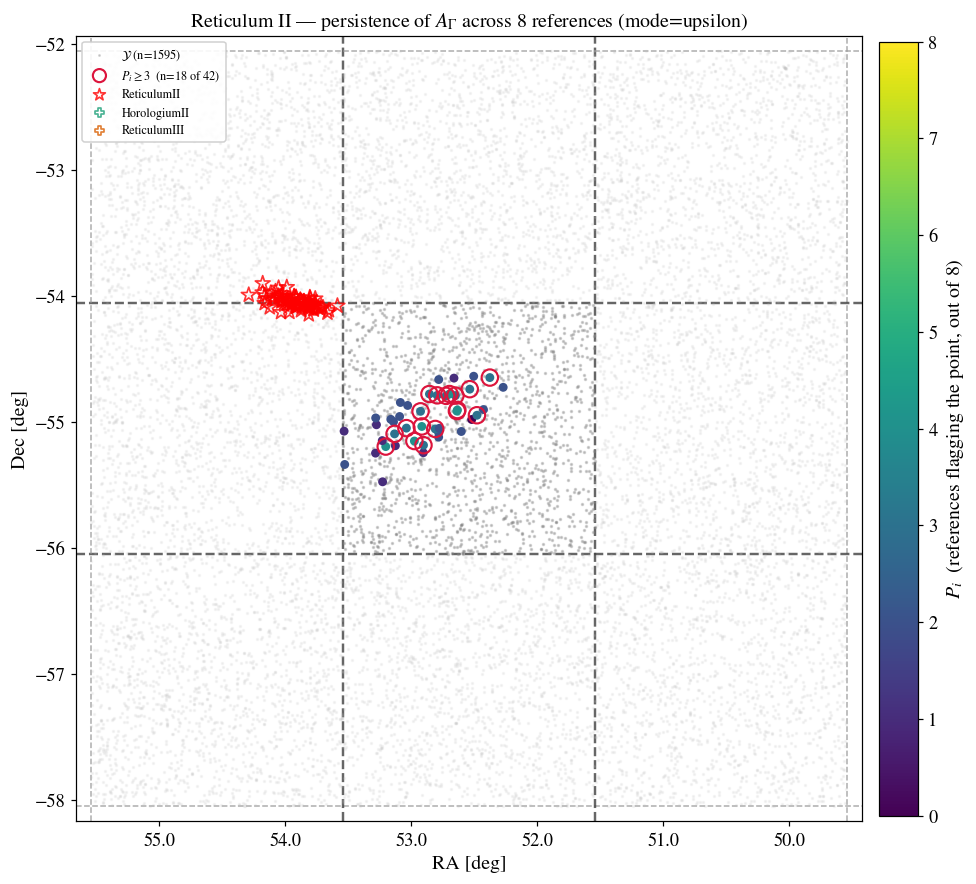

Underful Vlist: Vlist<w=10.52 h=12.73 d=0.00 s=0.00>[Hrule, Glue, Hlist<w=10.52 h=12.53 d=0.00 s=0.00>[Hbox, Hlist<w=7.47 h=12.53 d=0.00 s=0.00>[Vlist<w=7.47 h=12.53 d=0.00 s=0.00>[HCentered<w=7.38 h=2.00 d=0.00 s=0.00>[Glue, Hbox, `\circumflexaccent`, Glue], Vbox, Hlist<w=7.47 h=9.00 d=0.00 s=0.00>[`B`, k0.09]]], Hbox]]
Underful Vlist: Vlist<w=10.52 h=12.73 d=0.00 s=0.00>[Hrule, Glue, Hlist<w=10.52 h=12.53 d=0.00 s=0.00>[Hbox, Hlist<w=7.47 h=12.53 d=0.00 s=0.00>[Vlist<w=7.47 h=12.53 d=0.00 s=0.00>[HCentered<w=7.38 h=2.00 d=0.00 s=0.00>[Glue, Hbox, `\circumflexaccent`, Glue], Vbox, Hlist<w=7.47 h=9.00 d=0.00 s=0.00>[`B`, k0.09]]], Hbox]]


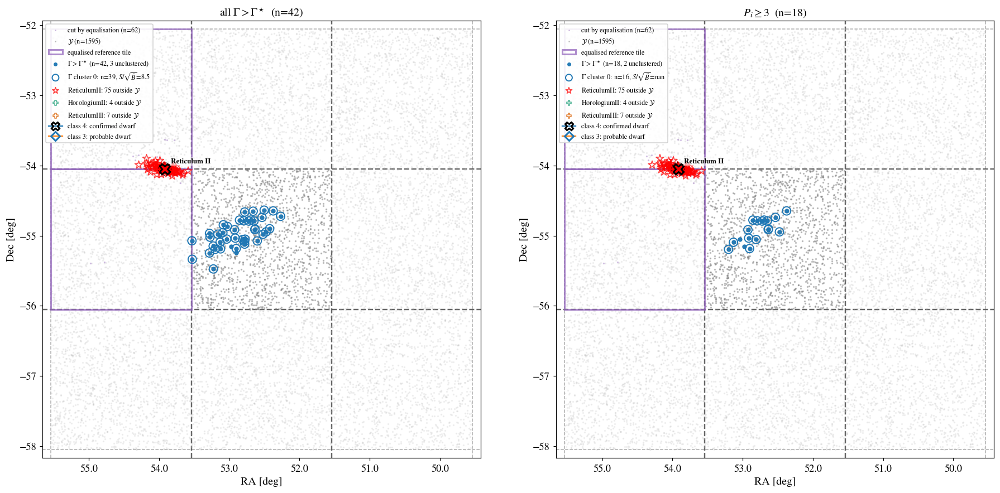

In [20]:
# ---- PERSISTENCE: how many of the 8 references independently flag each point? ----
# Gamma already encodes persistence, but SOFTLY: it is a sum, so one reference with a
# large Upsilon can carry a point over Gamma* with no support from the other seven.
# That is a real failure mode here -- a local hole in one X^(j) (or a system sitting
# inside a reference tile, cf. the Reticulum II effect in the scan) inflates exactly
# one term.  P_i counts how many references flag the point ON THEIR OWN.
#
#   P_i = sum_j  1[ point i is an anomaly under reference j ]
#
# Three definitions of "is an anomaly under reference j", because they are not
# equivalent and the choice matters (see the note at the bottom of this cell):
#   mode="upsilon"    Upsilon_i^(j) > Upsilon*_+^(j)   <- EE-native pruning cut, at p_ext
#   mode="repechage"  i is in reference j's repechaged set    (needs keep_heavy=True)
#   mode="quantile"   Upsilon_i^(j) above the (1-q) quantile of that reference's own
#                     Upsilon over Y  -- a SOFTER cut, decoupled from p_ext

def upsilon_star_by_ref(run, p_ext=None, n_jobs=8, verbose=True):
    """Per-reference pruning threshold Upsilon*_+^(j) = quantile(null_j, 1-p_ext).

    Resolution order, cheapest first:
      1. run["result_dicts"]      -- exact, as EagleEye used it   (keep_heavy)
      2. run["stats_null_multi"]  -- same quantile, recomputed    (keep_heavy)
      3. recompute the per-reference nulls from run["p_list"]     (~seconds, cached)
    """
    p_ext = run["cfg"]["p_ext"] if p_ext is None else float(p_ext)
    rds = run.get("result_dicts")
    if rds is not None:
        try:
            return np.array([float(rd["Upsilon_star_plus"][p_ext]) for rd in rds])
        except KeyError:
            pass          # this run was pruned at a different p_ext; fall through
    snm = run.get("stats_null_multi")
    if snm is None:
        snm = run.setdefault("_null_cache", {}).get(p_ext)
    if snm is None:
        if verbose:
            print(f"  recomputing {len(run['p_list'])} per-reference nulls "
                  f"(N={run['cfg']['null_N']}, K_M={run['cfg']['kM']}) ...")
        with rb._q():
            snm = akd.compute_the_null_multi_refs(
                p_list=run["p_list"], K_M=run["cfg"]["kM"],
                N=run["cfg"]["null_N"], n_jobs=n_jobs)
        run.setdefault("_null_cache", {})[p_ext] = snm
    out = []
    for j in range(len(run["p_list"])):
        rec = snm["by_ref"][j]
        out.append(float(np.quantile(rec["stats_null"][rec["p"]], 1 - p_ext)))
    return np.array(out)


def persistence(run, *, mode="upsilon", p_ext=None, q=0.01, verbose=True):
    """P_i in 0..R: number of references that flag point i on their own.

    Returns (P, flagged) with flagged.shape == (R, nY) so you can see WHICH
    references support a point, not just how many.
    """
    U = np.asarray(run["Upsilon_by_ref"], float)     # (R, nY)
    R, nY = U.shape

    if mode == "repechage":
        books = run.get("EE_books")
        if books is None:
            raise ValueError(
                'mode="repechage" needs run["EE_books"] -- rerun with keep_heavy=True, '
                'or use mode="upsilon" (equivalent cut, pre-IDE/repechage).')
        flagged = np.zeros((R, nY), bool)
        for j, book in enumerate(books):
            oc = book.get("Y_OVER_clusters", {}) or {}
            for cid in oc:
                m = np.asarray(oc[cid].get("Repechaged", []), dtype=int)
                if m.size:
                    flagged[j, m] = True
    elif mode == "upsilon":
        thr = upsilon_star_by_ref(run, p_ext=p_ext, verbose=verbose)
        flagged = U > thr[:, None]
    elif mode == "quantile":
        thr = np.quantile(U, 1 - float(q), axis=1)
        flagged = U > thr[:, None]
    else:
        raise ValueError(f"mode must be upsilon/repechage/quantile, got {mode!r}")

    P = flagged.sum(axis=0).astype(int)
    if verbose:
        A = np.asarray(run["A_Gamma_mask"], bool)
        hist = np.bincount(P[A], minlength=R + 1)
        print(f"  persistence ({mode}), over the {int(A.sum())} points with "
              f"Gamma > Gamma*:")
        print("    P      : " + " ".join(f"{k:>5d}" for k in range(R + 1)))
        print("    count  : " + " ".join(f"{c:>5d}" for c in hist))
        print("    cum>=P : " + " ".join(f"{c:>5d}" for c in hist[::-1].cumsum()[::-1]))
    return P, flagged


# ---- the plot: A_Gamma coloured by how many references support each point -------
def plot_persistence(run, r, neigh=None, field_cat=None, *, min_persist=3,
                     mode="upsilon", p_ext=None, q=0.01, space="sky",
                     P=None, figsize=None, ax=None, title=None, verbose=True):
    """Every point above Gamma*, coloured by P_i; those with P_i >= min_persist ringed.

    This is the diagnostic version -- it shows you what the cut WOULD remove.
    For the filtered run itself (and its recomputed S/sqrt(B)), see
    apply_persistence_filter() below.
    """
    if P is None:
        P, _ = persistence(run, mode=mode, p_ext=p_ext, q=q, verbose=verbose)
    parts, grid = run["parts"], run["grid"]
    test_idx = np.asarray(parts["test_idx"], dtype=int)
    inside   = np.where(np.asarray(parts["inside"], bool))[0]
    R = np.asarray(run["Upsilon_by_ref"]).shape[0]

    if space == "sky":
        xk, yk = "ra", "dec"
        xlab, ylab = "RA [deg]", "Dec [deg]"
        def _ux(a): return grid["ra0"] + akd.wrap_dra_deg(np.asarray(a, float), grid["ra0"])
        _asp = 1.0
    else:
        xk, yk = "pmra", "pmdec"
        xlab = r"$\mu_{\alpha^*}$ [mas yr$^{-1}$]"; ylab = r"$\mu_\delta$ [mas yr$^{-1}$]"
        def _ux(a): return np.asarray(a, float)
        _asp = 1.0

    X_all, Y_all = _ux(r[xk]), np.asarray(r[yk], float)
    if ax is None:
        fig, ax = plt.subplots(figsize=figsize or ((9.0, 8.2) if space == "sky" else (8.5, 8.0)))
    else:
        fig = ax.figure

    ax.scatter(X_all[inside], Y_all[inside], s=1.5, alpha=0.15, color="0.75",
               rasterized=True, zorder=1, label="_nolegend_")
    ax.scatter(X_all[test_idx], Y_all[test_idx], s=1.5, alpha=0.25, color="0.45",
               rasterized=True, zorder=2, label=rf"$\mathcal{{Y}}$ (n={test_idx.size})")
    if space == "sky":
        draw_grid(ax, grid)

    A_idx = np.where(np.asarray(run["A_Gamma_mask"], bool))[0]
    if A_idx.size:
        ridx = test_idx[A_idx]
        sc = ax.scatter(X_all[ridx], Y_all[ridx], c=P[A_idx], s=34,
                        cmap="viridis", vmin=0, vmax=R, zorder=8, rasterized=True,
                        edgecolors="none")
        cb = fig.colorbar(sc, ax=ax, fraction=0.045, pad=0.02)
        cb.set_label(rf"$P_i$  (references flagging the point, out of {R})")
        keep = A_idx[P[A_idx] >= int(min_persist)]
        if keep.size:
            ax.scatter(X_all[test_idx[keep]], Y_all[test_idx[keep]], s=115,
                       facecolors="none", edgecolors="crimson", linewidths=1.4,
                       zorder=9, rasterized=True,
                       label=rf"$P_i \geq {int(min_persist)}$  (n={keep.size} of {A_idx.size})")

    # known members, if the caller passed them (same styling as plot_field)
    if neigh is not None:
        for gal in sorted(neigh, key=lambda g: (not neigh[g]["is_target"], -neigh[g]["n_in_Y"])):
            v = neigh[gal]
            if v["n_in_r"] == 0:
                continue
            st = NSTYLE[gal]
            ax.scatter(_ux(v[xk]), v[yk], s=st["size"] * 0.8, marker=st["marker"],
                       facecolors="none", edgecolors=st["color"], linewidths=1.1,
                       alpha=0.8, zorder=7, label=f"{gal}")

    ax.set_xlabel(xlab); ax.set_ylabel(ylab)
    ax.set_title(title if title is not None
                 else rf"{DWARF} — persistence of $A_\Gamma$ across {R} references "
                      rf"(mode={mode})")
    if space == "sky":
        h = grid["cell_h"]
        ax.set_xlim(grid["ra0"] + 3*h*1.04, grid["ra0"] - 3*h*1.04)
        ax.set_ylim(grid["dec0"] - 3*h*1.04, grid["dec0"] + 3*h*1.04)
        ax.xaxis.set_major_formatter(plt.FuncFormatter(lambda v, _: f"{v % 360:.1f}"))
    ax.set_aspect(_asp, adjustable="box")
    ax.legend(loc="upper left", fontsize=8, markerscale=0.8)
    fig.tight_layout()
    return ax


# ---- the admissibility flag: A_Gamma -> A_Gamma AND (P >= min_persist) ----------
def apply_persistence_filter(run, min_persist=3, *, mode="upsilon", p_ext=None,
                             q=0.01, P=None, verbose=True):
    """Shallow copy of `run` with A_Gamma restricted to persistent points, then
    RE-CLUSTERED and RE-SCORED with the same DBSCAN + weighted-B machinery.

    Re-scoring needs EE_books / SrootB_by_ref / B_by_ref, i.e. keep_heavy=True.
    Without them the clusters are recomputed but s_over_rootB is left NaN.

    CAVEAT (read this before quoting the number it prints):
    Gamma* was calibrated on the bootstrap null of Gamma ALONE. Conjoining a second
    cut makes the realised false-alarm rate smaller than the nominal p_ext by an
    unknown factor, so the filtered S/sqrt(B) is not on the same footing as the
    unfiltered one. See the note at the bottom of this cell for the fix.
    """
    if P is None:
        P, _ = persistence(run, mode=mode, p_ext=p_ext, q=q, verbose=verbose)
    mask = np.asarray(run["A_Gamma_mask"], bool) & (P >= int(min_persist))
    out = dict(run)
    out["A_Gamma_mask"] = mask
    out["persistence"] = P
    out["persistence_cfg"] = {"min_persist": int(min_persist), "mode": mode,
                              "p_ext": p_ext, "q": q}

    have_heavy = all(run.get(k) is not None
                     for k in ("EE_books", "SrootB_by_ref", "B_by_ref"))
    cfg = run["cfg"]
    if have_heavy:
        with rb._q():
            cl = akd.srootB_for_Gamma_clusters_from_Brefs(
                EE_books=run["EE_books"], SrootB_by_ref=run["SrootB_by_ref"],
                B_by_ref=run["B_by_ref"], Y=run["Y"], A_Gamma_mask=mask,
                overlap_min=1, use_cluster_key="Repechaged", weight_mode="overlap",
                dbscan_eps=cfg["dbscan_eps"], dbscan_min_samples=cfg["dbscan_min"],
                cluster_cols=(0, 1, 2, 3))
        out.update(gamma_clusters=cl["gamma_clusters"], cluster_stats=cl["cluster_stats"],
                   labels_all=cl["labels_all"], noise_idx=cl["noise_idx"])
    else:
        labels_all, gc, noise = akd.cluster_A_Gamma_DBSCAN_no_noise(
            run["Y"], mask, eps=cfg["dbscan_eps"], min_samples=cfg["dbscan_min"],
            use_cols=(0, 1, 2, 3))
        out.update(gamma_clusters=gc, labels_all=labels_all, noise_idx=noise,
                   cluster_stats={int(g): {"S": int(np.size(i)), "B_weighted": np.nan,
                                           "s_over_rootB": np.nan, "contributors": [],
                                           "W_num": 0.0, "A_idx": np.asarray(i, int)}
                                  for g, i in gc.items()})
        if verbose:
            print("  WARNING: no EE_books on this run -- clusters recomputed, "
                  "S/sqrt(B) left NaN. Rerun with keep_heavy=True to re-score.")

    if verbose:
        n0, n1 = int(np.asarray(run["A_Gamma_mask"], bool).sum()), int(mask.sum())
        print(f"  |A_Gamma|: {n0} -> {n1}  (P >= {min_persist}, mode={mode})")
        print(f"  clusters : {len(run['gamma_clusters'])} -> {len(out['gamma_clusters'])}")
        for gid in sorted(out["gamma_clusters"]):
            st = out["cluster_stats"][int(gid)]
            print(f"    cluster {gid}: S={st['S']:>4d}  B_w={st['B_weighted']:.2f}  "
                  f"S/sqrt(B)={st['s_over_rootB']:.2f}")
    return out


def compare_persistence_cut(run, r, neigh=None, field_cat=None, *, min_persist=3,
                            mode="upsilon", space="sky", figsize=(19, 8.2)):
    """Side by side: the unfiltered run, and the same run after the P cut.
    Report BOTH numbers -- never replace one with the other silently."""
    P, _ = persistence(run, mode=mode, verbose=True)
    run_p = apply_persistence_filter(run, min_persist, mode=mode, P=P, verbose=True)
    fig, axes = plt.subplots(1, 2, figsize=figsize)
    plot_field(run, r, neigh, field_cat, space=space, ax=axes[0],
               title=rf"all $\Gamma>\Gamma^\star$  (n={int(np.sum(run['A_Gamma_mask']))})")
    plot_field(run_p, r, neigh, field_cat, space=space, ax=axes[1],
               title=rf"$P_i\geq{min_persist}$  (n={int(np.sum(run_p['A_Gamma_mask']))})")
    fig.tight_layout()
    return run_p, axes

# ---------------------------------------------------------------------------
# WHY THIS IS NOT FREE, AND WHAT WOULD MAKE IT RIGOROUS
#
# 1. The cut is well motivated. Fisher's sum is not robust to a single outlying
#    term: one reference with a local deficit at the candidate's position can push
#    Gamma over Gamma* alone. P >= 3 removes exactly that. Given that the scan
#    already showed the result moves when Reticulum II lands in a REFERENCE tile,
#    this is a vulnerability we know we have, not a hypothetical one.
#
# 2. But it breaks the calibration of Gamma*. Gamma* is the (1-p_ext) quantile of
#    the BOOTSTRAP NULL OF GAMMA. Conjoining "and P >= 3" makes the selection
#    strictly tighter, so the realised false-alarm rate drops below p_ext by an
#    unknown factor. Conservative, but no longer a stated level -- and the
#    S/sqrt(B) that comes out cannot be compared with an unfiltered one.
#
#    The fix is cheap: akd.bootstrap_gamma_null_uniform already computes
#    Gb["Upsilon_by_ref"] for every bootstrap and throws it away (line ~240). Keep
#    it (n_boot x R x nY floats ~ 6 MB at the current sizes), apply the SAME
#    P >= min_persist cut to each bootstrap realisation, and take Gamma* as the
#    (1-p_ext) quantile of Gamma over the SURVIVING null points. Then the filtered
#    run is calibrated at p_ext again and the two S/sqrt(B) are comparable.
#
# 3. It may preferentially kill the anomalies stacking is best at. The measured
#    stacked-vs-pooled crossover says stacking wins for DIFFUSE anomalies --
#    precisely the ones whose signal is spread thinly over all 8 references, with
#    each Upsilon^(j) possibly BELOW that reference's Upsilon*_+. Such a point has
#    a large Gamma and a small P, and mode="upsilon" would cut it. If that is the
#    regime of interest, use mode="quantile" with q ~ 0.05-0.1: same persistence
#    logic, softer per-reference bar, decoupled from p_ext.
#
# 4. Recommended default: OFF. Use it as a diagnostic (plot_persistence) and as a
#    reported second number, not as a silent redefinition of A_Gamma. Promote it to
#    an admissibility criterion once (2) is implemented and the scan-level false
#    alarm test has been rerun WITH the cut in place -- that test is the only thing
#    that can say whether it improves the flagging, and by how much.
# ---------------------------------------------------------------------------

persistence(run, mode="upsilon", p_ext=run["cfg"]["p_ext"], verbose=True)   
plot_persistence(run, r, neigh, field_cat, min_persist=3, mode="upsilon",
                    p_ext=run["cfg"]["p_ext"], space="sky", figsize=(9,
    8.2))
apply_persistence_filter(run, min_persist=3, mode="upsilon",
                         p_ext=run["cfg"]["p_ext"], verbose=True)
compare_persistence_cut(run, r, neigh, field_cat, min_persist=3, mode="upsilon", space="sky", figsize=(19, 8.2))

### $\Gamma$ distributions

Requirement 3: the $\Gamma$ distribution **of the null that was actually used** for the
threshold, next to the $\Gamma$ distribution **of the test set**.

- Left: both histograms on a log count axis, with $\Gamma^\star=Q_{1-p_{\rm ext}}(\Gamma_{\rm null})$.
- Middle: survival functions $P(\Gamma>x)$ — this is where you can see how far into the tail
  $\Gamma^\star$ sits, and how few null draws support it (with `N_BOOT=1` the null has only
  $n_\mathcal{Y}$ samples, so the $1-10^{-5}$ quantile is an extrapolation off the last handful
  of points).
- Right: **where the known members land in $\Gamma$**. This is the direct answer to
  "why wasn't the fainter dwarf picked up" — if its members sit below $\Gamma^\star$, EagleEye
  scored them and rejected them; if they are not plotted at all, they never reached $\mathcal{Y}$.

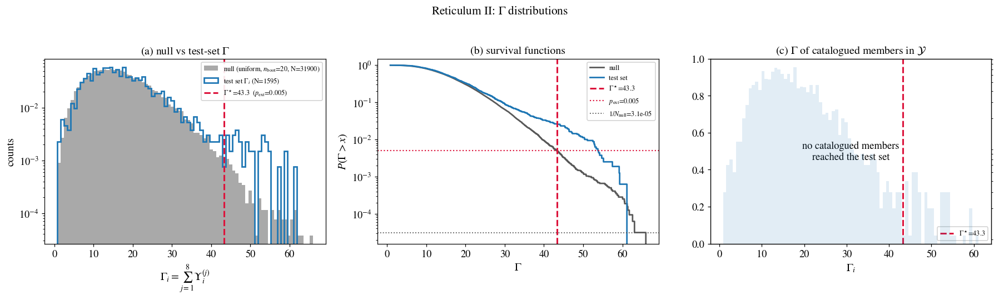

In [21]:
def plot_gamma_distributions(run, neigh, bins=80, figsize=(16.5, 4.8)):
    Gi = run["Gamma_i"]
    Gn = run["Gamma_null_mat"].reshape(-1)
    Gn = Gn[np.isfinite(Gn)]
    Gs = run["Gamma_star"]
    p_ext = run["cfg"]["p_ext"]
    n_boot = run["cfg"]["n_boot"]

    fig, axes = plt.subplots(1, 3, figsize=figsize)

    # ---------- (a) histograms ----------
    ax = axes[0]
    lo = min(Gn.min(), Gi.min()); hi = max(Gn.max(), Gi.max())
    edges = np.linspace(lo, hi, bins)
    ax.hist(Gn, bins=edges, color="0.55", alpha=0.75,
            label=rf"null (uniform, $n_{{\rm boot}}$={n_boot}, N={Gn.size})",density=True)
    ax.hist(Gi, bins=edges, histtype="step", lw=1.8, color="tab:blue",
            label=rf"test set $\Gamma_i$ (N={Gi.size})",density=True)
    ax.axvline(Gs, color="crimson", ls="--", lw=2,
               label=rf"$\Gamma^\star$={Gs:.1f}  ($p_{{\rm ext}}$={p_ext:g})")
    ax.set_yscale("log")
    ax.set_xlabel(r"$\Gamma_i=\sum_{j=1}^{8}\Upsilon_i^{(j)}$")
    ax.set_ylabel("counts")
    ax.set_title("(a) null vs test-set $\\Gamma$")
    ax.legend(fontsize=8)

    # ---------- (b) survival functions ----------
    ax = axes[1]
    for arr, c, lab in ((Gn, "0.35", "null"), (Gi, "tab:blue", "test set")):
        s = np.sort(arr)
        sf = 1.0 - np.arange(1, s.size + 1) / s.size
        ax.step(s, np.clip(sf, 1e-12, None), where="post", color=c, lw=1.8, label=lab)
    ax.axvline(Gs, color="crimson", ls="--", lw=2, label=rf"$\Gamma^\star$={Gs:.1f}")
    ax.axhline(p_ext, color="crimson", ls=":", lw=1.4, label=rf"$p_{{\rm ext}}$={p_ext:g}")
    ax.axhline(1.0 / Gn.size, color="0.35", ls=":", lw=1.2,
               label=rf"1/$N_{{\rm null}}$={1.0/Gn.size:.1e}")
    ax.set_yscale("log")
    ax.set_ylim(max(1e-7, 0.5 / max(Gn.size, Gi.size)), 1.5)
    ax.set_xlabel(r"$\Gamma$")
    ax.set_ylabel(r"$P(\Gamma > x)$")
    ax.set_title("(b) survival functions")
    ax.legend(fontsize=8)

    # ---------- (c) Gamma of known members ----------
    ax = axes[2]
    gals = [g for g in sorted(neigh, key=lambda g: (not neigh[g]["is_target"],
                                                    -neigh[g]["n_in_Y"]))
            if neigh[g]["n_in_Y"] > 0]
    if not gals:
        ax.text(0.5, 0.5, "no catalogued members\nreached the test set",
                ha="center", va="center", transform=ax.transAxes, fontsize=12)
    else:
        rng = np.random.default_rng(0)
        for i, gal in enumerate(gals):
            yi = neigh[gal]["idx_Y"]
            gv = Gi[yi]
            jit = rng.normal(0, 0.06, size=gv.size)
            st = NSTYLE[gal]
            above = gv > run["Gamma_star"]
            ax.scatter(gv, i + jit, s=34, marker=st["marker"],
                       facecolors=st["color"], edgecolors="k", linewidths=0.4,
                       alpha=0.9, zorder=4)
            ax.text(Gi.max() * 1.005, i,
                    f"{int(above.sum())}/{gv.size} above",
                    va="center", fontsize=8.5)
        ax.set_yticks(range(len(gals)))
        ax.set_yticklabels([f"{g}\n(n={neigh[g]['n_in_Y']})" for g in gals], fontsize=9)
        ax.set_ylim(-0.6, len(gals) - 0.4)
    ax.axvline(Gs, color="crimson", ls="--", lw=2, label=rf"$\Gamma^\star$={Gs:.1f}")
    # background density of all Y points, for scale
    ax2 = ax.twinx()
    ax2.hist(Gi, bins=80, color="tab:blue", alpha=0.13, zorder=0)
    ax2.set_yscale("log"); ax2.set_yticks([])
    ax.set_xlabel(r"$\Gamma_i$")
    ax.set_title("(c) $\\Gamma$ of catalogued members in $\\mathcal{Y}$")
    ax.legend(fontsize=8, loc="lower right")

    fig.suptitle(f"{DWARF}: $\\Gamma$ distributions", y=1.02, fontsize=14)
    fig.tight_layout()
    return fig


plot_gamma_distributions(run, neigh)
plt.show()

  references: R = 8, background stars = 1553
  cross-reference correlation: mean +0.369 (min +0.232, max +0.549)
  R_eff = 2.23 of 8 independent references   -> Fisher gain sqrt(R_eff) = 1.49x, not sqrt(8) = 2.83x
    references are largely redundant; the stack is worth much less than 8 independent tests
  mean background Upsilon per reference: [2.13 2.16 2.4  2.09 2.08 2.17 2.02 1.99]
    spread 5.6%   <-- ref 2 is +2.3 sd out: check for a clump deflating its p_hat


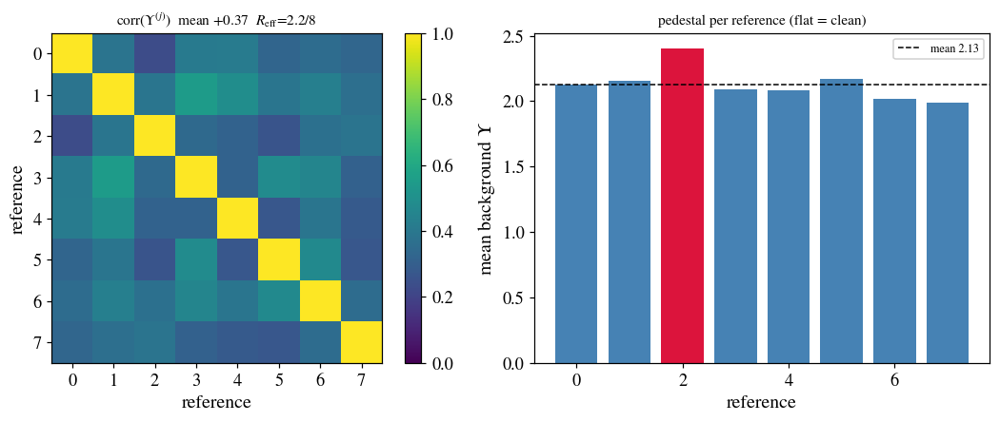

  k_fit (Gamma shape of the null) = 4.56, scale 3.70   [NOT R_eff -- see reference_independence]   -> implied correlation c ~ 0.11
     p_ext  empirical  Gamma(k_fit)   ratio
     1e-01      27.41         27.43   1.001
     1e-02      39.56         40.40   1.021
     1e-03      51.52         51.92   1.008
     1e-04      61.69         62.75   1.017
  ratio drifting above 1 = tail heavier than Gamma; read Gamma* off
  the empirical null, and keep n_boot large enough to resolve it.


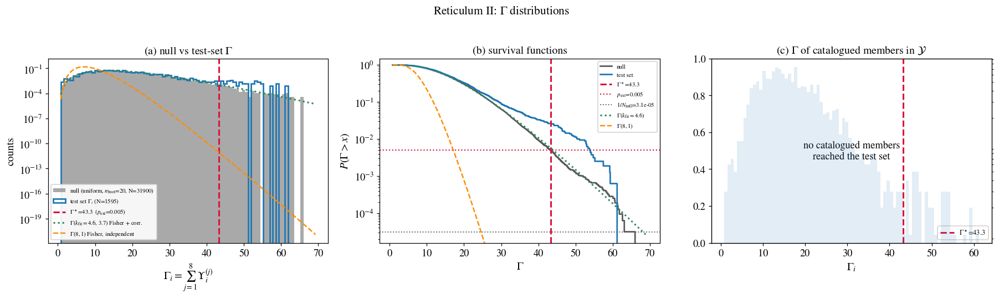


Gamma* = 43.28 (empirical bootstrap, p_ext=0.005)


In [22]:
# ---------------------------------------------------------------------------
# How much independent evidence do the 8 references actually give?
#
# Gamma = sum_j Upsilon^(j) is Fisher's combination, whose sqrt(R) gain assumes R
# INDEPENDENT tests. They are not independent: all eight comparisons share the same
# Y sample, so its Poisson noise is common-mode. Measure the redundancy rather than
# assume it.
#
# Deliberately NOT measured on the bootstrap Gamma null -- that is drawn on synthetic
# uniform data, so a shape fitted to it describes the METHOD (the max-over-k
# selection, the shared-Y correlation) and comes out much the same every run. It
# cannot tell you whether YOUR references differ. This uses the real background stars.
#
# Two numbers:
#   R_eff     = R/(1+(R-1)c) -- the number of references you are effectively
#               stacking. Fisher's gain is sqrt(R_eff), not sqrt(R).
#   pedestal  = mean background Upsilon per reference. A tile whose p_hat has been
#               deflated by a concentrated clump lifts Upsilon for EVERY test star
#               and sits high here -- the NGC 1261 / M3 signature. Flat means clean.
# ---------------------------------------------------------------------------
import importlib
importlib.reload(rb)

ref_info = rb.reference_independence(run)
plt.show()

# ---- and the analytic Fisher nulls over the Gamma distribution ---------------
# Gamma(k_fit, mean/k_fit) is Fisher's null with the reference correlation absorbed
# into an effective dof; Gamma(R,1) is what it would be if the references were
# independent. The gap between them IS the correlation. Diagnostic only -- the fit
# runs high in the tail (+9% at 1e-3), so Gamma* still comes from the bootstrap.
#
# k_fit IS NOT R_eff above. mean^2/var = R_eff * (m^2/v) for marginal Upsilon mean m
# and variance v, so they agree only if Upsilon is Exp(1) -- it is not (m^2/v ~ 1.7).
# k_fit is also fitted to the SYNTHETIC null, R_eff measured on your real background.
# Quote R_eff when asking what stacking buys; k_fit only describes the null's shape.
fig_g = plot_gamma_distributions(run, neigh)
curve_info = rb.overlay_gamma_null_curves(fig_g.axes, run)
plt.show()

# Gamma* is still read off the empirical bootstrap null, never off any curve --
# the true law is a sum of correlated max-of-exponentials and is not Gamma.
print(f"\nGamma* = {run['Gamma_star']:.2f} (empirical bootstrap, p_ext="
      f"{run['cfg']['p_ext']:g})")

## poooled reference run

  pooled X: nY=1595  nX=12510 (8 refs)  p_hat=0.1131  K_M=150 (bound 79)
  Y-side ceiling Upsilon_max=17.88 vs Upsilon*=6.24  -> headroom +11.64
  |Y^+| = 53   clusters = 5
    cluster 0: repechaged=2 pruned=3  S/rootB=undefined (B_hat<=0, estimator out of range)
    cluster 1: repechaged=3 pruned=2  S/rootB=undefined (B_hat<=0, estimator out of range)
    cluster 2: repechaged=1 pruned=2  S/rootB=undefined (B_hat<=0, estimator out of range)
    cluster 3: repechaged=18 pruned=11  S/rootB=0.91
    cluster 4: repechaged=2 pruned=2  S/rootB=undefined (B_hat<=0, estimator out of range)


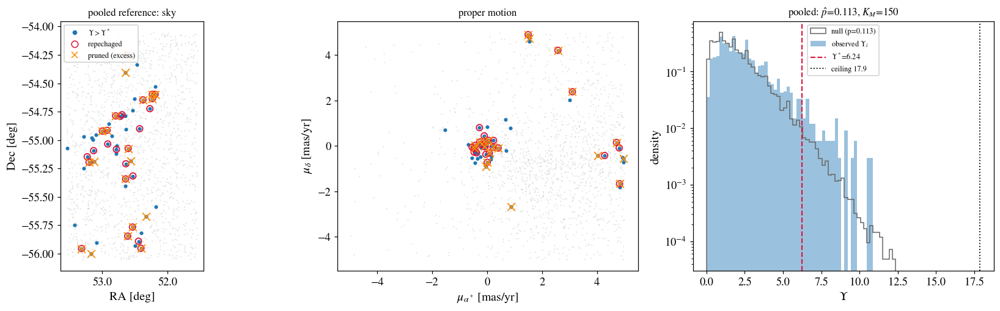

  stacked (Gamma>Gamma*) : 42
  pooled  (flagged    )   : 53
  both                   : 26   (38% of the union)
  stacked only           : 16
  pooled only            : 27


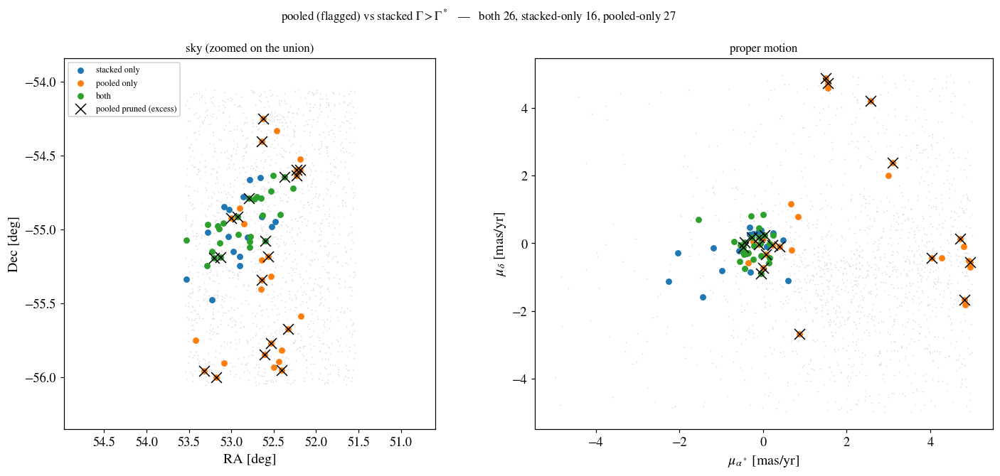


pooled   : |Y^+| = 53
stacked  : cluster 0 has 39 stars, 25 also flagged by the pooled run (64%)

Disagreement is informative, not a bug: the two use different p_hat and different
null calibrations. A feature that survives BOTH is the robust one.


In [23]:
import importlib
importlib.reload(rb)

# The post-equalisation references are reconstructed from `run` (it stores which
# source_ids equalisation removed), so this needs no re-run and no keep_heavy=True.
POOL_KM = 150          # "auto" -> 0.05*min(nX_pooled, nY); or an int
res_pool = rb.pooled_reference_run(run, r, kM=POOL_KM, p_ext=1E-2,
                                   null_N=NULL_N, dpa_Z=DPA_Z, n_jobs=N_JOBS)

fig, _ = rb.plot_pooled(res_pool, run, r)
plt.show()

# ---- overlay: pooled pruned/repechaged vs stacked Gamma > Gamma* -------------
# Coloured by AGREEMENT, not by method: green = found by both, blue = stacked only,
# orange = pooled only, black x = the pooled run's IDE excess mass.
POOL_USE = "flagged"      # "repechaged" | "flagged" | "pruned"
fig2, _, pool_sets = rb.plot_pooled_vs_stacked(res_pool, run, r, use=POOL_USE)
plt.show()

# ---- how does it compare with the stacked-Gamma result? ----------------------
_ti  = np.asarray(run["parts"]["test_idx"], int)
_sid = np.asarray(r["source_id"], dtype="int64")
_pool = set(int(s) for s in _sid[_ti[np.asarray(res_pool["flagged"], int)]])
print(f"\npooled   : |Y^+| = {len(_pool)}")
if run["gamma_clusters"]:
    for _g, _ix in sorted(run["gamma_clusters"].items()):
        _st = set(int(s) for s in _sid[_ti[np.asarray(_ix, int)]])
        _ov = len(_st & _pool)
        print(f"stacked  : cluster {_g} has {len(_st)} stars, "
              f"{_ov} also flagged by the pooled run "
              f"({100*_ov/max(len(_st),1):.0f}%)")
else:
    print("stacked  : no Gamma clusters to compare against")
print("\nDisagreement is informative, not a bug: the two use different p_hat and "
      "different\nnull calibrations. A feature that survives BOTH is the robust one.")

### Per-$\Gamma$-cluster attribution

The table that answers Battaglia's question directly: for every $\Gamma$ cluster, how many
of its stars belong to *each* catalogued system in the field, and how far its centroid sits
from each system's catalog centre.

In [24]:
def gamma_cluster_attribution(run, r, neigh, field_cat=None):
    parts    = run["parts"]
    test_idx = np.asarray(parts["test_idx"], dtype=int)
    r_sid    = np.asarray(r["source_id"], dtype="int64")
    y_sid    = r_sid[test_idx]
    ra_all   = np.asarray(r["ra"], float);   dec_all   = np.asarray(r["dec"], float)
    pmra_all = np.asarray(r["pmra"], float); pmdec_all = np.asarray(r["pmdec"], float)

    rows = []
    for gid in sorted(run["gamma_clusters"]):
        pts  = np.asarray(run["gamma_clusters"][gid], dtype=int)
        ridx = test_idx[pts]
        cs   = run["cluster_stats"][int(gid)]
        sids = set(int(s) for s in y_sid[pts])

        dec_c = float(np.nanmean(dec_all[ridx]))
        w = np.cos(np.deg2rad(dec_c))
        ra_c = float(np.nanmean(ra_all[ridx] * w) / w) if w != 0 else float(np.nanmean(ra_all[ridx]))

        rec = {
            "gid": int(gid), "n": int(pts.size),
            "S": cs["S"], "Bhat": cs["B_weighted"], "S/sqrt(B)": cs["s_over_rootB"],
            "ra_c": ra_c, "dec_c": dec_c,
            "pmra_c": float(np.nanmedian(pmra_all[ridx])),
            "pmdec_c": float(np.nanmedian(pmdec_all[ridx])),
        }

        best, best_n = None, 0
        for gal, v in neigh.items():
            n_ov = len(sids & v["sid_Y"])
            rec[f"n_{gal}"] = n_ov
            rec[f"TPR_{gal}"] = (n_ov / v["n_in_Y"]) if v["n_in_Y"] else np.nan
            if n_ov > best_n:
                best, best_n = gal, n_ov
        rec["best_match"] = best if best else "unidentified"
        rec["n_best"]     = best_n
        rec["purity_known"] = best_n / pts.size if pts.size else np.nan

        if field_cat is not None and len(field_cat):
            d = np.hypot(
                akd.wrap_dra_deg(field_cat["ra"].to_numpy(float), ra_c)
                * np.cos(np.deg2rad(dec_c)),
                field_cat["dec"].to_numpy(float) - dec_c)
            k = int(np.argmin(d))
            rec["nearest_catalog"] = field_cat["Name"].iloc[k]
            rec["sep_deg"] = float(d[k])
        rows.append(rec)

    return pd.DataFrame(rows)


attrib = gamma_cluster_attribution(run, r, neigh, field_cat)
front = ["gid", "n", "S", "Bhat", "S/sqrt(B)", "best_match", "n_best",
         "purity_known", "nearest_catalog", "sep_deg",
         "ra_c", "dec_c", "pmra_c", "pmdec_c"]
front = [c for c in front if c in attrib.columns]
attrib = attrib[front + [c for c in attrib.columns if c not in front]]

with pd.option_context("display.max_columns", None, "display.width", 220):
    print(attrib.to_string(index=False))
attrib

 gid  n  S      Bhat  S/sqrt(B)   best_match  n_best  purity_known nearest_catalog  sep_deg      ra_c      dec_c    pmra_c   pmdec_c  n_HorologiumII  TPR_HorologiumII  n_ReticulumII  TPR_ReticulumII  n_ReticulumIII  TPR_ReticulumIII
   0 39 39 20.937342   8.523223 unidentified       0           0.0    Reticulum II 1.090527 52.878205 -54.963068 -0.233888 -0.084359               0               NaN              0              NaN               0               NaN


,gid,n,S,Bhat,S/sqrt(B),best_match,n_best,purity_known,nearest_catalog,sep_deg,ra_c,dec_c,pmra_c,pmdec_c,n_HorologiumII,TPR_HorologiumII,n_ReticulumII,TPR_ReticulumII,n_ReticulumIII,TPR_ReticulumIII
0,0,39,39,20.937342,8.523223,unidentified,0,0.0,Reticulum II,1.090527,52.878205,-54.963068,-0.233888,-0.084359,0,NaN,0,NaN,0,NaN


### Star-by-star listing

Every star in every $\Gamma$ cluster, by Gaia DR3 `source_id`, tagged with the
catalogued system it belongs to (blank = not a known member of anything in Battaglia+2022).
`gid = -1` collects the points that clear $\Gamma^\star$ but were left unclustered by DBSCAN.

This is the list to send when someone asks *which* stars a detection is made of.

In [25]:
def gamma_cluster_star_list(run, r, neigh, include_unclustered=True):
    """One row per star in A_Gamma: its Gamma cluster and its catalogued identity.

    gid = -1 marks points above Gamma* that DBSCAN left unclustered.
    """
    parts    = run["parts"]
    test_idx = np.asarray(parts["test_idx"], dtype=int)
    Gi       = run["Gamma_i"]

    y_sid = np.asarray(r["source_id"], dtype="int64")[test_idx]

    # source_id -> owning catalogued system (exact match, built in Part 1)
    owner = {}
    for gal, v in neigh.items():
        for s in v["sid_Y"]:
            owner[int(s)] = gal

    has_g    = "phot_g_mean_mag" in r
    has_bprp = "bp_rp" in r

    blocks = [(int(g), np.asarray(p, dtype=int))
              for g, p in sorted(run["gamma_clusters"].items())]
    if include_unclustered:
        blocks.append((-1, np.asarray(run.get("noise_idx", []), dtype=int)))

    rows = []
    for gid, pts in blocks:
        for i, ri in zip(pts, test_idx[pts]):
            s = int(y_sid[i])
            rows.append({
                "gid": gid,
                "cluster": "unclustered" if gid < 0 else f"cluster {gid}",
                "source_id": s,
                "known_member": owner.get(s, ""),
                "Gamma": float(Gi[i]),
                "ra": float(r["ra"][ri]), "dec": float(r["dec"][ri]),
                "pmra": float(r["pmra"][ri]), "pmdec": float(r["pmdec"][ri]),
                "G": float(r["phot_g_mean_mag"][ri]) if has_g else np.nan,
                "bp_rp": float(r["bp_rp"][ri]) if has_bprp else np.nan,
                "Y_index": int(i),
            })

    df = pd.DataFrame(rows, columns=["gid", "cluster", "source_id", "known_member",
                                     "Gamma", "ra", "dec", "pmra", "pmdec",
                                     "G", "bp_rp", "Y_index"])
    if len(df):
        df = df.sort_values(["gid", "Gamma"], ascending=[True, False]).reset_index(drop=True)
    return df


star_list = gamma_cluster_star_list(run, r, neigh)

for gid, grp in star_list.groupby("gid", sort=True):
    head = "unclustered (above Gamma*, DBSCAN noise)" if gid < 0 else f"Gamma cluster {gid}"
    print(f"\n=== {head} : {len(grp)} stars ===")
    counts = grp["known_member"].replace("", "(not catalogued)").value_counts()
    for k, n in counts.items():
        print(f"      {n:5d}  {k}")

print(f"\ntotal listed: {len(star_list)}  (|A_Gamma| = {int(run['A_Gamma_mask'].sum())})")


=== unclustered (above Gamma*, DBSCAN noise) : 3 stars ===
          3  (not catalogued)

=== Gamma cluster 0 : 39 stars ===
         39  (not catalogued)

total listed: 42  (|A_Gamma| = 42)


In [26]:
# full table (source_id is the star's name); Gamma-sorted within each cluster
with pd.option_context("display.max_rows", 400, "display.width", 200):
    display(star_list)

# save the full table as a CSV (same folder as the other run outputs)
STAR_LIST_CSV = CACHE_DIR / f"{TAG}_star_list_full.csv"
star_list.to_csv(STAR_LIST_CSV, index=False)
print(f"saved {len(star_list)} rows -> {STAR_LIST_CSV}")


,gid,cluster,source_id,known_member,Gamma,ra,dec,pmra,pmdec,G,bp_rp,Y_index
0,-1,unclustered,4730946750454234752,,59.310709,52.974656,-55.150202,-2.034837,-0.285878,20.777508,0.501165,696
1,-1,unclustered,4730943825579686400,,47.133989,52.903455,-55.243122,-2.265905,-1.122723,20.652283,1.551056,685
2,-1,unclustered,4730953175724089344,,45.380099,53.140374,-54.997032,-1.543910,0.702744,20.506405,1.869665,724
3,0,cluster 0,4730999866313195008,,61.158743,52.636752,-54.912592,-1.180087,-0.139166,20.602442,1.089638,919
4,0,cluster 0,4730950663167766272,,59.185807,52.915629,-55.034445,-0.548916,-0.058827,20.175831,0.613804,715
5,0,cluster 0,4730933311499777408,,57.452317,53.202123,-55.194310,-0.442394,0.018888,20.297781,0.779053,643
6,0,cluster 0,4731009452680286464,,55.177077,52.722269,-54.791223,-0.280877,0.800853,20.477617,0.222017,964
7,0,cluster 0,4730999900672941568,,54.734637,52.633389,-54.903905,0.147549,-0.004416,19.411249,1.151741,920
8,0,cluster 0,4731001000184544256,,54.199454,52.477527,-54.945476,0.081984,-0.097317,20.706331,1.789227,925
9,0,cluster 0,4730957947432380032,,53.932542,52.925693,-54.914221,0.044547,0.239469,20.289852,0.594830,745


saved 42 rows -> /data/ascaffid/Dwarfs/field_diagnostics/Reticulum_II_dra-0.810_ddec-1.000_h1.0000_kM150_pext0.005_nullN200000_boot20_Z2.65_eps1_ms5_seed42_eq5x4kautoh0.5_star_list_full.csv


In [27]:
# just the named members, per cluster -- the compact version for an email
named = star_list[star_list["known_member"] != ""]
for gid, grp in named.groupby("gid", sort=True):
    head = "unclustered" if gid < 0 else f"cluster {gid}"
    for gal, sub in grp.groupby("known_member"):
        print(f"{head} / {gal}: {len(sub)} stars")
        print("   " + ", ".join(str(s) for s in sub["source_id"].tolist()))

In [28]:
# ---- the one-line verdict --------------------------------------------------
# Reconcile the two figures: |A_Gamma| = (points in clusters) + (DBSCAN noise).
# Noise points clear Gamma* but are in NO cluster, so they appear in panel (c) of
# the Gamma figure and as open diamonds in the sky/PM plots, but never in the
# attribution table.
_n_A     = int(run["A_Gamma_mask"].sum())
_n_clust = sum(len(v) for v in run["gamma_clusters"].values())
_noise   = np.asarray(run["noise_idx"], dtype=int)
print(f"|A_Gamma| = {_n_A}  =  {_n_clust} in clusters  +  {_noise.size} unclustered "
      f"(DBSCAN noise, min_samples={run['cfg']['dbscan_min']}, eps={run['cfg']['dbscan_eps']})")
if _noise.size:
    _ysid = np.asarray(r["source_id"], dtype="int64")[np.asarray(parts["test_idx"], int)]
    for i in _noise:
        _owner = next((g for g, v in neigh.items() if int(_ysid[i]) in v["sid_Y"]),
                      "(not a catalogued member)")
        print(f"    unclustered: Y#{i:6d}  Gamma={Gamma_i[i]:7.2f}  ->  {_owner}")
print()

print(f"TARGET: {DWARF}")
tgt = [g for g, v in neigh.items() if v["is_target"]]
tgt = tgt[0] if tgt else None

if tgt is None:
    print("  !! no Battaglia entry for the target — cannot assess recovery")
else:
    v = neigh[tgt]
    print(f"  members in window / passing cuts / in Y : "
          f"{v['n_bat']} / {v['n_in_r']} / {v['n_in_Y']}")
    if v["n_in_Y"]:
        n_rec = int((Gamma_i[v["idx_Y"]] > Gamma_star).sum())
        print(f"  members with Gamma > Gamma*             : {n_rec} / {v['n_in_Y']}"
              f"  ({n_rec/v['n_in_Y']:.1%})")
        print(f"  their max/median Gamma                  : "
              f"{Gamma_i[v['idx_Y']].max():.1f} / {np.median(Gamma_i[v['idx_Y']]):.1f}"
              f"   (Gamma* = {Gamma_star:.1f})")

for _, a in attrib.iterrows():
    verdict = ("<-- TARGET" if a["best_match"] == tgt
               else ("<-- UNIDENTIFIED" if a["best_match"] == "unidentified"
                     else "<-- INTERLOPER"))
    print(f"  cluster {int(a['gid'])}: n={int(a['n']):4d}  best match = "
          f"{a['best_match']:18s} ({int(a['n_best'])} stars, "
          f"{a['purity_known']:.0%} of cluster)  {verdict}")

|A_Gamma| = 42  =  39 in clusters  +  3 unclustered (DBSCAN noise, min_samples=5, eps=1.0)
    unclustered: Y#   685  Gamma=  47.13  ->  (not a catalogued member)
    unclustered: Y#   696  Gamma=  59.31  ->  (not a catalogued member)
    unclustered: Y#   724  Gamma=  45.38  ->  (not a catalogued member)

TARGET: Reticulum II
  members in window / passing cuts / in Y : 75 / 75 / 0
  cluster 0: n=  39  best match = unidentified       (0 stars, 0% of cluster)  <-- UNIDENTIFIED


### Colour–magnitude diagram

Battaglia explicitly asked for a CMD of the EagleEye sources (in the Reticulum II case,
to judge whether the unidentified overdensity looks like a real stellar system).

**Photometry without the ESA archive.** BP/RP are not in the rows
`analyze_known_dwarfs.py` stores, but we don't need to re-run the box query to get them —
we already know exactly which stars we want, so we can look them up by `source_id` on an
independent Gaia DR3 mirror. We use the **GAVO Heidelberg** TAP service
(`https://dc.zah.uni-heidelberg.de/tap`, table `gaia.dr3lite`), which is a different
institution and a different machine from `gea.esac.esa.int`.

Notes:

- `gaia.dr3lite` has no `bp_rp` column; we form it as $G_{\rm BP}-G_{\rm RP}$.
- Its **sync** endpoint has a short wall-clock limit — a full 10°×10° box query times out,
  so we query by explicit `source_id` list in chunks. The whole $\mathcal{Y}$ tile
  (~6k stars) takes ~12 s.
- Because we match on `source_id`, the photometry is attached to *exactly* the stars the
  analysis used. Nothing about the detection changes.

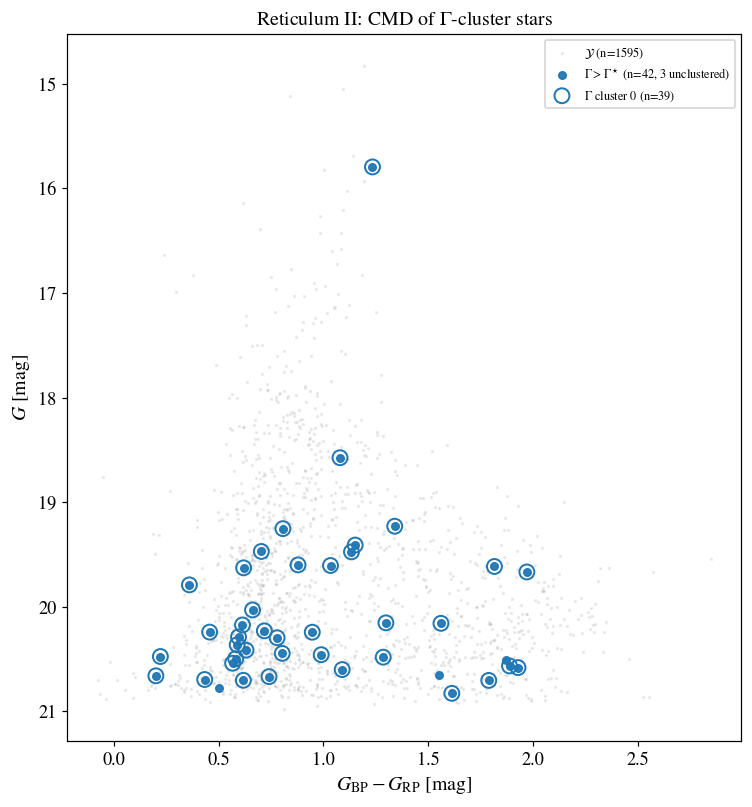

In [29]:
def plot_cmd(run, r, neigh, figsize=(7.0, 7.5), gmax=None):
    if "bp_rp" not in r or "phot_g_mean_mag" not in r:
        print("no BP/RP + G in the Gaia table — set FETCH_PHOTOMETRY=True, "
              "SEED_FROM_RUN_PICKLE=False, and re-run the query cell")
        return None

    parts    = run["parts"]
    test_idx = np.asarray(parts["test_idx"], dtype=int)
    bp_rp = np.asarray(r["bp_rp"], float)
    gmag  = np.asarray(r["phot_g_mean_mag"], float)

    fig, ax = plt.subplots(figsize=figsize)
    ax.scatter(bp_rp[test_idx], gmag[test_idx], s=1.5, alpha=0.15, color="0.6",
               rasterized=True, label=rf"$\mathcal{{Y}}$ (n={test_idx.size})")

    # same convention as plot_field: all of A_Gamma in blue, cluster membership as a ring
    A_idx = np.where(np.asarray(run["A_Gamma_mask"], bool))[0]
    n_noise = int(np.asarray(run.get("noise_idx", []), dtype=int).size)
    if A_idx.size:
        ridx = test_idx[A_idx]
        lab = rf"$\Gamma>\Gamma^\star$ (n={A_idx.size}"
        lab += rf", {n_noise} unclustered)" if n_noise else ")"
        ax.scatter(bp_rp[ridx], gmag[ridx], s=24, color="tab:blue", alpha=0.95,
                   zorder=8, label=lab)

    for k, gid in enumerate(sorted(run["gamma_clusters"])):
        # if k == 1:
        #     continue
        pts = np.asarray(run["gamma_clusters"][gid], dtype=int)
        if pts.size == 0:
            continue
        ridx = test_idx[pts]
        ax.scatter(bp_rp[ridx], gmag[ridx], s=95, facecolors="none",
                   edgecolors=gamma_colour(k), linewidths=1.3, zorder=9,
                   label=rf"$\Gamma$ cluster {gid} (n={pts.size})")

    for gal in sorted(neigh, key=lambda g: (not neigh[g]["is_target"], -neigh[g]["n_in_Y"])):
        v = neigh[gal]
        if v["n_in_Y"] == 0:
            continue
        st = NSTYLE[gal]
        ridx = test_idx[v["idx_Y"]]
        ax.scatter(bp_rp[ridx], gmag[ridx], s=st["size"], marker=st["marker"],
                   facecolors="none", edgecolors=st["color"], linewidths=1.3,
                   zorder=5, label=f"{gal} members (n={v['n_in_Y']})")

    ax.invert_yaxis()
    if gmax is not None:
        ax.set_ylim(gmax, ax.get_ylim()[1])
    ax.set_xlabel(r"$G_{\rm BP}-G_{\rm RP}$ [mag]")
    ax.set_ylabel(r"$G$ [mag]")
    ax.set_title(f"{DWARF}: CMD of $\\Gamma$-cluster stars")
    ax.legend(fontsize=8)
    fig.tight_layout()
    return ax


plot_cmd(run, r, neigh)
plt.show()

In [30]:
# ---- export a compact figure set + the attribution table -------------------
OUT = CACHE_DIR / TAG
OUT.mkdir(parents=True, exist_ok=True)

for space, fn in (("sky", "sky"), ("pm", "pm")):
    ax = plot_field(run, r, neigh, field_cat, space=space)
    ax.figure.savefig(OUT / f"{TAG}_{fn}.png", bbox_inches="tight")
    plt.close(ax.figure)

ax = plot_field(run, r, neigh, field_cat, space="sky", zoom_to_Y=True,
                title=f"{DWARF} — sky, zoom on $\\mathcal{{Y}}$ tile")
ax.figure.savefig(OUT / f"{TAG}_sky_zoom.png", bbox_inches="tight"); plt.close(ax.figure)

fig = plot_gamma_distributions(run, neigh)
fig.savefig(OUT / f"{TAG}_gamma_dist.png", bbox_inches="tight"); plt.close(fig)

ax = plot_cmd(run, r, neigh)
if ax is not None:
    ax.figure.savefig(OUT / f"{TAG}_cmd.png", bbox_inches="tight"); plt.close(ax.figure)

attrib.to_csv(OUT / f"{TAG}_attribution.csv", index=False)
star_list.to_csv(OUT / f"{TAG}_star_list.csv", index=False)
member_table.to_csv(OUT / f"{TAG}_members.csv", index=False)
print("wrote:", *sorted(p.name for p in OUT.iterdir()), sep="\n  ")

Underful Vlist: Vlist<w=10.52 h=12.73 d=0.00 s=0.00>[Hrule, Glue, Hlist<w=10.52 h=12.53 d=0.00 s=0.00>[Hbox, Hlist<w=7.47 h=12.53 d=0.00 s=0.00>[Vlist<w=7.47 h=12.53 d=0.00 s=0.00>[HCentered<w=7.38 h=2.00 d=0.00 s=0.00>[Glue, Hbox, `\circumflexaccent`, Glue], Vbox, Hlist<w=7.47 h=9.00 d=0.00 s=0.00>[`B`, k0.09]]], Hbox]]


Underful Vlist: Vlist<w=10.52 h=12.73 d=0.00 s=0.00>[Hrule, Glue, Hlist<w=10.52 h=12.53 d=0.00 s=0.00>[Hbox, Hlist<w=7.47 h=12.53 d=0.00 s=0.00>[Vlist<w=7.47 h=12.53 d=0.00 s=0.00>[HCentered<w=7.38 h=2.00 d=0.00 s=0.00>[Glue, Hbox, `\circumflexaccent`, Glue], Vbox, Hlist<w=7.47 h=9.00 d=0.00 s=0.00>[`B`, k0.09]]], Hbox]]
Underful Vlist: Vlist<w=10.52 h=12.73 d=0.00 s=0.00>[Hrule, Glue, Hlist<w=10.52 h=12.53 d=0.00 s=0.00>[Hbox, Hlist<w=7.47 h=12.53 d=0.00 s=0.00>[Vlist<w=7.47 h=12.53 d=0.00 s=0.00>[HCentered<w=7.38 h=2.00 d=0.00 s=0.00>[Glue, Hbox, `\circumflexaccent`, Glue], Vbox, Hlist<w=7.47 h=9.00 d=0.00 s=0.00>[`B`, k0.09]]], Hbox]]


wrote:
  Reticulum_II_dra-0.810_ddec-1.000_h1.0000_kM150_pext0.005_nullN200000_boot20_Z2.65_eps1_ms5_seed42_eq5x4kautoh0.5_attribution.csv
  Reticulum_II_dra-0.810_ddec-1.000_h1.0000_kM150_pext0.005_nullN200000_boot20_Z2.65_eps1_ms5_seed42_eq5x4kautoh0.5_cmd.png
  Reticulum_II_dra-0.810_ddec-1.000_h1.0000_kM150_pext0.005_nullN200000_boot20_Z2.65_eps1_ms5_seed42_eq5x4kautoh0.5_gamma_dist.png
  Reticulum_II_dra-0.810_ddec-1.000_h1.0000_kM150_pext0.005_nullN200000_boot20_Z2.65_eps1_ms5_seed42_eq5x4kautoh0.5_members.csv
  Reticulum_II_dra-0.810_ddec-1.000_h1.0000_kM150_pext0.005_nullN200000_boot20_Z2.65_eps1_ms5_seed42_eq5x4kautoh0.5_pm.png
  Reticulum_II_dra-0.810_ddec-1.000_h1.0000_kM150_pext0.005_nullN200000_boot20_Z2.65_eps1_ms5_seed42_eq5x4kautoh0.5_sky.png
  Reticulum_II_dra-0.810_ddec-1.000_h1.0000_kM150_pext0.005_nullN200000_boot20_Z2.65_eps1_ms5_seed42_eq5x4kautoh0.5_sky_zoom.png
  Reticulum_II_dra-0.810_ddec-1.000_h1.0000_kM150_pext0.005_nullN200000_boot20_Z2.65_eps1_ms5_seed42_e


====================================================================================================
## Some theroy regarding the $B_0$ attenuation (Claude)

Model. Let $B_0$ be the true field density in the 4D feature space. Tile $j$ realises $f_j = B_0 + \delta_j$, and the test tile realises $f_Y = B_0 + \delta_Y + S$. Work with the local log density ratio, which is the natural reparametrisation-invariant effect size:

$$\lambda_i^{(j)} = \log\frac{f_Y(z_i)}{f_j(z_i)} ;\approx; s_i + \eta_i - d_i^{(j)}, \qquad s=\tfrac{S}{B_0},\ \eta=\tfrac{\delta_Y}{B_0},\ d^{(j)}=\tfrac{\delta_j}{B_0}$$

The geometry gives you more than $R^{-1/2}$. Your 3×3 ring isn't 8 arbitrary references — it's 4 antipodal pairs about the centre: (0,8), (1,7), (2,6), (3,5). For a perturbation varying smoothly across the field, an antipodal pair averages to the centre value plus $O(h^2)$: the linear gradient cancels exactly, the same mechanism that makes a central difference second-order. So $\bar d_i$ isn't suppressed by $\sqrt{8}$, it's suppressed to curvature order. Your intuition about smearing out perturbations around $B_0$ is right, and stronger than the noise-averaging argument suggests.

Υ is a $-\log p$-value: non-negative, one-sided, and convex in the effect size. So for an antipodal pair whose perturbations are $+a$ and $-a$, the effect sizes cancel but $\Upsilon(+a) + \Upsilon(-a) > 0$. Summing Υ rectifies the tile perturbations instead of cancelling them. The 3×3 symmetry buys you a second-order background estimate, and the aggregation step throws it away — that's the mathematical answer to why you can prune better against $B_0$.

For a neighbourhood containing $a$ points of $Y$ and $b_j$ of $X^{(j)}$:

$$\hat\lambda_i^{(j)} = \log\frac{a/n_Y}{b_j/n_{X_j}}, \qquad \mathrm{Var} \approx \tfrac1a + \tfrac1{b_j}$$

Average the signed $\hat\lambda^{(j)}$ — now the gradient cancels as the counts above show — and form $Z_i = \bar\lambda_i/\mathrm{sd}(\bar\lambda_i)$, which is asymptotically $N(0,1)$ under $f_Y = \overline{f_j}$. That gives you a calibrated statistic with no uniform-hypercube bootstrap required, which independently solves the Γ* problem.

Prune on $Z_i$ rather than Γ, and IDE is then equalising $Y$ against $\hat B_0$ directly.

Two results worth knowing before you build it
1. Sensitivity saturates at $\sqrt2$. Since $Y$ is shared across all comparisons, its Poisson noise is common-mode and never averages down:

$$\mathrm{Var}(\bar\lambda) = \underbrace{\tfrac1a}{\text{irreducible}} + \underbrace{\tfrac1{Rb}}{\text{averages down}}$$

For balanced tiles ($a\approx b$): $R{=}1 \to 2/a$, $R{=}8 \to 1.125/a$, $R{=}\infty \to 1/a$. So 8 references gives a $\sqrt{2/1.125} = 1.33\times$ gain in $Z$, against a ceiling of $1.41\times$ — 94% of everything available. More references buy essentially nothing in sensitivity. Their value is bias reduction (killing $\bar d$), not variance. Worth knowing before anyone proposes a 5×5 grid.

2. Heterogeneity gives you a calibrated version of last message's $N_{\rm eff}$. This is textbook random-effects meta-analysis: within-reference variance plus between-reference variance $\tau^2$. Cochran's

$$Q_i = \sum_j w_j(\hat\lambda_i^{(j)} - \bar\lambda_i)^2 ;\sim; \chi^2_{R-1}$$

under homogeneity, with $I^2 = \max(0, (Q-(R-1))/Q)$. So "is this a consensus detection or one bad tile" stops being a heuristic ratio and becomes a test with a known null. $\tau^2 > 0$ is the systematic, quantified — exactly the quantity your summary.md §16 lists as an open question.

This also refines what I told you two messages ago. I said don't pool the references. The correct statement is: pool for the central value (efficient, and gradient-cancelling by symmetry), keep the between-tile spread as the systematic error bar. That's the random-effects model, and it's strictly better than either pooling naively or averaging $S/\sqrt{\hat B}$.

Implementation constraint you'd hit immediately
Each reference currently selects its own $k_j$ via the max-over-$k$ step, so the eight $\hat\lambda^{(j)}$ are effect sizes measured at different spatial scales — averaging them mixes scales and the meta-analysis is ill-defined. You'd need a common $k$ across references: either fix a scale ladder a priori, or select $k$ once on the pooled comparison and evaluate all eight there. The selection-over-$k$ also breaks the clean asymptotics, which is the one place you'd still want the MC null.

On validity: the normal approximation needs $k,q(1-q)$ reasonably large. EagleEye already enforces $k \geq 20$, and $k^*$ for real anomalies runs into the hundreds, so it holds comfortably — and it's most accurate near threshold where $q \approx \hat p$, which is exactly where you need the calibration. It degrades in the far tail, where detections are unambiguous anyway.

Want me to prototype the signed-$\hat\lambda$ + random-effects statistic on Bootes II and compare its ranking against Γ? The Bootes I / Bootes II discrimination is a good test case, since we already know Γ ranks the two Bootes II stars

## Part 5 — Automated robustness scan

Two stages, both unsupervised:

1. **Characterise.** Take the run that executed last, describe every $\Gamma$ cluster
   (centroid, 90th-percentile extent, $S/\sqrt{\hat B}$, and whether it matches anything
   known), and pick a target — by default the strongest cluster matching *nothing*.
2. **Scan.** Re-run the pipeline on 8 grids anchored on that anomaly's own centroid and
   extent, and check whether it survives. Matching is by Gaia `source_id` throughout,
   never by index, because Y-index space changes with every grid.

**Three confounds are pinned**, without which a box-size scan is meaningless:

| confound | why it matters | how it is fixed |
|---|---|---|
| the metric | positional MADs scale $\propto h$ while PM MADs are pinned by the $\pm5$ cut, so the position:PM weighting changes $\sim\!2.6\times$ over $h=0.83$–$2.17$ | `freeze_scale=True` — fit med/MAD once on the nominal grid, reuse everywhere |
| $K_M$ | the method needs $K_M\le0.05\min(n_X,n_Y)$; shrinking the box silently violates it (at $n_Y=1141$ the bound is 57, not 100) | `km_mode="bounded"` clips it per configuration |
| DBSCAN `eps` | in scaled units, so its physical radius tracks the MAD | freezing the scale makes a fixed `eps` a fixed angular size |

Implementation lives in [`robustness.py`](robustness.py).

In [31]:
import importlib, robustness as rb
importlib.reload(rb)          # so edits to robustness.py take effect without a restart

# ======================= SCAN CONFIGURATION =======================
SCAN_P_EXT   = P_EXT         # exceedance level for the scan (defaults to Part 0's)
SCAN_KM      = "auto"             # NOMINAL K_M; clipped per config by km_mode="bounded".
                               # "auto" -> locality bound per config; km_mode ignored.
SCAN_NULL_N  = NULL_N
SCAN_N_BOOT  = N_BOOT
# SCAN_RHO and SCAN_SCALES are set in the CONFIG cell, so the single Gaia query
# up in Part 1 is already sized to cover every grid this scan will build.
SCAN_FREEZE  = True           # pin the metric to the nominal grid
SCAN_KM_MODE = "bounded"      # "bounded" | "proportional" | "fixed"
PREFER_UNMATCHED = True       # target the strongest cluster matching nothing known

# The run to characterise: whatever ran last. Point this at any run dict you like,
# e.g. sweep[(h, s)] from Part 4.
SCAN_RUN   = run
SCAN_TABLE = r                # the star table SCAN_RUN was computed on

print(f"scan: p_ext={SCAN_P_EXT:g}  n_boot={SCAN_N_BOOT}  "
      f"rho={SCAN_RHO}  scales={SCAN_SCALES}")
# The two K_M's do different jobs and are set in different cells -- spell both out.
print(f"  measurement K_M = {SCAN_KM!r}"
      + ("  (locality bound per config; km_mode ignored)" if SCAN_KM == "auto"
         else f"  km_mode={SCAN_KM_MODE!r}"))
print(f"  equalisation    = {'ON' if EQUALISE else 'OFF'}"
      + (f", EQ_KM={EQ_KM!r} (per reference, per pass), S/rootB>{EQ_SRB:g}, "
         f"<={EQ_MAX_PASSES} passes, headroom>{EQ_HEADROOM:g}   [set in Part 0]"
         if EQUALISE else ""))
if EQUALISE and SCAN_P_EXT != P_EXT:
    print(f"  note: equalisation here uses SCAN_P_EXT={SCAN_P_EXT:g}, not P_EXT="
          f"{P_EXT:g} -- Upsilon* depends on it, so the cut sets differ from Part 2.")
print(f"characterising the run at h={SCAN_RUN['grid']['cell_h']:.4f}, "
      f"{len(SCAN_RUN['gamma_clusters'])} cluster(s)")

scan: p_ext=0.005  n_boot=20  rho=0.9  scales=(0.6666666666666666, 1.5)
  measurement K_M = 'auto'  (locality bound per config; km_mode ignored)
  equalisation    = ON, EQ_KM='auto' (per reference, per pass), S/rootB>5, <=4 passes, headroom>0.5   [set in Part 0]
characterising the run at h=1.0000, 1 cluster(s)


In [32]:
# ---- 1) what did we find, and which is unexplained? --------------------------
KNOWN_IDS = {g: set(d[BAT_ID].astype("int64").tolist()) for g, d in bat_in_window.items()}

anom_df = rb.characterise_anomalies(SCAN_RUN, SCAN_TABLE, known_ids=KNOWN_IDS)
_show = [c for c in ("gid", "n", "ra_c", "dec_c", "pmra_c", "pmdec_c", "r90_deg",
                     "pm_r90", "S", "B_weighted", "s_over_rootB",
                     "matched_to", "n_matched", "unmatched") if c in anom_df.columns]
print(anom_df[_show].to_string(index=False))

TARGET = rb.pick_target(anom_df, prefer_unmatched=PREFER_UNMATCHED)
print(f"\nTARGET  gid={TARGET['gid']}  n={TARGET['n']}  "
      f"unmatched={TARGET['unmatched']}  matched_to={TARGET['matched_to'] or '-'}")
print(f"  centroid  ({TARGET['ra_c']:.4f}, {TARGET['dec_c']:.4f})  "
      f"PM ({TARGET['pmra_c']:+.3f}, {TARGET['pmdec_c']:+.3f})")
print(f"  extent    r90={TARGET['r90_deg']:.4f} deg   S/sqrt(B)={TARGET['s_over_rootB']:.2f}")

 gid  n      ra_c      dec_c    pmra_c   pmdec_c  r90_deg   pm_r90  S  B_weighted  s_over_rootB matched_to  n_matched  unmatched
   0 39 52.878205 -54.963068 -0.233888 -0.084359 0.398221 0.950261 39   20.937342      8.523223                     0       True

TARGET  gid=0  n=39  unmatched=True  matched_to=-
  centroid  (52.8782, -54.9631)  PM (-0.234, -0.084)
  extent    r90=0.3982 deg   S/sqrt(B)=8.52


label                h   dRA_raw   dRA_sky     dDec
nominal         1.0000    +0.000    +0.000   +0.000
shiftE          1.0000    +0.231    +0.132   +0.000
shiftW          1.0000    -0.231    -0.132   +0.000
shiftN          1.0000    +0.000    +0.000   +0.497
shiftS          1.0000    +0.000    +0.000   -0.497
scale x0.67     0.6667    +0.000    +0.000   +0.000
scale x1.50     1.5000    +0.000    +0.000   +0.000
diagonal        1.0000    +0.163    +0.094   +0.351

needs RA +/-4.70, Dec +/-4.70 about the anomaly
table spans (per side) RA +/-7.51, Dec +/-7.64  ->  OK


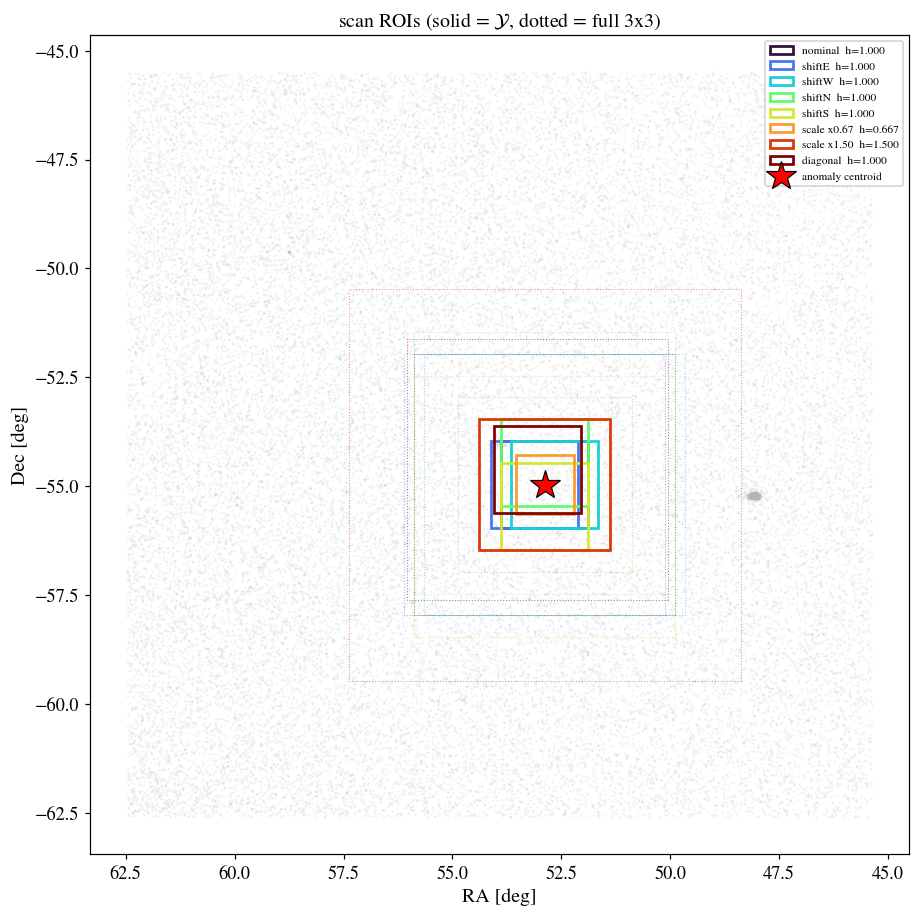

In [33]:
# ---- 2) the scan grids, and the box they need --------------------------------
SCAN_CFGS = rb.scan_configs(TARGET, h0=float(SCAN_RUN["grid"]["cell_h"]),
                            rho=SCAN_RHO, scale_factors=SCAN_SCALES)
need_ra, need_dec = rb.required_query_halfwidths(TARGET, SCAN_CFGS)
print(f"{'label':<14}{'h':>8}{'dRA_raw':>10}{'dRA_sky':>10}{'dDec':>9}")
for c in SCAN_CFGS:
    print(f"{c['label']:<14}{c['h']:8.4f}{c['dra_raw']:+10.3f}"
          f"{c['dra_sky']:+10.3f}{c['ddec']:+9.3f}")
print(f"\nneeds RA +/-{need_ra:.2f}, Dec +/-{need_dec:.2f} about the anomaly")

# Does the table cover it? rb.scan() raises if not, but check early and, if the
# sweep table from Part 4 is present and bigger, prefer it.
def _span(tab, ra_c, dec_c):
    """Per-side half-extents about a point. NOT max(|.|): the table is centred on the
    discovery run, the scan on the anomaly, so coverage is asymmetric and a generous
    side would mask a short one (truncated references -> all of Y looks anomalous)."""
    d1 = akd.wrap_dra_deg(np.asarray(tab["ra"], float), ra_c)
    d2 = np.asarray(tab["dec"], float) - dec_c
    return (min(float(-d1.min()), float(d1.max())),
            min(float(-d2.min()), float(d2.max())))

SCAN_R = SCAN_TABLE
have = _span(SCAN_R, TARGET["ra_c"], TARGET["dec_c"])
if (have[0] < need_ra or have[1] < need_dec) and "r_big" in dir():
    alt = _span(r_big, TARGET["ra_c"], TARGET["dec_c"])
    if alt[0] >= need_ra and alt[1] >= need_dec:
        SCAN_R, have = r_big, alt
        print("using the Part 4 sweep table (larger footprint)")
_ok = have[0] >= need_ra and have[1] >= need_dec
print(f"table spans (per side) RA +/-{have[0]:.2f}, Dec +/-{have[1]:.2f}  ->  "
      f"{'OK' if _ok else 'TOO SMALL'}")
if not _ok:
    print(f"\n  Re-query CENTRED ON THE ANOMALY ({TARGET['ra_c']:.4f}, {TARGET['dec_c']:.4f}):")
    print(f"      rb_scan = gaia_query_box({TARGET['ra_c']:.4f}, {TARGET['dec_c']:.4f}, "
          f"{need_ra:.2f}, {need_dec:.2f}, FETCH_PHOTOMETRY).to_pandas()")
    print(f"  ...or drop the largest scale factor from SCAN_SCALES.")

rb.plot_scan_regions(SCAN_R, TARGET, SCAN_CFGS)
plt.show()

In [34]:
# ---- 3) run it (cached) ------------------------------------------------------
import json, hashlib          # cache key needs both
# The cache key must contain EVERY input that changes the result, including the
# identity of the star table and of the anomaly itself -- `gid` alone is just an
# index into whichever run SCAN_RUN points at, so it can silently mean a different
# object. A short hash keeps the filename sane; the full dict is stored and
# re-verified on load.
_scan_key = {
    "field":   SAFE,
    # Key on the anomaly's POSITION, not its exact member list. compute_the_null is
    # unseeded, so Upsilon* wanders between runs and a boundary star flips in or out
    # -- an exact source_id hash would change the tag for what is plainly the same
    # object, and the cache would never hit. Centroid+extent is stable at that level
    # and still distinguishes different anomalies.
    "anomaly": (round(float(TARGET["ra_c"]), 3), round(float(TARGET["dec_c"]), 3),
                round(float(TARGET["r90_deg"]), 3)),
    "h0":      round(float(SCAN_RUN["grid"]["cell_h"]), 6),
    "p_ext":   float(SCAN_P_EXT), "kM": SCAN_KM, "km_mode": SCAN_KM_MODE,
    "null_N":  int(SCAN_NULL_N),  "n_boot": int(SCAN_N_BOOT),
    "rho":     float(SCAN_RHO),   "scales": [float(x) for x in SCAN_SCALES],
    "freeze":  bool(SCAN_FREEZE),
    "dpa_Z":   float(DPA_Z), "eps": float(DBSCAN_EPS), "min_samples": int(DBSCAN_MIN),
    "seed":    int(SEED),
    "equalise": bool(EQUALISE), "eq_srb": float(EQ_SRB),
    "eq_max_passes": int(EQ_MAX_PASSES),
    "eq_km": EQ_KM, "eq_headroom": float(EQ_HEADROOM),
    "table":   hashlib.sha1(
        np.asarray(SCAN_R["source_id"], dtype="int64").tobytes()).hexdigest()[:12],
}
_scan_info = {"n_A0": len(TARGET["source_ids"]),      # recorded, not keyed on
              "A0_sha1": hashlib.sha1(",".join(str(s) for s in
                            sorted(TARGET["source_ids"])).encode()).hexdigest()[:10]}
_tag = hashlib.sha1(json.dumps(_scan_key, sort_keys=True).encode()).hexdigest()[:12]
SCAN_PKL = CACHE_DIR / (f"{SAFE}_scan_gid{TARGET['gid']}_pext{SCAN_P_EXT:g}"
                        f"_kM{SCAN_KM}_{_tag}.pkl")

_cached = None
if USE_CACHE and SCAN_PKL.exists():
    with open(SCAN_PKL, "rb") as f:
        _blob = pickle.load(f)
    if isinstance(_blob, tuple) and len(_blob) == 4:
        _meta, scan_summary, scan_runs, SCAN_CFGS = _blob
        _diff = {k: (_meta.get(k), v) for k, v in _scan_key.items()
                 if k != "_info" and _meta.get(k) != v}
        if _diff:
            raise RuntimeError(f"cached scan does not match this config "
                               f"(cached, wanted): {_diff}\nDelete {SCAN_PKL.name} "
                               f"or set USE_CACHE=False.")
        _cached = True
        print(f"loaded cached scan <- {SCAN_PKL.name}")
    else:
        print(f"ignoring pre-versioning cache {SCAN_PKL.name} (no metadata); re-running")

if _cached:
    pass
else:
    scan_summary, scan_runs, SCAN_CFGS = rb.scan(
        SCAN_R, TARGET, h0=float(SCAN_RUN["grid"]["cell_h"]),
        kM=SCAN_KM, p_ext=SCAN_P_EXT, null_N=SCAN_NULL_N, n_boot=SCAN_N_BOOT,
        dpa_Z=DPA_Z, dbscan_eps=DBSCAN_EPS, dbscan_min=DBSCAN_MIN,
        n_jobs=N_JOBS, seed=SEED, rho=SCAN_RHO, scale_factors=SCAN_SCALES,
        freeze_scale=SCAN_FREEZE, km_mode=SCAN_KM_MODE,
        equalise=EQUALISE, eq_srb=EQ_SRB, eq_max_passes=EQ_MAX_PASSES,
        eq_km=EQ_KM, eq_headroom=EQ_HEADROOM,config_workers=8,
        verbose=True)
    with open(SCAN_PKL, "wb") as f:
        pickle.dump(({**_scan_key, "_info": _scan_info},
                     scan_summary, scan_runs, SCAN_CFGS), f)
    print(f"saved -> {SCAN_PKL.name}")

SCAN_CFGS_OK = [c for c in SCAN_CFGS if c["label"] in scan_runs]
_c = [c for c in ("label", "h", "dra_raw", "ddec", "status", "nY", "kM", "Gamma_star",
                  "n_A0_in_Y", "n_clusters", "recovered", "n_overlap", "recovery",
                  "jaccard", "s_over_rootB", "frac_A0_above_Gstar")
      if c in scan_summary.columns]
with pd.option_context("display.width", 220, "display.max_columns", None):
    print(scan_summary[_c].to_string(index=False))

VERDICT = rb.verdict(scan_summary)
print("\n" + "=" * 70)
for k, v in VERDICT.items():
    print(f"  {k:22s} {v}")
print("=" * 70)
scan_summary.to_csv(CACHE_DIR / f"{SCAN_PKL.stem}_summary.csv", index=False)

# ---- what equalisation did in each configuration -----------------------------
_eq_any = False
for _lab in [c["label"] for c in SCAN_CFGS_OK]:
    _run = scan_runs[_lab]
    if (_run.get("eq_summary") is not None
            and bool(_run["eq_summary"]["repaired"].any())):
        _eq_any = True
        print()
        report_equalisation(_run, label=f"[{_lab}] ")
if not _eq_any:
    print("\nequalisation: no reference repaired in any configuration")


loaded cached scan <- Reticulum_II_scan_gid0_pext0.005_kMauto_0abfeb51a042.pkl
      label        h   dra_raw      ddec status   nY  kM  Gamma_star  n_A0_in_Y  n_clusters  recovered  n_overlap  recovery  jaccard  s_over_rootB  frac_A0_above_Gstar
    nominal 1.000000  0.000000  0.000000     ok 1632  75   39.615058         39           3       True         27  0.692308 0.675000      8.036144             0.692308
     shiftE 1.000000  0.230725  0.000000     ok 1660  76   40.063874         39           2       True         24  0.615385 0.600000      7.064917             0.615385
     shiftW 1.000000 -0.230725  0.000000     ok 1588  73   41.560234         39           1       True         26  0.666667 0.650000      6.797997             0.666667
     shiftN 1.000000  0.000000  0.496601     ok 1577  74   40.918836         38           2       True         25  0.641026 0.609756      6.556293             0.657895
     shiftS 1.000000  0.000000 -0.496601     ok 1617  75   40.271087         39  

### Scan plots

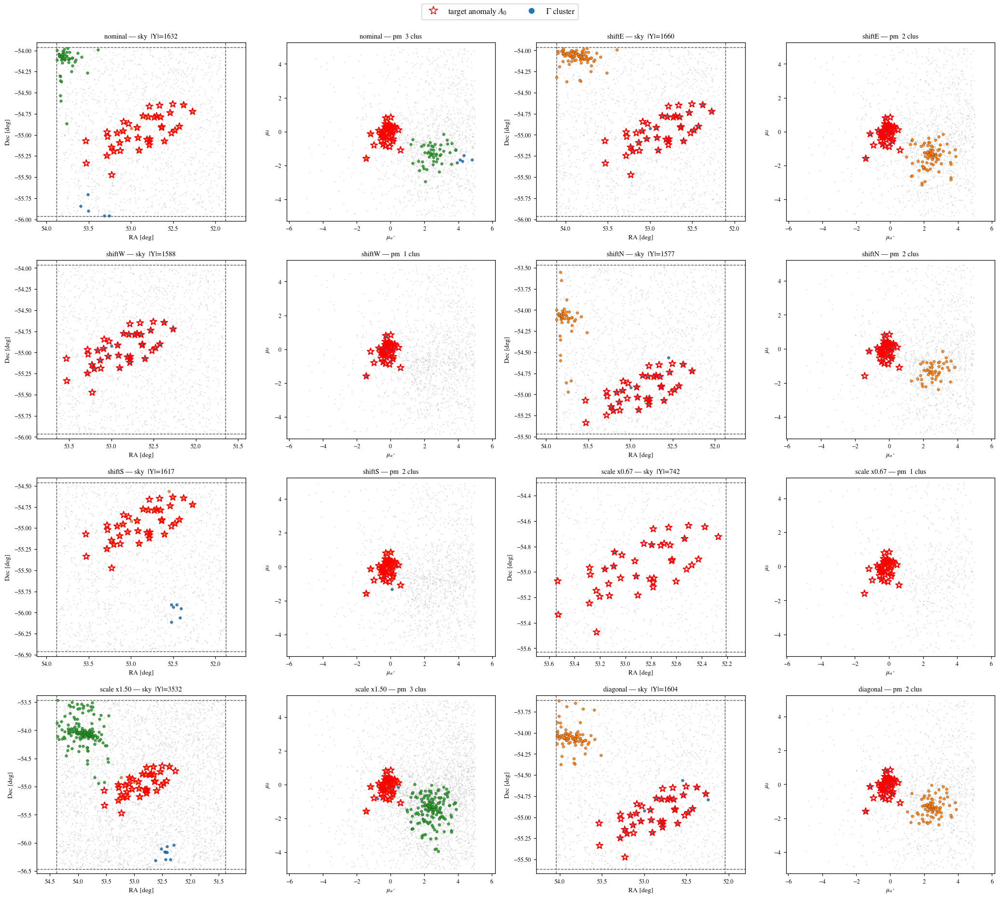

In [35]:
# ---- 4) per-configuration sky + PM (4x4 for 8 configs) -----------------------
rb.plot_scan_panels(SCAN_R, TARGET, scan_runs, SCAN_CFGS_OK)
plt.show()

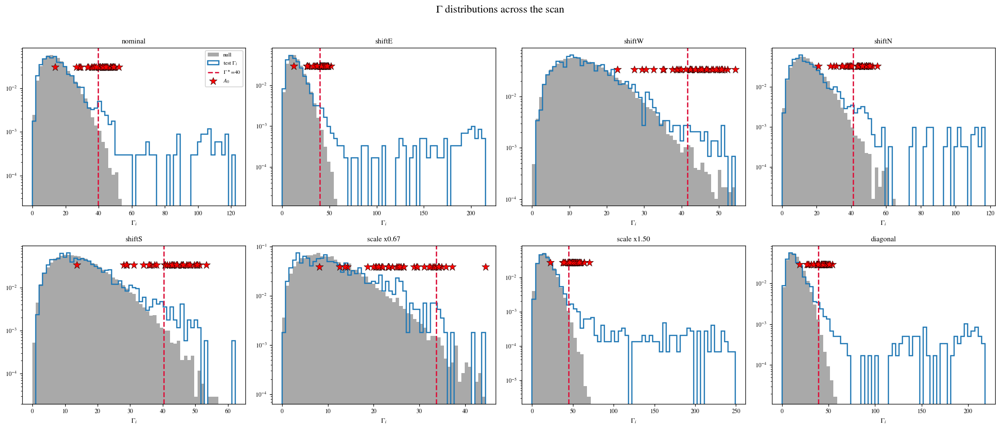

In [36]:
# ---- 5) Gamma distributions across the scan ----------------------------------
rb.plot_scan_gamma(SCAN_R, TARGET, scan_runs, SCAN_CFGS_OK)
plt.show()

Underful Vlist: Vlist<w=10.52 h=12.73 d=0.00 s=0.00>[Hrule, Glue, Hlist<w=10.52 h=12.53 d=0.00 s=0.00>[Hbox, Hlist<w=7.47 h=12.53 d=0.00 s=0.00>[Vlist<w=7.47 h=12.53 d=0.00 s=0.00>[HCentered<w=7.38 h=2.00 d=0.00 s=0.00>[Glue, Hbox, `\circumflexaccent`, Glue], Vbox, Hlist<w=7.47 h=9.00 d=0.00 s=0.00>[`B`, k0.09]]], Hbox]]
Underful Vlist: Vlist<w=10.52 h=12.73 d=0.00 s=0.00>[Hrule, Glue, Hlist<w=10.52 h=12.53 d=0.00 s=0.00>[Hbox, Hlist<w=7.47 h=12.53 d=0.00 s=0.00>[Vlist<w=7.47 h=12.53 d=0.00 s=0.00>[HCentered<w=7.38 h=2.00 d=0.00 s=0.00>[Glue, Hbox, `\circumflexaccent`, Glue], Vbox, Hlist<w=7.47 h=9.00 d=0.00 s=0.00>[`B`, k0.09]]], Hbox]]
Underful Vlist: Vlist<w=10.52 h=12.73 d=0.00 s=0.00>[Hrule, Glue, Hlist<w=10.52 h=12.53 d=0.00 s=0.00>[Hbox, Hlist<w=7.47 h=12.53 d=0.00 s=0.00>[Vlist<w=7.47 h=12.53 d=0.00 s=0.00>[HCentered<w=7.38 h=2.00 d=0.00 s=0.00>[Glue, Hbox, `\circumflexaccent`, Glue], Vbox, Hlist<w=7.47 h=9.00 d=0.00 s=0.00>[`B`, k0.09]]], Hbox]]
Underful Vlist: Vlist<w=10.52 h

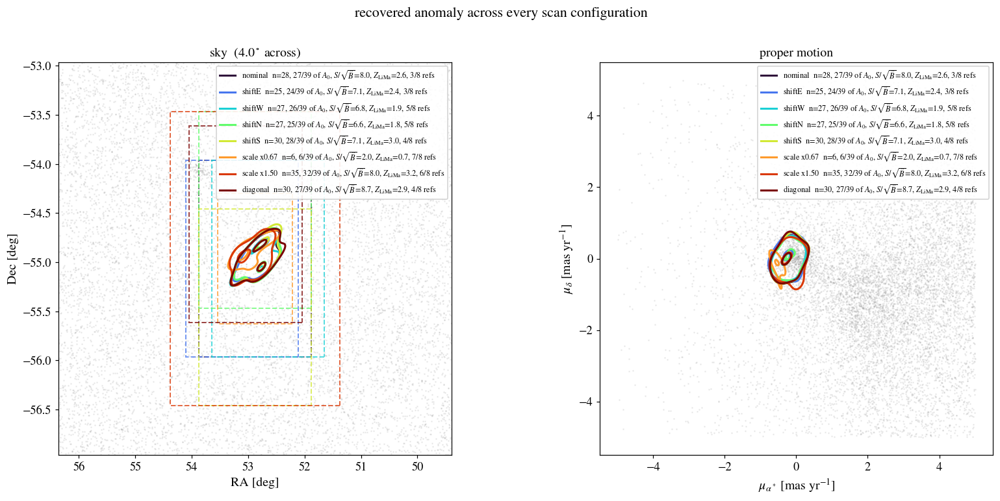

In [37]:
import importlib 
importlib.reload(rb)          # so edits to robustness.py take effect without a restart
# ---- 6) the summary figure: every scan's anomaly, overlaid -------------------
fig = rb.plot_scan_overlay(SCAN_R, TARGET, scan_runs, SCAN_CFGS_OK,
                     sky_half=2.0,   # half-width of the sky panel, degrees ON SKY
                     pm_half=None,   # PM panel half-width; None = full data range
                     n_bg=120000,    # background stars drawn (subsampled above this)
                     show_A0=False,  # the individual target stars, off by default
                     show_roi=True,  # outline each configuration's Y tile in its own contour colour
                     bg_kw=None,levels=(0.63,0.05))     # override the grey scatter styling

fig.savefig(CACHE_DIR / f"{SCAN_PKL.stem}_overlay.png", dpi=150, bbox_inches="tight")
plt.show()

Underful Vlist: Vlist<w=10.52 h=12.73 d=0.00 s=0.00>[Hrule, Glue, Hlist<w=10.52 h=12.53 d=0.00 s=0.00>[Hbox, Hlist<w=7.47 h=12.53 d=0.00 s=0.00>[Vlist<w=7.47 h=12.53 d=0.00 s=0.00>[HCentered<w=7.38 h=2.00 d=0.00 s=0.00>[Glue, Hbox, `\circumflexaccent`, Glue], Vbox, Hlist<w=7.47 h=9.00 d=0.00 s=0.00>[`B`, k0.09]]], Hbox]]
Underful Vlist: Vlist<w=10.52 h=12.73 d=0.00 s=0.00>[Hrule, Glue, Hlist<w=10.52 h=12.53 d=0.00 s=0.00>[Hbox, Hlist<w=7.47 h=12.53 d=0.00 s=0.00>[Vlist<w=7.47 h=12.53 d=0.00 s=0.00>[HCentered<w=7.38 h=2.00 d=0.00 s=0.00>[Glue, Hbox, `\circumflexaccent`, Glue], Vbox, Hlist<w=7.47 h=9.00 d=0.00 s=0.00>[`B`, k0.09]]], Hbox]]
Underful Vlist: Vlist<w=10.52 h=12.73 d=0.00 s=0.00>[Hrule, Glue, Hlist<w=10.52 h=12.53 d=0.00 s=0.00>[Hbox, Hlist<w=7.47 h=12.53 d=0.00 s=0.00>[Vlist<w=7.47 h=12.53 d=0.00 s=0.00>[HCentered<w=7.38 h=2.00 d=0.00 s=0.00>[Glue, Hbox, `\circumflexaccent`, Glue], Vbox, Hlist<w=7.47 h=9.00 d=0.00 s=0.00>[`B`, k0.09]]], Hbox]]


scale x1.50:  h=1.5000  grid=(52.8782, -54.9631)  |Y|=3532  K_M=169  Gamma*=44.5  |A_Gamma|=209  3 cluster(s)
DW20 systems on this grid: Reticulum II (class 4)
  tile cell0 (ref 0): 2.7  <- contributes
  tile cell1 (ref 1): --
  tile cell2 (ref 2): 1.8  <- contributes
  tile cell3 (ref 3): 3.1  <- contributes
  tile cell5 (ref 4): --
  tile cell6 (ref 5): 4.6  <- contributes
  tile cell7 (ref 6): 5.6  <- contributes
  tile cell8 (ref 7): 3.5  <- contributes


Underful Vlist: Vlist<w=10.52 h=12.73 d=0.00 s=0.00>[Hrule, Glue, Hlist<w=10.52 h=12.53 d=0.00 s=0.00>[Hbox, Hlist<w=7.47 h=12.53 d=0.00 s=0.00>[Vlist<w=7.47 h=12.53 d=0.00 s=0.00>[HCentered<w=7.38 h=2.00 d=0.00 s=0.00>[Glue, Hbox, `\circumflexaccent`, Glue], Vbox, Hlist<w=7.47 h=9.00 d=0.00 s=0.00>[`B`, k0.09]]], Hbox]]
Underful Vlist: Vlist<w=10.52 h=12.73 d=0.00 s=0.00>[Hrule, Glue, Hlist<w=10.52 h=12.53 d=0.00 s=0.00>[Hbox, Hlist<w=7.47 h=12.53 d=0.00 s=0.00>[Vlist<w=7.47 h=12.53 d=0.00 s=0.00>[HCentered<w=7.38 h=2.00 d=0.00 s=0.00>[Glue, Hbox, `\circumflexaccent`, Glue], Vbox, Hlist<w=7.47 h=9.00 d=0.00 s=0.00>[`B`, k0.09]]], Hbox]]
Underful Vlist: Vlist<w=10.52 h=12.73 d=0.00 s=0.00>[Hrule, Glue, Hlist<w=10.52 h=12.53 d=0.00 s=0.00>[Hbox, Hlist<w=7.47 h=12.53 d=0.00 s=0.00>[Vlist<w=7.47 h=12.53 d=0.00 s=0.00>[HCentered<w=7.38 h=2.00 d=0.00 s=0.00>[Glue, Hbox, `\circumflexaccent`, Glue], Vbox, Hlist<w=7.47 h=9.00 d=0.00 s=0.00>[`B`, k0.09]]], Hbox]]


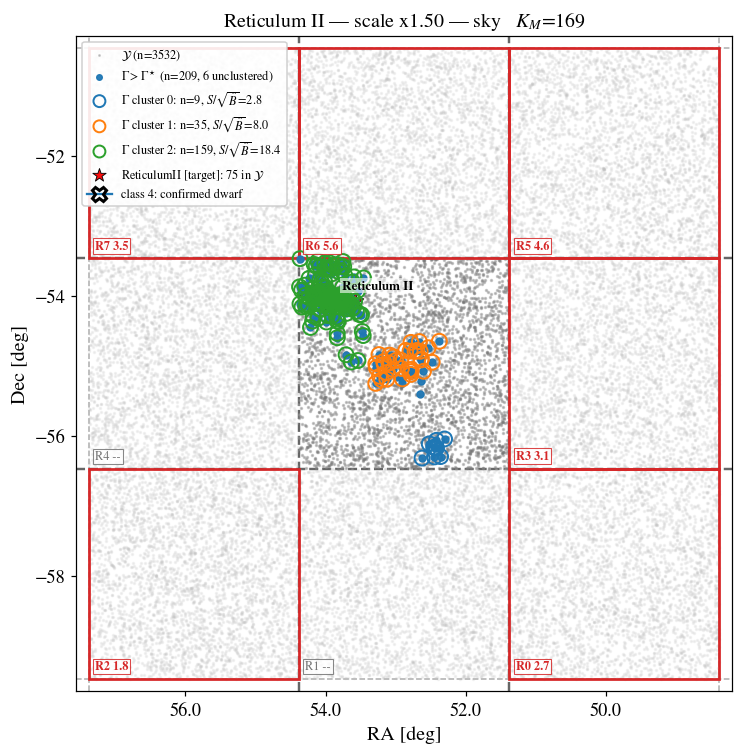

Underful Vlist: Vlist<w=10.52 h=12.73 d=0.00 s=0.00>[Hrule, Glue, Hlist<w=10.52 h=12.53 d=0.00 s=0.00>[Hbox, Hlist<w=7.47 h=12.53 d=0.00 s=0.00>[Vlist<w=7.47 h=12.53 d=0.00 s=0.00>[HCentered<w=7.38 h=2.00 d=0.00 s=0.00>[Glue, Hbox, `\circumflexaccent`, Glue], Vbox, Hlist<w=7.47 h=9.00 d=0.00 s=0.00>[`B`, k0.09]]], Hbox]]
Underful Vlist: Vlist<w=10.52 h=12.73 d=0.00 s=0.00>[Hrule, Glue, Hlist<w=10.52 h=12.53 d=0.00 s=0.00>[Hbox, Hlist<w=7.47 h=12.53 d=0.00 s=0.00>[Vlist<w=7.47 h=12.53 d=0.00 s=0.00>[HCentered<w=7.38 h=2.00 d=0.00 s=0.00>[Glue, Hbox, `\circumflexaccent`, Glue], Vbox, Hlist<w=7.47 h=9.00 d=0.00 s=0.00>[`B`, k0.09]]], Hbox]]
Underful Vlist: Vlist<w=10.52 h=12.73 d=0.00 s=0.00>[Hrule, Glue, Hlist<w=10.52 h=12.53 d=0.00 s=0.00>[Hbox, Hlist<w=7.47 h=12.53 d=0.00 s=0.00>[Vlist<w=7.47 h=12.53 d=0.00 s=0.00>[HCentered<w=7.38 h=2.00 d=0.00 s=0.00>[Glue, Hbox, `\circumflexaccent`, Glue], Vbox, Hlist<w=7.47 h=9.00 d=0.00 s=0.00>[`B`, k0.09]]], Hbox]]
Underful Vlist: Vlist<w=10.52 h

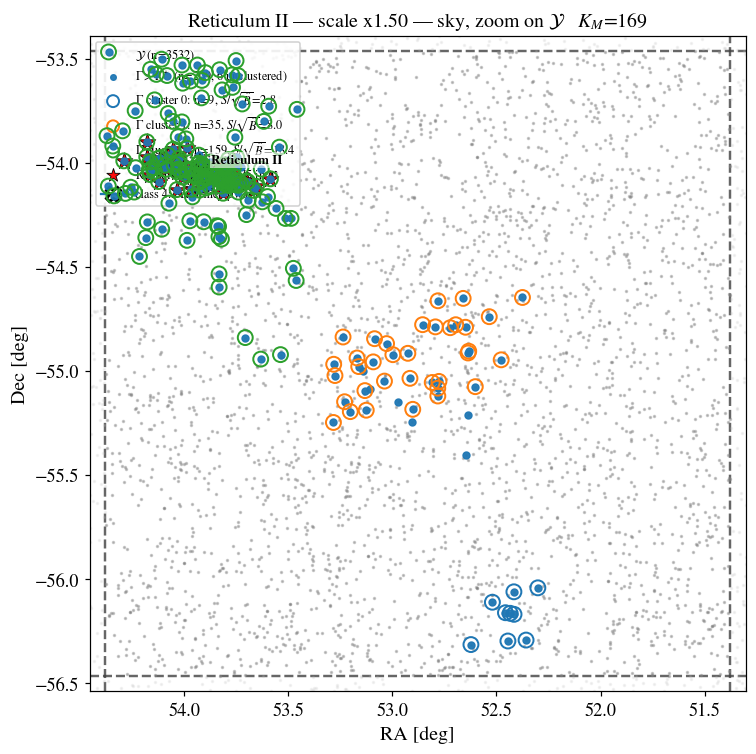

Underful Vlist: Vlist<w=10.52 h=12.73 d=0.00 s=0.00>[Hrule, Glue, Hlist<w=10.52 h=12.53 d=0.00 s=0.00>[Hbox, Hlist<w=7.47 h=12.53 d=0.00 s=0.00>[Vlist<w=7.47 h=12.53 d=0.00 s=0.00>[HCentered<w=7.38 h=2.00 d=0.00 s=0.00>[Glue, Hbox, `\circumflexaccent`, Glue], Vbox, Hlist<w=7.47 h=9.00 d=0.00 s=0.00>[`B`, k0.09]]], Hbox]]
Underful Vlist: Vlist<w=10.52 h=12.73 d=0.00 s=0.00>[Hrule, Glue, Hlist<w=10.52 h=12.53 d=0.00 s=0.00>[Hbox, Hlist<w=7.47 h=12.53 d=0.00 s=0.00>[Vlist<w=7.47 h=12.53 d=0.00 s=0.00>[HCentered<w=7.38 h=2.00 d=0.00 s=0.00>[Glue, Hbox, `\circumflexaccent`, Glue], Vbox, Hlist<w=7.47 h=9.00 d=0.00 s=0.00>[`B`, k0.09]]], Hbox]]
Underful Vlist: Vlist<w=10.52 h=12.73 d=0.00 s=0.00>[Hrule, Glue, Hlist<w=10.52 h=12.53 d=0.00 s=0.00>[Hbox, Hlist<w=7.47 h=12.53 d=0.00 s=0.00>[Vlist<w=7.47 h=12.53 d=0.00 s=0.00>[HCentered<w=7.38 h=2.00 d=0.00 s=0.00>[Glue, Hbox, `\circumflexaccent`, Glue], Vbox, Hlist<w=7.47 h=9.00 d=0.00 s=0.00>[`B`, k0.09]]], Hbox]]
Underful Vlist: Vlist<w=10.52 h

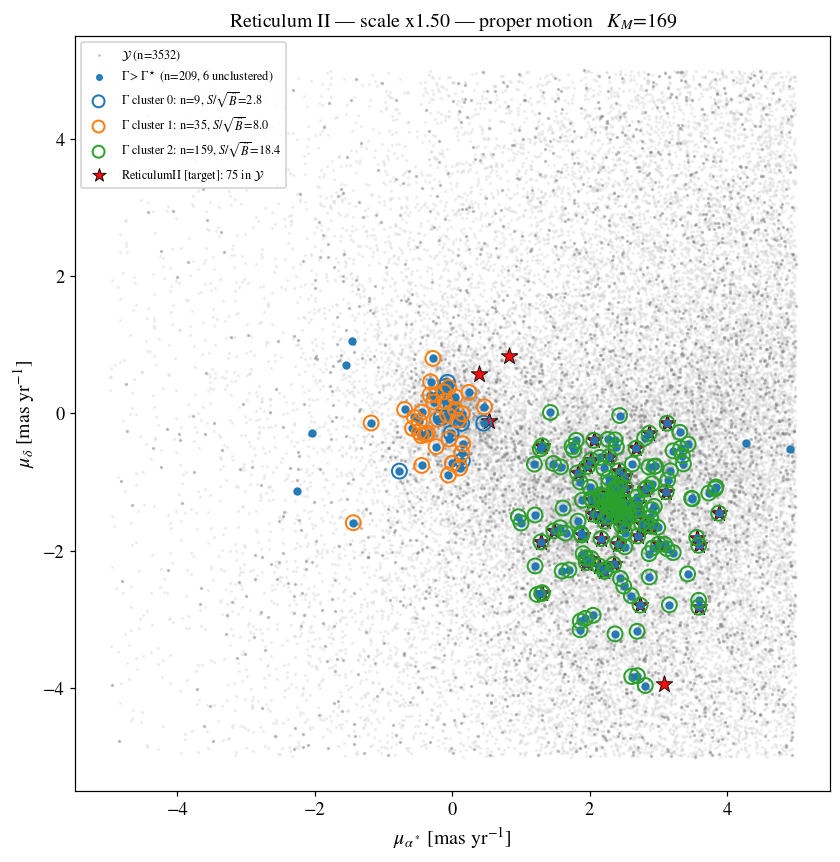

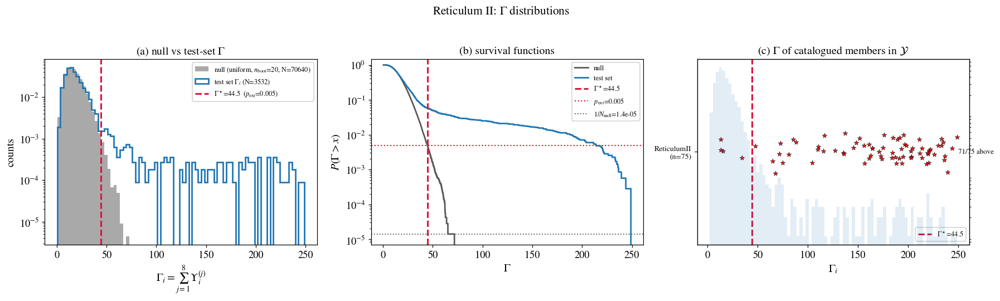

In [50]:
# ---- inspect ONE scan configuration with the Part 3 plots --------------------
# plot_field / plot_gamma_distributions were written against the Part 2/3 run dicts,
# so the two grid-dependent inputs (neigh, field_cat) must be rebuilt for THIS grid:
# the tile assignment and the Y-index space both change with the grid.
SCAN_LABEL = "scale x1.50"          # any key of scan_runs, e.g. "nominal", "shiftW"
import importlib, wake_test as wt
importlib.reload(wt)

run_s = scan_runs[SCAN_LABEL]
g_s   = run_s["grid"]
half_s = 3 * g_s["cell_h"]          # the full 3x3 footprint of this configuration

if "Gamma_null_mat" not in run_s:
    raise KeyError(
        f"{SCAN_LABEL!r} was produced before run_one stored the bootstrap null. "
        "Delete the scan cache and re-run Part 5 to get the Gamma-distribution panel.")

# Battaglia members and DW20 systems over THIS grid, with tiles assigned on it
bat_s = battaglia_systems_in_window(bat, g_s["ra0"], g_s["dec0"], half_s,
                                    NEIGHBOUR_PMEMB_MIN)
neigh_s = attach_members_to_run(bat_s, SCAN_R, run_s["parts"], target_name=TARGET_NAME)
field_cat_s = catalog_systems_in_window(dwarfs, g_s["ra0"], g_s["dec0"], half_s,
                                        g_s["ra0"], g_s["dec0"], g_s["cell_h"],
                                        classes=None)
NSTYLE = neighbour_style(neigh_s)   # plot_field reads this as a global

print(f"{SCAN_LABEL}:  h={g_s['cell_h']:.4f}  grid=({g_s['ra0']:.4f}, {g_s['dec0']:.4f})  "
      f"|Y|={run_s['nY']}  K_M={run_s['cfg']['kM']}  "
      f"Gamma*={run_s['Gamma_star']:.1f}  |A_Gamma|={int(run_s['A_Gamma_mask'].sum())}  "
      f"{len(run_s['gamma_clusters'])} cluster(s)")
print(f"DW20 systems on this grid: "
      + (", ".join(f"{n} (class {c})" for n, c in
                   zip(field_cat_s['Name'], field_cat_s['Class'])) or "none"))


STAT = "z_EE"


# K_M actually used by THIS configuration, for the plot titles. "auto" resolves to
# floor(0.05*min(min_j nX_j, nY)) AFTER equalisation, so it differs per config; and a
# fixed K_M can sit above the locality bound, which is worth seeing on the figure.
_cfg_s  = run_s["cfg"]
_kmb    = _cfg_s.get("km_bound")
_KM_TAG = ("   $K_M$=" + str(_cfg_s["kM"])
           + (" (auto)" if _cfg_s.get("km_mode") == "auto" else "")
           + (f", bound {_kmb}" if _kmb else "")
           + (" — ABOVE BOUND" if (_kmb and _cfg_s["kM"] > _kmb) else ""))

ax = plot_field(run_s, SCAN_R, neigh_s, field_cat_s, space="sky",
                title=f"{DWARF} — {SCAN_LABEL} — sky{_KM_TAG}")
wt.label_reference_tiles(ax, run_s, r=SCAN_R, target=TARGET, stat=STAT, verbose=True)
plt.show()



plot_field(run_s, SCAN_R, neigh_s, field_cat_s, space="sky", zoom_to_Y=True,
           title=f"{DWARF} — {SCAN_LABEL} — sky, zoom on $\\mathcal{{Y}}${_KM_TAG}")
plt.show()

plot_field(run_s, SCAN_R, neigh_s, field_cat_s, space="pm",
           title=f"{DWARF} — {SCAN_LABEL} — proper motion{_KM_TAG}")
plt.show()

plot_gamma_distributions(run_s, neigh_s)
plt.show()

Underful Vlist: Vlist<w=10.52 h=12.73 d=0.00 s=0.00>[Hrule, Glue, Hlist<w=10.52 h=12.53 d=0.00 s=0.00>[Hbox, Hlist<w=7.47 h=12.53 d=0.00 s=0.00>[Vlist<w=7.47 h=12.53 d=0.00 s=0.00>[HCentered<w=7.38 h=2.00 d=0.00 s=0.00>[Glue, Hbox, `\circumflexaccent`, Glue], Vbox, Hlist<w=7.47 h=9.00 d=0.00 s=0.00>[`B`, k0.09]]], Hbox]]
Underful Vlist: Vlist<w=10.52 h=12.73 d=0.00 s=0.00>[Hrule, Glue, Hlist<w=10.52 h=12.53 d=0.00 s=0.00>[Hbox, Hlist<w=7.47 h=12.53 d=0.00 s=0.00>[Vlist<w=7.47 h=12.53 d=0.00 s=0.00>[HCentered<w=7.38 h=2.00 d=0.00 s=0.00>[Glue, Hbox, `\circumflexaccent`, Glue], Vbox, Hlist<w=7.47 h=9.00 d=0.00 s=0.00>[`B`, k0.09]]], Hbox]]
Underful Vlist: Vlist<w=10.52 h=12.73 d=0.00 s=0.00>[Hrule, Glue, Hlist<w=10.52 h=12.53 d=0.00 s=0.00>[Hbox, Hlist<w=7.47 h=12.53 d=0.00 s=0.00>[Vlist<w=7.47 h=12.53 d=0.00 s=0.00>[HCentered<w=7.38 h=2.00 d=0.00 s=0.00>[Glue, Hbox, `\circumflexaccent`, Glue], Vbox, Hlist<w=7.47 h=9.00 d=0.00 s=0.00>[`B`, k0.09]]], Hbox]]


nominal:  h=1.0000  grid=(52.8782, -54.9631)  |Y|=1632  K_M=75  Gamma*=39.6  |A_Gamma|=87  3 cluster(s)
DW20 systems on this grid: Reticulum II (class 4)
  tile cell0 (ref 0): --
  tile cell1 (ref 1): 2.3 / 1.4  <- contributes
  tile cell2 (ref 2): 1.1 / 0.7  <- contributes
  tile cell3 (ref 3): 8.3 / 3.8  <- contributes
  tile cell5 (ref 4): --
  tile cell6 (ref 5): --
  tile cell7 (ref 6): --
  tile cell8 (ref 7): --


Underful Vlist: Vlist<w=10.52 h=12.73 d=0.00 s=0.00>[Hrule, Glue, Hlist<w=10.52 h=12.53 d=0.00 s=0.00>[Hbox, Hlist<w=7.47 h=12.53 d=0.00 s=0.00>[Vlist<w=7.47 h=12.53 d=0.00 s=0.00>[HCentered<w=7.38 h=2.00 d=0.00 s=0.00>[Glue, Hbox, `\circumflexaccent`, Glue], Vbox, Hlist<w=7.47 h=9.00 d=0.00 s=0.00>[`B`, k0.09]]], Hbox]]
Underful Vlist: Vlist<w=10.52 h=12.73 d=0.00 s=0.00>[Hrule, Glue, Hlist<w=10.52 h=12.53 d=0.00 s=0.00>[Hbox, Hlist<w=7.47 h=12.53 d=0.00 s=0.00>[Vlist<w=7.47 h=12.53 d=0.00 s=0.00>[HCentered<w=7.38 h=2.00 d=0.00 s=0.00>[Glue, Hbox, `\circumflexaccent`, Glue], Vbox, Hlist<w=7.47 h=9.00 d=0.00 s=0.00>[`B`, k0.09]]], Hbox]]
Underful Vlist: Vlist<w=10.52 h=12.73 d=0.00 s=0.00>[Hrule, Glue, Hlist<w=10.52 h=12.53 d=0.00 s=0.00>[Hbox, Hlist<w=7.47 h=12.53 d=0.00 s=0.00>[Vlist<w=7.47 h=12.53 d=0.00 s=0.00>[HCentered<w=7.38 h=2.00 d=0.00 s=0.00>[Glue, Hbox, `\circumflexaccent`, Glue], Vbox, Hlist<w=7.47 h=9.00 d=0.00 s=0.00>[`B`, k0.09]]], Hbox]]


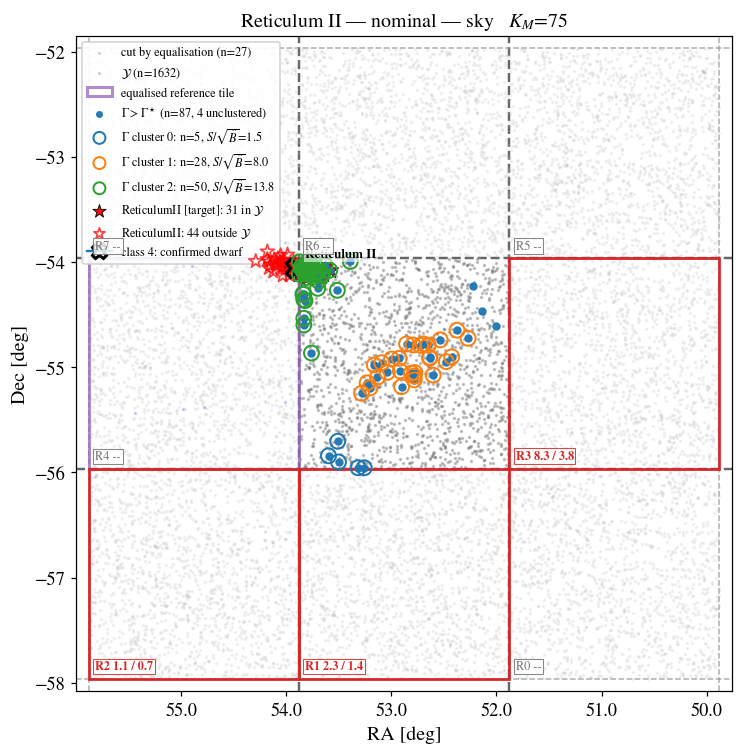

Underful Vlist: Vlist<w=10.52 h=12.73 d=0.00 s=0.00>[Hrule, Glue, Hlist<w=10.52 h=12.53 d=0.00 s=0.00>[Hbox, Hlist<w=7.47 h=12.53 d=0.00 s=0.00>[Vlist<w=7.47 h=12.53 d=0.00 s=0.00>[HCentered<w=7.38 h=2.00 d=0.00 s=0.00>[Glue, Hbox, `\circumflexaccent`, Glue], Vbox, Hlist<w=7.47 h=9.00 d=0.00 s=0.00>[`B`, k0.09]]], Hbox]]
Underful Vlist: Vlist<w=10.52 h=12.73 d=0.00 s=0.00>[Hrule, Glue, Hlist<w=10.52 h=12.53 d=0.00 s=0.00>[Hbox, Hlist<w=7.47 h=12.53 d=0.00 s=0.00>[Vlist<w=7.47 h=12.53 d=0.00 s=0.00>[HCentered<w=7.38 h=2.00 d=0.00 s=0.00>[Glue, Hbox, `\circumflexaccent`, Glue], Vbox, Hlist<w=7.47 h=9.00 d=0.00 s=0.00>[`B`, k0.09]]], Hbox]]
Underful Vlist: Vlist<w=10.52 h=12.73 d=0.00 s=0.00>[Hrule, Glue, Hlist<w=10.52 h=12.53 d=0.00 s=0.00>[Hbox, Hlist<w=7.47 h=12.53 d=0.00 s=0.00>[Vlist<w=7.47 h=12.53 d=0.00 s=0.00>[HCentered<w=7.38 h=2.00 d=0.00 s=0.00>[Glue, Hbox, `\circumflexaccent`, Glue], Vbox, Hlist<w=7.47 h=9.00 d=0.00 s=0.00>[`B`, k0.09]]], Hbox]]
Underful Vlist: Vlist<w=10.52 h

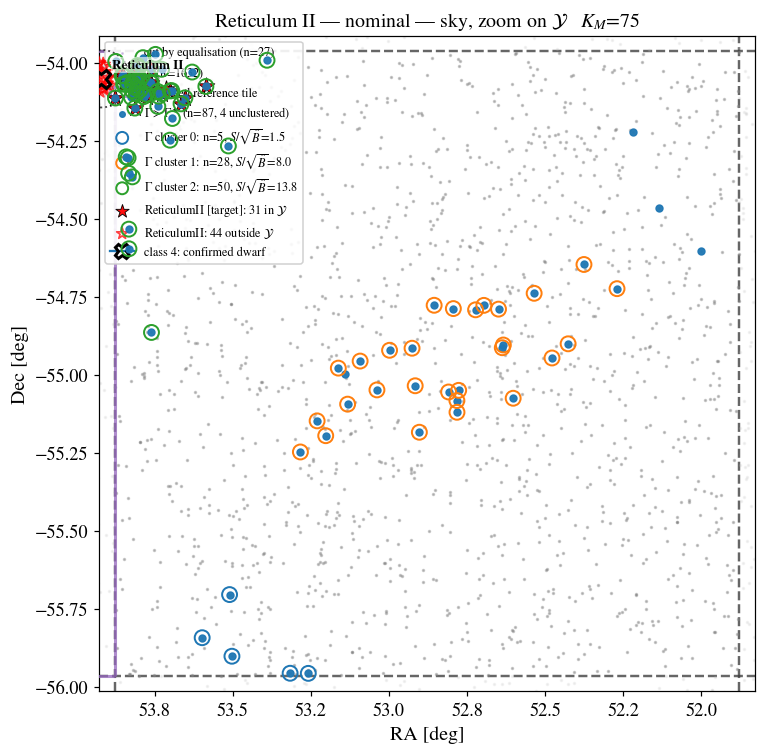

Underful Vlist: Vlist<w=10.52 h=12.73 d=0.00 s=0.00>[Hrule, Glue, Hlist<w=10.52 h=12.53 d=0.00 s=0.00>[Hbox, Hlist<w=7.47 h=12.53 d=0.00 s=0.00>[Vlist<w=7.47 h=12.53 d=0.00 s=0.00>[HCentered<w=7.38 h=2.00 d=0.00 s=0.00>[Glue, Hbox, `\circumflexaccent`, Glue], Vbox, Hlist<w=7.47 h=9.00 d=0.00 s=0.00>[`B`, k0.09]]], Hbox]]
Underful Vlist: Vlist<w=10.52 h=12.73 d=0.00 s=0.00>[Hrule, Glue, Hlist<w=10.52 h=12.53 d=0.00 s=0.00>[Hbox, Hlist<w=7.47 h=12.53 d=0.00 s=0.00>[Vlist<w=7.47 h=12.53 d=0.00 s=0.00>[HCentered<w=7.38 h=2.00 d=0.00 s=0.00>[Glue, Hbox, `\circumflexaccent`, Glue], Vbox, Hlist<w=7.47 h=9.00 d=0.00 s=0.00>[`B`, k0.09]]], Hbox]]
Underful Vlist: Vlist<w=10.52 h=12.73 d=0.00 s=0.00>[Hrule, Glue, Hlist<w=10.52 h=12.53 d=0.00 s=0.00>[Hbox, Hlist<w=7.47 h=12.53 d=0.00 s=0.00>[Vlist<w=7.47 h=12.53 d=0.00 s=0.00>[HCentered<w=7.38 h=2.00 d=0.00 s=0.00>[Glue, Hbox, `\circumflexaccent`, Glue], Vbox, Hlist<w=7.47 h=9.00 d=0.00 s=0.00>[`B`, k0.09]]], Hbox]]
Underful Vlist: Vlist<w=10.52 h

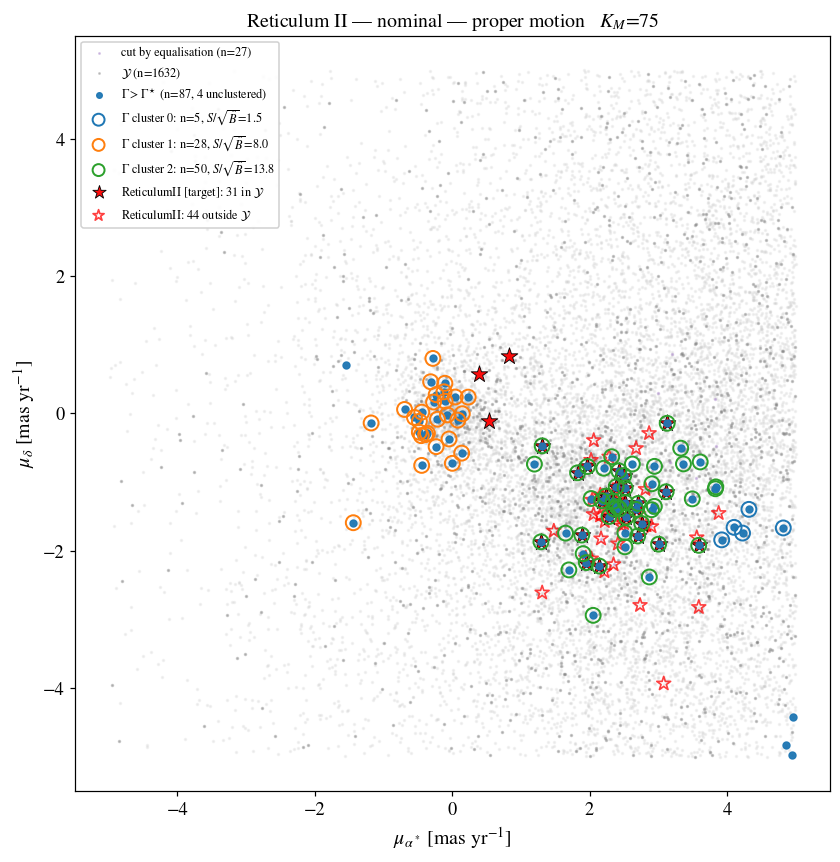

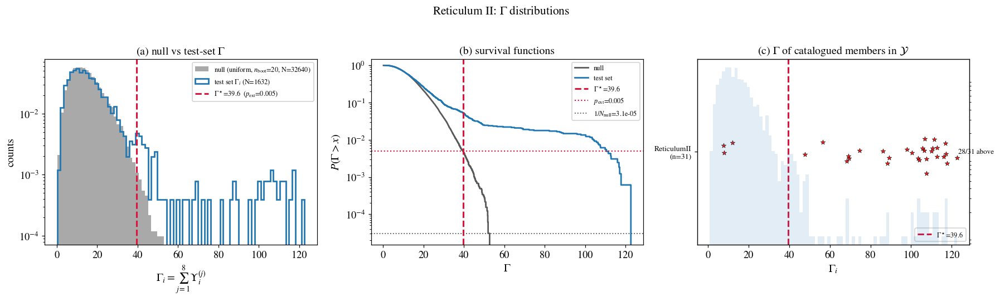

In [51]:
# ---- inspect ONE scan configuration with the Part 3 plots --------------------
# plot_field / plot_gamma_distributions were written against the Part 2/3 run dicts,
# so the two grid-dependent inputs (neigh, field_cat) must be rebuilt for THIS grid:
# the tile assignment and the Y-index space both change with the grid.
SCAN_LABEL = "nominal"          # any key of scan_runs, e.g. "nominal", "shiftW"

run_s = scan_runs[SCAN_LABEL]
g_s   = run_s["grid"]
half_s = 3 * g_s["cell_h"]          # the full 3x3 footprint of this configuration

if "Gamma_null_mat" not in run_s:
    raise KeyError(
        f"{SCAN_LABEL!r} was produced before run_one stored the bootstrap null. "
        "Delete the scan cache and re-run Part 5 to get the Gamma-distribution panel.")

# Battaglia members and DW20 systems over THIS grid, with tiles assigned on it
bat_s = battaglia_systems_in_window(bat, g_s["ra0"], g_s["dec0"], half_s,
                                    NEIGHBOUR_PMEMB_MIN)
neigh_s = attach_members_to_run(bat_s, SCAN_R, run_s["parts"], target_name=TARGET_NAME)
field_cat_s = catalog_systems_in_window(dwarfs, g_s["ra0"], g_s["dec0"], half_s,
                                        g_s["ra0"], g_s["dec0"], g_s["cell_h"],
                                        classes=None)
NSTYLE = neighbour_style(neigh_s)   # plot_field reads this as a global

print(f"{SCAN_LABEL}:  h={g_s['cell_h']:.4f}  grid=({g_s['ra0']:.4f}, {g_s['dec0']:.4f})  "
      f"|Y|={run_s['nY']}  K_M={run_s['cfg']['kM']}  "
      f"Gamma*={run_s['Gamma_star']:.1f}  |A_Gamma|={int(run_s['A_Gamma_mask'].sum())}  "
      f"{len(run_s['gamma_clusters'])} cluster(s)")
print(f"DW20 systems on this grid: "
      + (", ".join(f"{n} (class {c})" for n, c in
                   zip(field_cat_s['Name'], field_cat_s['Class'])) or "none"))


STAT = "`z_EE`"


# K_M actually used by THIS configuration, for the plot titles. "auto" resolves to
# floor(0.05*min(min_j nX_j, nY)) AFTER equalisation, so it differs per config; and a
# fixed K_M can sit above the locality bound, which is worth seeing on the figure.
_cfg_s  = run_s["cfg"]
_kmb    = _cfg_s.get("km_bound")
_KM_TAG = ("   $K_M$=" + str(_cfg_s["kM"])
           + (" (auto)" if _cfg_s.get("km_mode") == "auto" else "")
           + (f", bound {_kmb}" if _kmb else "")
           + (" — ABOVE BOUND" if (_kmb and _cfg_s["kM"] > _kmb) else ""))

ax = plot_field(run_s, SCAN_R, neigh_s, field_cat_s, space="sky",
                title=f"{DWARF} — {SCAN_LABEL} — sky{_KM_TAG}")
wt.label_reference_tiles(ax, run_s, r=SCAN_R, target=TARGET, stat=STAT, verbose=True)
plt.show()



plot_field(run_s, SCAN_R, neigh_s, field_cat_s, space="sky", zoom_to_Y=True,
           title=f"{DWARF} — {SCAN_LABEL} — sky, zoom on $\\mathcal{{Y}}${_KM_TAG}")
plt.show()

plot_field(run_s, SCAN_R, neigh_s, field_cat_s, space="pm",
           title=f"{DWARF} — {SCAN_LABEL} — proper motion{_KM_TAG}")
plt.show()

plot_gamma_distributions(run_s, neigh_s)
plt.show()

Underful Vlist: Vlist<w=10.52 h=12.73 d=0.00 s=0.00>[Hrule, Glue, Hlist<w=10.52 h=12.53 d=0.00 s=0.00>[Hbox, Hlist<w=7.47 h=12.53 d=0.00 s=0.00>[Vlist<w=7.47 h=12.53 d=0.00 s=0.00>[HCentered<w=7.38 h=2.00 d=0.00 s=0.00>[Glue, Hbox, `\circumflexaccent`, Glue], Vbox, Hlist<w=7.47 h=9.00 d=0.00 s=0.00>[`B`, k0.09]]], Hbox]]
Underful Vlist: Vlist<w=10.52 h=12.73 d=0.00 s=0.00>[Hrule, Glue, Hlist<w=10.52 h=12.53 d=0.00 s=0.00>[Hbox, Hlist<w=7.47 h=12.53 d=0.00 s=0.00>[Vlist<w=7.47 h=12.53 d=0.00 s=0.00>[HCentered<w=7.38 h=2.00 d=0.00 s=0.00>[Glue, Hbox, `\circumflexaccent`, Glue], Vbox, Hlist<w=7.47 h=9.00 d=0.00 s=0.00>[`B`, k0.09]]], Hbox]]


diagonal:  h=1.0000  grid=(53.0414, -54.6119)  |Y|=1604  K_M=73  Gamma*=38.9  |A_Gamma|=118  2 cluster(s)
DW20 systems on this grid: Reticulum II (class 4)
  tile cell0 (ref 0): 1.0  <- contributes
  tile cell1 (ref 1): 4.4  <- contributes
  tile cell2 (ref 2): 2.9  <- contributes
  tile cell3 (ref 3): 7.3  <- contributes
  tile cell5 (ref 4): --
  tile cell6 (ref 5): --
  tile cell7 (ref 6): --
  tile cell8 (ref 7): --


Underful Vlist: Vlist<w=10.52 h=12.73 d=0.00 s=0.00>[Hrule, Glue, Hlist<w=10.52 h=12.53 d=0.00 s=0.00>[Hbox, Hlist<w=7.47 h=12.53 d=0.00 s=0.00>[Vlist<w=7.47 h=12.53 d=0.00 s=0.00>[HCentered<w=7.38 h=2.00 d=0.00 s=0.00>[Glue, Hbox, `\circumflexaccent`, Glue], Vbox, Hlist<w=7.47 h=9.00 d=0.00 s=0.00>[`B`, k0.09]]], Hbox]]
Underful Vlist: Vlist<w=10.52 h=12.73 d=0.00 s=0.00>[Hrule, Glue, Hlist<w=10.52 h=12.53 d=0.00 s=0.00>[Hbox, Hlist<w=7.47 h=12.53 d=0.00 s=0.00>[Vlist<w=7.47 h=12.53 d=0.00 s=0.00>[HCentered<w=7.38 h=2.00 d=0.00 s=0.00>[Glue, Hbox, `\circumflexaccent`, Glue], Vbox, Hlist<w=7.47 h=9.00 d=0.00 s=0.00>[`B`, k0.09]]], Hbox]]


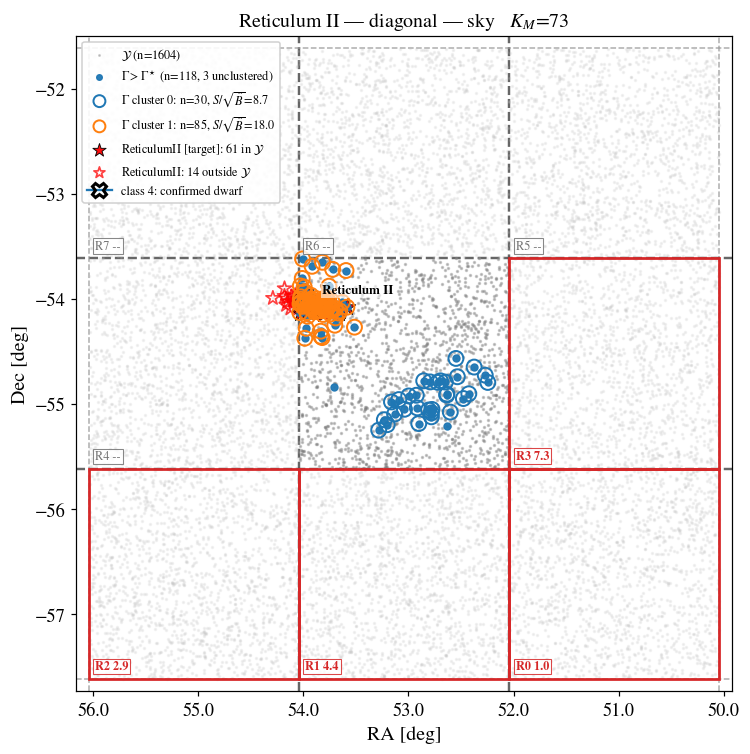

Underful Vlist: Vlist<w=10.52 h=12.73 d=0.00 s=0.00>[Hrule, Glue, Hlist<w=10.52 h=12.53 d=0.00 s=0.00>[Hbox, Hlist<w=7.47 h=12.53 d=0.00 s=0.00>[Vlist<w=7.47 h=12.53 d=0.00 s=0.00>[HCentered<w=7.38 h=2.00 d=0.00 s=0.00>[Glue, Hbox, `\circumflexaccent`, Glue], Vbox, Hlist<w=7.47 h=9.00 d=0.00 s=0.00>[`B`, k0.09]]], Hbox]]
Underful Vlist: Vlist<w=10.52 h=12.73 d=0.00 s=0.00>[Hrule, Glue, Hlist<w=10.52 h=12.53 d=0.00 s=0.00>[Hbox, Hlist<w=7.47 h=12.53 d=0.00 s=0.00>[Vlist<w=7.47 h=12.53 d=0.00 s=0.00>[HCentered<w=7.38 h=2.00 d=0.00 s=0.00>[Glue, Hbox, `\circumflexaccent`, Glue], Vbox, Hlist<w=7.47 h=9.00 d=0.00 s=0.00>[`B`, k0.09]]], Hbox]]
Underful Vlist: Vlist<w=10.52 h=12.73 d=0.00 s=0.00>[Hrule, Glue, Hlist<w=10.52 h=12.53 d=0.00 s=0.00>[Hbox, Hlist<w=7.47 h=12.53 d=0.00 s=0.00>[Vlist<w=7.47 h=12.53 d=0.00 s=0.00>[HCentered<w=7.38 h=2.00 d=0.00 s=0.00>[Glue, Hbox, `\circumflexaccent`, Glue], Vbox, Hlist<w=7.47 h=9.00 d=0.00 s=0.00>[`B`, k0.09]]], Hbox]]
Underful Vlist: Vlist<w=10.52 h

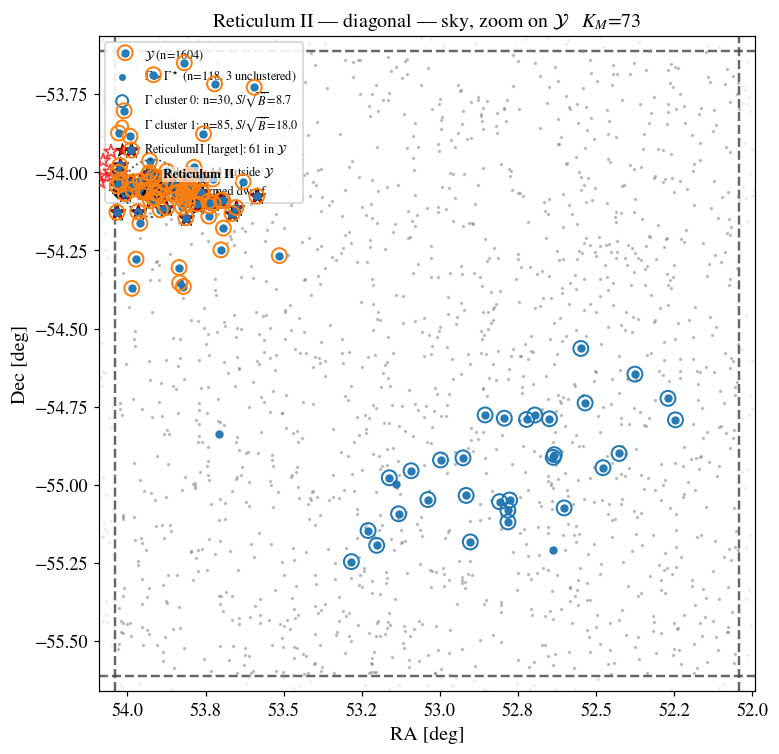

Underful Vlist: Vlist<w=10.52 h=12.73 d=0.00 s=0.00>[Hrule, Glue, Hlist<w=10.52 h=12.53 d=0.00 s=0.00>[Hbox, Hlist<w=7.47 h=12.53 d=0.00 s=0.00>[Vlist<w=7.47 h=12.53 d=0.00 s=0.00>[HCentered<w=7.38 h=2.00 d=0.00 s=0.00>[Glue, Hbox, `\circumflexaccent`, Glue], Vbox, Hlist<w=7.47 h=9.00 d=0.00 s=0.00>[`B`, k0.09]]], Hbox]]
Underful Vlist: Vlist<w=10.52 h=12.73 d=0.00 s=0.00>[Hrule, Glue, Hlist<w=10.52 h=12.53 d=0.00 s=0.00>[Hbox, Hlist<w=7.47 h=12.53 d=0.00 s=0.00>[Vlist<w=7.47 h=12.53 d=0.00 s=0.00>[HCentered<w=7.38 h=2.00 d=0.00 s=0.00>[Glue, Hbox, `\circumflexaccent`, Glue], Vbox, Hlist<w=7.47 h=9.00 d=0.00 s=0.00>[`B`, k0.09]]], Hbox]]
Underful Vlist: Vlist<w=10.52 h=12.73 d=0.00 s=0.00>[Hrule, Glue, Hlist<w=10.52 h=12.53 d=0.00 s=0.00>[Hbox, Hlist<w=7.47 h=12.53 d=0.00 s=0.00>[Vlist<w=7.47 h=12.53 d=0.00 s=0.00>[HCentered<w=7.38 h=2.00 d=0.00 s=0.00>[Glue, Hbox, `\circumflexaccent`, Glue], Vbox, Hlist<w=7.47 h=9.00 d=0.00 s=0.00>[`B`, k0.09]]], Hbox]]
Underful Vlist: Vlist<w=10.52 h

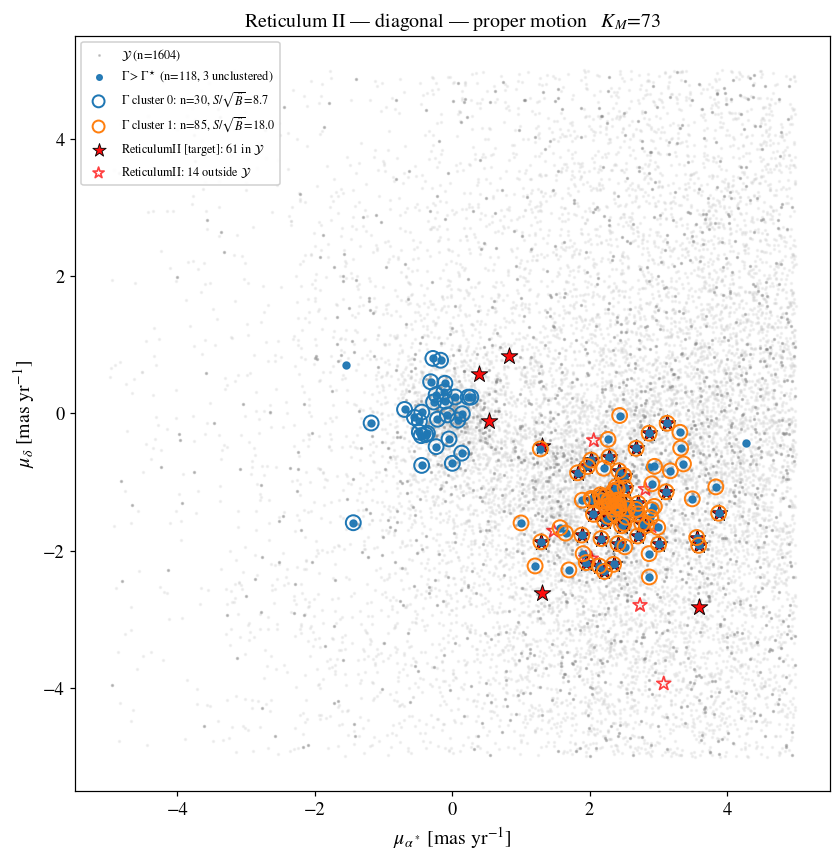

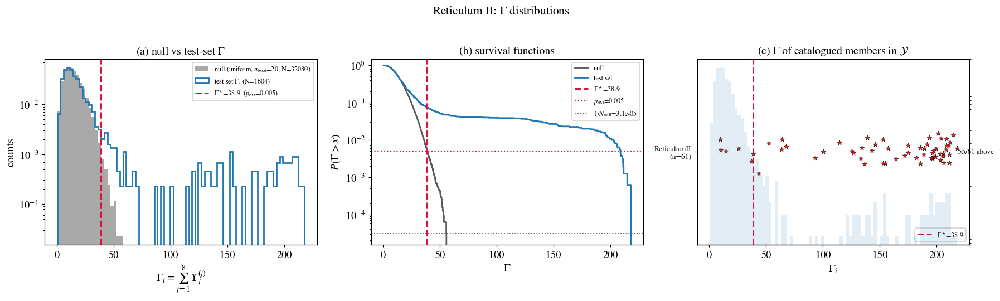

In [52]:
# ---- inspect ONE scan configuration with the Part 3 plots --------------------
# plot_field / plot_gamma_distributions were written against the Part 2/3 run dicts,
# so the two grid-dependent inputs (neigh, field_cat) must be rebuilt for THIS grid:
# the tile assignment and the Y-index space both change with the grid.
SCAN_LABEL = "diagonal"          # any key of scan_runs, e.g. "nominal", "shiftW"

run_s = scan_runs[SCAN_LABEL]
g_s   = run_s["grid"]
half_s = 3 * g_s["cell_h"]          # the full 3x3 footprint of this configuration

if "Gamma_null_mat" not in run_s:
    raise KeyError(
        f"{SCAN_LABEL!r} was produced before run_one stored the bootstrap null. "
        "Delete the scan cache and re-run Part 5 to get the Gamma-distribution panel.")

# Battaglia members and DW20 systems over THIS grid, with tiles assigned on it
bat_s = battaglia_systems_in_window(bat, g_s["ra0"], g_s["dec0"], half_s,
                                    NEIGHBOUR_PMEMB_MIN)
neigh_s = attach_members_to_run(bat_s, SCAN_R, run_s["parts"], target_name=TARGET_NAME)
field_cat_s = catalog_systems_in_window(dwarfs, g_s["ra0"], g_s["dec0"], half_s,
                                        g_s["ra0"], g_s["dec0"], g_s["cell_h"],
                                        classes=None)
NSTYLE = neighbour_style(neigh_s)   # plot_field reads this as a global

print(f"{SCAN_LABEL}:  h={g_s['cell_h']:.4f}  grid=({g_s['ra0']:.4f}, {g_s['dec0']:.4f})  "
      f"|Y|={run_s['nY']}  K_M={run_s['cfg']['kM']}  "
      f"Gamma*={run_s['Gamma_star']:.1f}  |A_Gamma|={int(run_s['A_Gamma_mask'].sum())}  "
      f"{len(run_s['gamma_clusters'])} cluster(s)")
print(f"DW20 systems on this grid: "
      + (", ".join(f"{n} (class {c})" for n, c in
                   zip(field_cat_s['Name'], field_cat_s['Class'])) or "none"))


STAT = "z_EE"


# K_M actually used by THIS configuration, for the plot titles. "auto" resolves to
# floor(0.05*min(min_j nX_j, nY)) AFTER equalisation, so it differs per config; and a
# fixed K_M can sit above the locality bound, which is worth seeing on the figure.
_cfg_s  = run_s["cfg"]
_kmb    = _cfg_s.get("km_bound")
_KM_TAG = ("   $K_M$=" + str(_cfg_s["kM"])
           + (" (auto)" if _cfg_s.get("km_mode") == "auto" else "")
           + (f", bound {_kmb}" if _kmb else "")
           + (" — ABOVE BOUND" if (_kmb and _cfg_s["kM"] > _kmb) else ""))

ax = plot_field(run_s, SCAN_R, neigh_s, field_cat_s, space="sky",
                title=f"{DWARF} — {SCAN_LABEL} — sky{_KM_TAG}")
wt.label_reference_tiles(ax, run_s, r=SCAN_R, target=TARGET, stat=STAT, verbose=True)
plt.show()



plot_field(run_s, SCAN_R, neigh_s, field_cat_s, space="sky", zoom_to_Y=True,
           title=f"{DWARF} — {SCAN_LABEL} — sky, zoom on $\\mathcal{{Y}}${_KM_TAG}")
plt.show()

plot_field(run_s, SCAN_R, neigh_s, field_cat_s, space="pm",
           title=f"{DWARF} — {SCAN_LABEL} — proper motion{_KM_TAG}")
plt.show()

plot_gamma_distributions(run_s, neigh_s)
plt.show()

Underful Vlist: Vlist<w=10.52 h=12.73 d=0.00 s=0.00>[Hrule, Glue, Hlist<w=10.52 h=12.53 d=0.00 s=0.00>[Hbox, Hlist<w=7.47 h=12.53 d=0.00 s=0.00>[Vlist<w=7.47 h=12.53 d=0.00 s=0.00>[HCentered<w=7.38 h=2.00 d=0.00 s=0.00>[Glue, Hbox, `\circumflexaccent`, Glue], Vbox, Hlist<w=7.47 h=9.00 d=0.00 s=0.00>[`B`, k0.09]]], Hbox]]


shiftW:  h=1.0000  grid=(52.6475, -54.9631)  |Y|=1588  K_M=73  Gamma*=41.6  |A_Gamma|=30  1 cluster(s)
DW20 systems on this grid: Reticulum II (class 4)
  tile cell0 (ref 0): 0.3  <- contributes
  tile cell1 (ref 1): 3.6  <- contributes
  tile cell2 (ref 2): 1.1  <- contributes
  tile cell3 (ref 3): 6.0  <- contributes
  tile cell5 (ref 4): --
  tile cell6 (ref 5): --
  tile cell7 (ref 6): --
  tile cell8 (ref 7): 0.7  <- contributes


Underful Vlist: Vlist<w=10.52 h=12.73 d=0.00 s=0.00>[Hrule, Glue, Hlist<w=10.52 h=12.53 d=0.00 s=0.00>[Hbox, Hlist<w=7.47 h=12.53 d=0.00 s=0.00>[Vlist<w=7.47 h=12.53 d=0.00 s=0.00>[HCentered<w=7.38 h=2.00 d=0.00 s=0.00>[Glue, Hbox, `\circumflexaccent`, Glue], Vbox, Hlist<w=7.47 h=9.00 d=0.00 s=0.00>[`B`, k0.09]]], Hbox]]


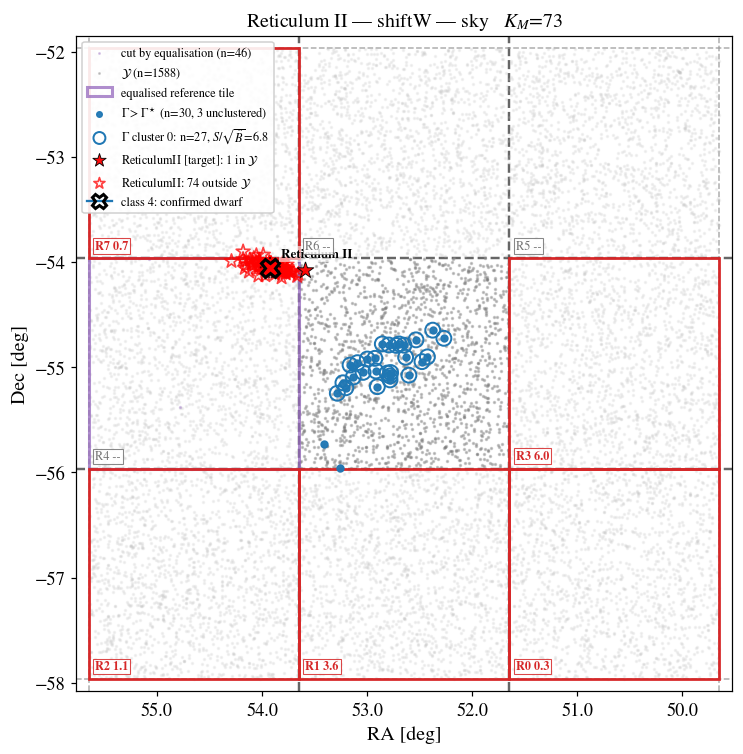

Underful Vlist: Vlist<w=10.52 h=12.73 d=0.00 s=0.00>[Hrule, Glue, Hlist<w=10.52 h=12.53 d=0.00 s=0.00>[Hbox, Hlist<w=7.47 h=12.53 d=0.00 s=0.00>[Vlist<w=7.47 h=12.53 d=0.00 s=0.00>[HCentered<w=7.38 h=2.00 d=0.00 s=0.00>[Glue, Hbox, `\circumflexaccent`, Glue], Vbox, Hlist<w=7.47 h=9.00 d=0.00 s=0.00>[`B`, k0.09]]], Hbox]]
Underful Vlist: Vlist<w=10.52 h=12.73 d=0.00 s=0.00>[Hrule, Glue, Hlist<w=10.52 h=12.53 d=0.00 s=0.00>[Hbox, Hlist<w=7.47 h=12.53 d=0.00 s=0.00>[Vlist<w=7.47 h=12.53 d=0.00 s=0.00>[HCentered<w=7.38 h=2.00 d=0.00 s=0.00>[Glue, Hbox, `\circumflexaccent`, Glue], Vbox, Hlist<w=7.47 h=9.00 d=0.00 s=0.00>[`B`, k0.09]]], Hbox]]


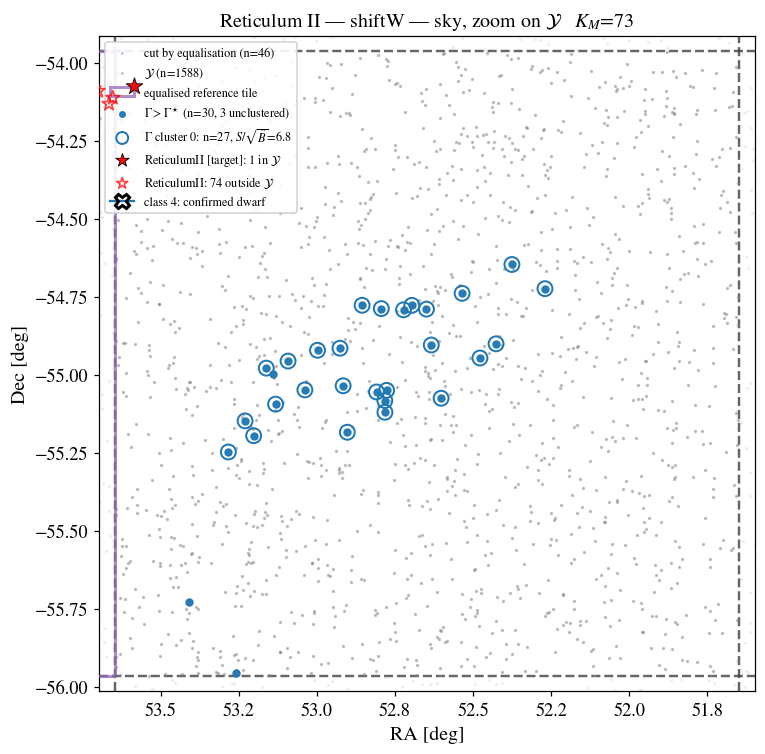

Underful Vlist: Vlist<w=10.52 h=12.73 d=0.00 s=0.00>[Hrule, Glue, Hlist<w=10.52 h=12.53 d=0.00 s=0.00>[Hbox, Hlist<w=7.47 h=12.53 d=0.00 s=0.00>[Vlist<w=7.47 h=12.53 d=0.00 s=0.00>[HCentered<w=7.38 h=2.00 d=0.00 s=0.00>[Glue, Hbox, `\circumflexaccent`, Glue], Vbox, Hlist<w=7.47 h=9.00 d=0.00 s=0.00>[`B`, k0.09]]], Hbox]]
Underful Vlist: Vlist<w=10.52 h=12.73 d=0.00 s=0.00>[Hrule, Glue, Hlist<w=10.52 h=12.53 d=0.00 s=0.00>[Hbox, Hlist<w=7.47 h=12.53 d=0.00 s=0.00>[Vlist<w=7.47 h=12.53 d=0.00 s=0.00>[HCentered<w=7.38 h=2.00 d=0.00 s=0.00>[Glue, Hbox, `\circumflexaccent`, Glue], Vbox, Hlist<w=7.47 h=9.00 d=0.00 s=0.00>[`B`, k0.09]]], Hbox]]


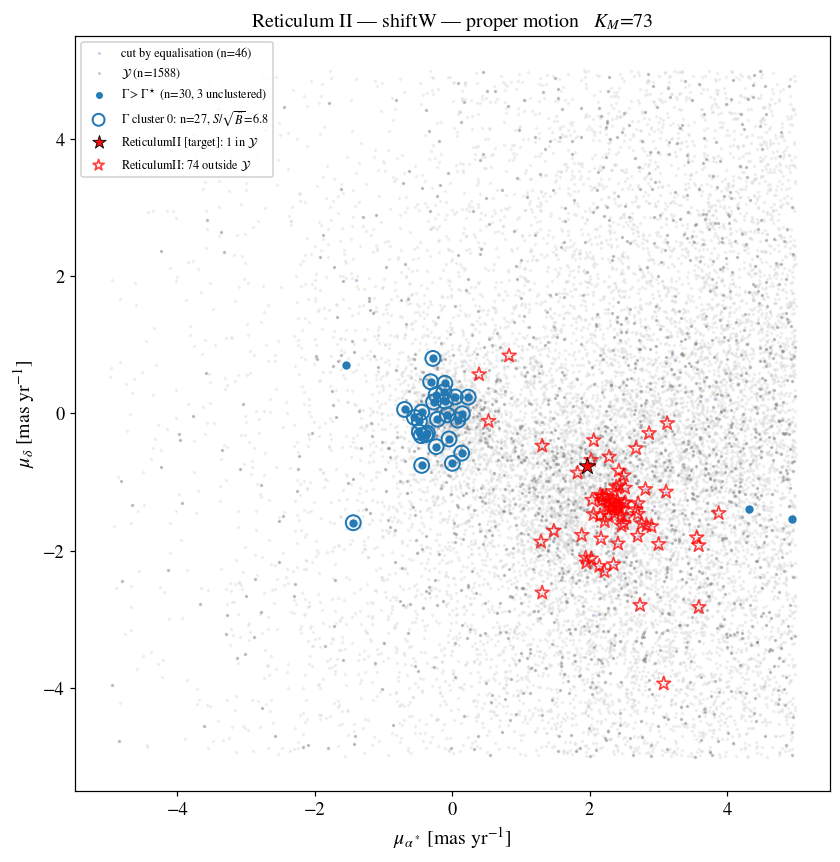

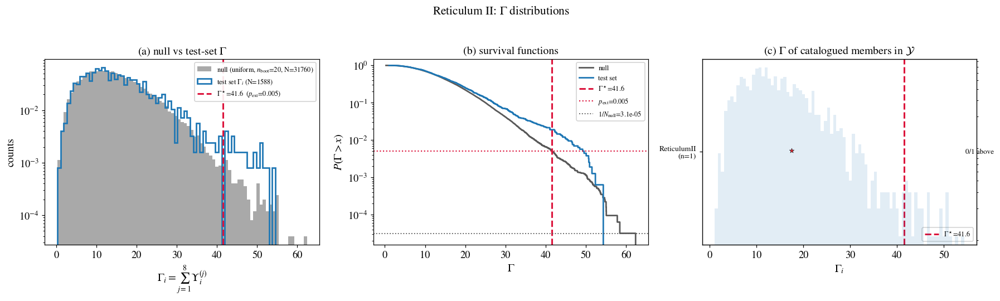

In [53]:
# ---- inspect ONE scan configuration with the Part 3 plots --------------------
# plot_field / plot_gamma_distributions were written against the Part 2/3 run dicts,
# so the two grid-dependent inputs (neigh, field_cat) must be rebuilt for THIS grid:
# the tile assignment and the Y-index space both change with the grid.
SCAN_LABEL = "shiftW"          # any key of scan_runs, e.g. "nominal", "shiftW"

run_s = scan_runs[SCAN_LABEL]
g_s   = run_s["grid"]
half_s = 3 * g_s["cell_h"]          # the full 3x3 footprint of this configuration

if "Gamma_null_mat" not in run_s:
    raise KeyError(
        f"{SCAN_LABEL!r} was produced before run_one stored the bootstrap null. "
        "Delete the scan cache and re-run Part 5 to get the Gamma-distribution panel.")

# Battaglia members and DW20 systems over THIS grid, with tiles assigned on it
bat_s = battaglia_systems_in_window(bat, g_s["ra0"], g_s["dec0"], half_s,
                                    NEIGHBOUR_PMEMB_MIN)
neigh_s = attach_members_to_run(bat_s, SCAN_R, run_s["parts"], target_name=TARGET_NAME)
field_cat_s = catalog_systems_in_window(dwarfs, g_s["ra0"], g_s["dec0"], half_s,
                                        g_s["ra0"], g_s["dec0"], g_s["cell_h"],
                                        classes=None)
NSTYLE = neighbour_style(neigh_s)   # plot_field reads this as a global

print(f"{SCAN_LABEL}:  h={g_s['cell_h']:.4f}  grid=({g_s['ra0']:.4f}, {g_s['dec0']:.4f})  "
      f"|Y|={run_s['nY']}  K_M={run_s['cfg']['kM']}  "
      f"Gamma*={run_s['Gamma_star']:.1f}  |A_Gamma|={int(run_s['A_Gamma_mask'].sum())}  "
      f"{len(run_s['gamma_clusters'])} cluster(s)")
print(f"DW20 systems on this grid: "
      + (", ".join(f"{n} (class {c})" for n, c in
                   zip(field_cat_s['Name'], field_cat_s['Class'])) or "none"))


STAT = "z_EE"


# K_M actually used by THIS configuration, for the plot titles. "auto" resolves to
# floor(0.05*min(min_j nX_j, nY)) AFTER equalisation, so it differs per config; and a
# fixed K_M can sit above the locality bound, which is worth seeing on the figure.
_cfg_s  = run_s["cfg"]
_kmb    = _cfg_s.get("km_bound")
_KM_TAG = ("   $K_M$=" + str(_cfg_s["kM"])
           + (" (auto)" if _cfg_s.get("km_mode") == "auto" else "")
           + (f", bound {_kmb}" if _kmb else "")
           + (" — ABOVE BOUND" if (_kmb and _cfg_s["kM"] > _kmb) else ""))

ax = plot_field(run_s, SCAN_R, neigh_s, field_cat_s, space="sky",
                title=f"{DWARF} — {SCAN_LABEL} — sky{_KM_TAG}")
wt.label_reference_tiles(ax, run_s, r=SCAN_R, target=TARGET, stat=STAT, verbose=True)
plt.show()



plot_field(run_s, SCAN_R, neigh_s, field_cat_s, space="sky", zoom_to_Y=True,
           title=f"{DWARF} — {SCAN_LABEL} — sky, zoom on $\\mathcal{{Y}}${_KM_TAG}")
plt.show()

plot_field(run_s, SCAN_R, neigh_s, field_cat_s, space="pm",
           title=f"{DWARF} — {SCAN_LABEL} — proper motion{_KM_TAG}")
plt.show()

plot_gamma_distributions(run_s, neigh_s)
plt.show()

Underful Vlist: Vlist<w=10.52 h=12.73 d=0.00 s=0.00>[Hrule, Glue, Hlist<w=10.52 h=12.53 d=0.00 s=0.00>[Hbox, Hlist<w=7.47 h=12.53 d=0.00 s=0.00>[Vlist<w=7.47 h=12.53 d=0.00 s=0.00>[HCentered<w=7.38 h=2.00 d=0.00 s=0.00>[Glue, Hbox, `\circumflexaccent`, Glue], Vbox, Hlist<w=7.47 h=9.00 d=0.00 s=0.00>[`B`, k0.09]]], Hbox]]


scale x0.67:  h=0.6667  grid=(52.8782, -54.9631)  |Y|=742  K_M=31  Gamma*=33.7  |A_Gamma|=9  1 cluster(s)
DW20 systems on this grid: Reticulum II (class 4)
  tile cell0 (ref 0): 1.0  <- contributes
  tile cell1 (ref 1): 1.2  <- contributes
  tile cell2 (ref 2): 0.8  <- contributes
  tile cell3 (ref 3): 1.7  <- contributes
  tile cell5 (ref 4): --
  tile cell6 (ref 5): 0.4  <- contributes
  tile cell7 (ref 6): 0.2  <- contributes
  tile cell8 (ref 7): 1.4  <- contributes


Underful Vlist: Vlist<w=10.52 h=12.73 d=0.00 s=0.00>[Hrule, Glue, Hlist<w=10.52 h=12.53 d=0.00 s=0.00>[Hbox, Hlist<w=7.47 h=12.53 d=0.00 s=0.00>[Vlist<w=7.47 h=12.53 d=0.00 s=0.00>[HCentered<w=7.38 h=2.00 d=0.00 s=0.00>[Glue, Hbox, `\circumflexaccent`, Glue], Vbox, Hlist<w=7.47 h=9.00 d=0.00 s=0.00>[`B`, k0.09]]], Hbox]]


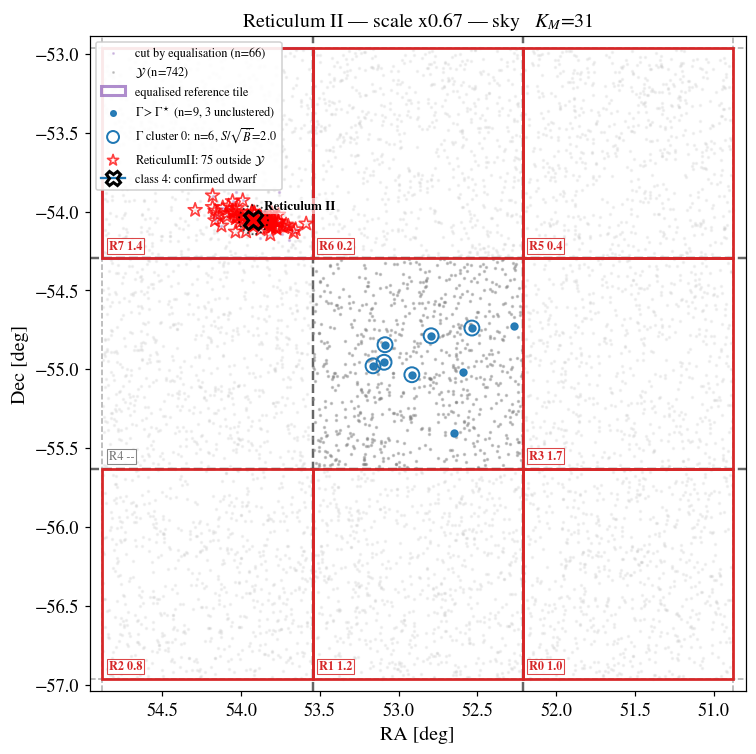

Underful Vlist: Vlist<w=10.52 h=12.73 d=0.00 s=0.00>[Hrule, Glue, Hlist<w=10.52 h=12.53 d=0.00 s=0.00>[Hbox, Hlist<w=7.47 h=12.53 d=0.00 s=0.00>[Vlist<w=7.47 h=12.53 d=0.00 s=0.00>[HCentered<w=7.38 h=2.00 d=0.00 s=0.00>[Glue, Hbox, `\circumflexaccent`, Glue], Vbox, Hlist<w=7.47 h=9.00 d=0.00 s=0.00>[`B`, k0.09]]], Hbox]]
Underful Vlist: Vlist<w=10.52 h=12.73 d=0.00 s=0.00>[Hrule, Glue, Hlist<w=10.52 h=12.53 d=0.00 s=0.00>[Hbox, Hlist<w=7.47 h=12.53 d=0.00 s=0.00>[Vlist<w=7.47 h=12.53 d=0.00 s=0.00>[HCentered<w=7.38 h=2.00 d=0.00 s=0.00>[Glue, Hbox, `\circumflexaccent`, Glue], Vbox, Hlist<w=7.47 h=9.00 d=0.00 s=0.00>[`B`, k0.09]]], Hbox]]


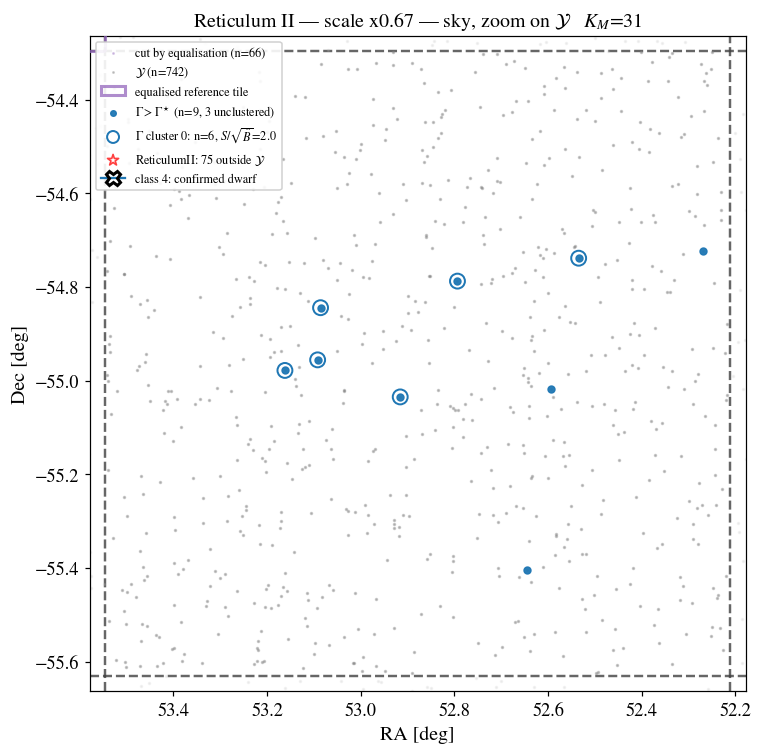

Underful Vlist: Vlist<w=10.52 h=12.73 d=0.00 s=0.00>[Hrule, Glue, Hlist<w=10.52 h=12.53 d=0.00 s=0.00>[Hbox, Hlist<w=7.47 h=12.53 d=0.00 s=0.00>[Vlist<w=7.47 h=12.53 d=0.00 s=0.00>[HCentered<w=7.38 h=2.00 d=0.00 s=0.00>[Glue, Hbox, `\circumflexaccent`, Glue], Vbox, Hlist<w=7.47 h=9.00 d=0.00 s=0.00>[`B`, k0.09]]], Hbox]]
Underful Vlist: Vlist<w=10.52 h=12.73 d=0.00 s=0.00>[Hrule, Glue, Hlist<w=10.52 h=12.53 d=0.00 s=0.00>[Hbox, Hlist<w=7.47 h=12.53 d=0.00 s=0.00>[Vlist<w=7.47 h=12.53 d=0.00 s=0.00>[HCentered<w=7.38 h=2.00 d=0.00 s=0.00>[Glue, Hbox, `\circumflexaccent`, Glue], Vbox, Hlist<w=7.47 h=9.00 d=0.00 s=0.00>[`B`, k0.09]]], Hbox]]


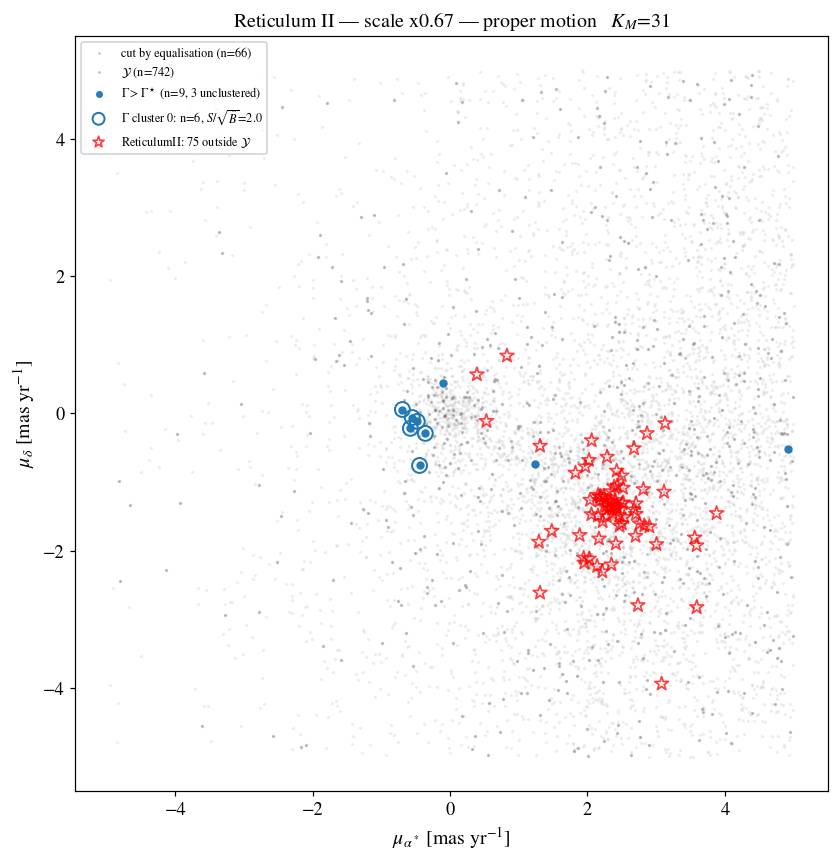

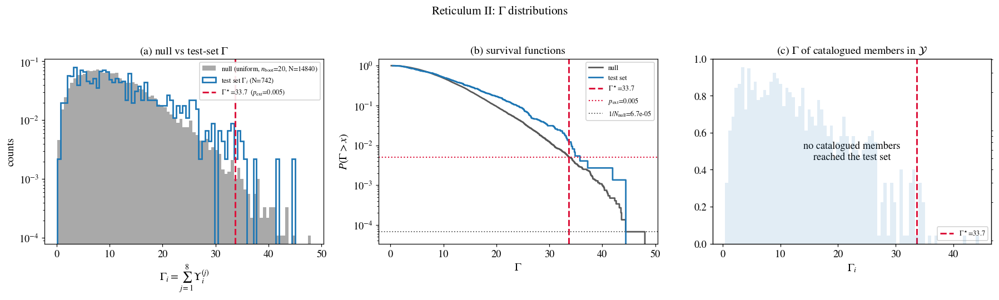

In [54]:
# ---- inspect ONE scan configuration with the Part 3 plots --------------------
# plot_field / plot_gamma_distributions were written against the Part 2/3 run dicts,
# so the two grid-dependent inputs (neigh, field_cat) must be rebuilt for THIS grid:
# the tile assignment and the Y-index space both change with the grid.
SCAN_LABEL = "scale x0.67"          # any key of scan_runs, e.g. "nominal", "shiftW"

run_s = scan_runs[SCAN_LABEL]
g_s   = run_s["grid"]
half_s = 3 * g_s["cell_h"]          # the full 3x3 footprint of this configuration

if "Gamma_null_mat" not in run_s:
    raise KeyError(
        f"{SCAN_LABEL!r} was produced before run_one stored the bootstrap null. "
        "Delete the scan cache and re-run Part 5 to get the Gamma-distribution panel.")

# Battaglia members and DW20 systems over THIS grid, with tiles assigned on it
bat_s = battaglia_systems_in_window(bat, g_s["ra0"], g_s["dec0"], half_s,
                                    NEIGHBOUR_PMEMB_MIN)
neigh_s = attach_members_to_run(bat_s, SCAN_R, run_s["parts"], target_name=TARGET_NAME)
field_cat_s = catalog_systems_in_window(dwarfs, g_s["ra0"], g_s["dec0"], half_s,
                                        g_s["ra0"], g_s["dec0"], g_s["cell_h"],
                                        classes=None)
NSTYLE = neighbour_style(neigh_s)   # plot_field reads this as a global

print(f"{SCAN_LABEL}:  h={g_s['cell_h']:.4f}  grid=({g_s['ra0']:.4f}, {g_s['dec0']:.4f})  "
      f"|Y|={run_s['nY']}  K_M={run_s['cfg']['kM']}  "
      f"Gamma*={run_s['Gamma_star']:.1f}  |A_Gamma|={int(run_s['A_Gamma_mask'].sum())}  "
      f"{len(run_s['gamma_clusters'])} cluster(s)")
print(f"DW20 systems on this grid: "
      + (", ".join(f"{n} (class {c})" for n, c in
                   zip(field_cat_s['Name'], field_cat_s['Class'])) or "none"))


STAT = "z_EE"


# K_M actually used by THIS configuration, for the plot titles. "auto" resolves to
# floor(0.05*min(min_j nX_j, nY)) AFTER equalisation, so it differs per config; and a
# fixed K_M can sit above the locality bound, which is worth seeing on the figure.
_cfg_s  = run_s["cfg"]
_kmb    = _cfg_s.get("km_bound")
_KM_TAG = ("   $K_M$=" + str(_cfg_s["kM"])
           + (" (auto)" if _cfg_s.get("km_mode") == "auto" else "")
           + (f", bound {_kmb}" if _kmb else "")
           + (" — ABOVE BOUND" if (_kmb and _cfg_s["kM"] > _kmb) else ""))

ax = plot_field(run_s, SCAN_R, neigh_s, field_cat_s, space="sky",
                title=f"{DWARF} — {SCAN_LABEL} — sky{_KM_TAG}")
wt.label_reference_tiles(ax, run_s, r=SCAN_R, target=TARGET, stat=STAT, verbose=True)
plt.show()



plot_field(run_s, SCAN_R, neigh_s, field_cat_s, space="sky", zoom_to_Y=True,
           title=f"{DWARF} — {SCAN_LABEL} — sky, zoom on $\\mathcal{{Y}}${_KM_TAG}")
plt.show()

plot_field(run_s, SCAN_R, neigh_s, field_cat_s, space="pm",
           title=f"{DWARF} — {SCAN_LABEL} — proper motion{_KM_TAG}")
plt.show()

plot_gamma_distributions(run_s, neigh_s)
plt.show()

### Is the persistent cluster gravitationally allowed?

Two dynamical questions, and only one of them is answerable with Gaia.

**Internal binding — not answerable.** `wt.boundedness()` needs the velocity
dispersion, and a UFD at tens of kpc has `sigma_v` of a few km/s, i.e. `sigma_PM ~
0.02-0.03 mas/yr` — an order of magnitude below Gaia's per-star error at G~20. Run it
on Reticulum II, which IS bound (`sigma_v` = 3.3 km/s spectroscopic), and it "requires"
5e8 Msun just like the candidate. The test has no power in either direction; that is a
statement about Gaia, not about the object. Confirmation needs spectroscopy at 2-3 km/s.

**Tidal extent — answerable, and needs no velocities at all.** The Milky Way's tide
strips anything beyond the Jacobi radius `r_J = D (M / 3 M_MW(<D))^(1/3)`, so `r_J` is
a hard ceiling on the size of a bound object. Turned around, the observed extent sets
a MINIMUM bound mass. Projected radius is a lower bound on true 3D extent, so that
minimum mass is itself a lower bound — one-sided, in the safe direction.

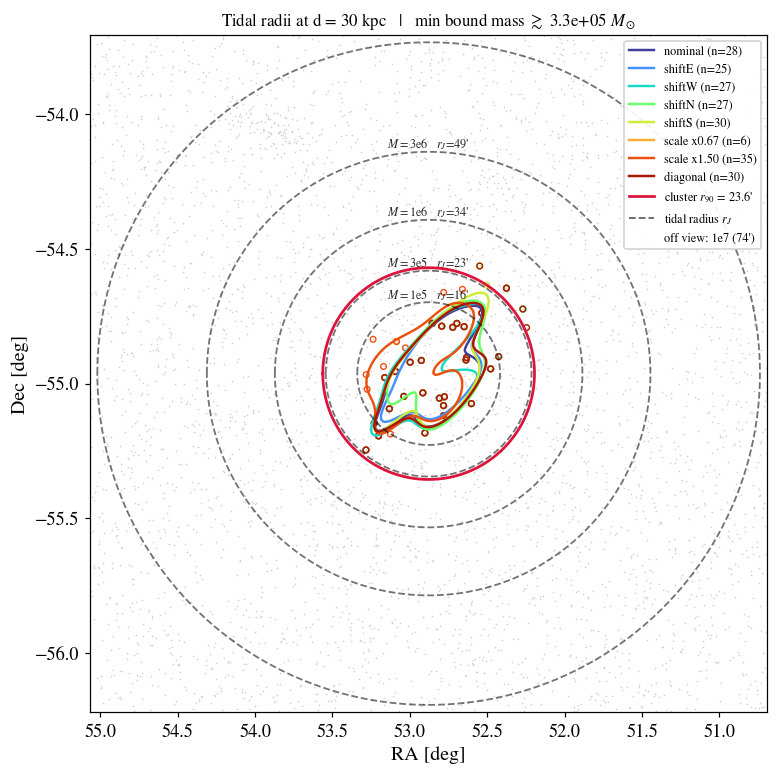

cluster r90        = 23.6 arcmin = 206 pc at 30 kpc
minimum bound mass = 3.26e+05 Msun   (lower bound: projected radius underestimates the true 3D extent)
   M=   1e+05 Msun -> r_J =   15.9'   cluster EXCEEDS it
   M=   3e+05 Msun -> r_J =   22.9'   cluster EXCEEDS it
   M=   1e+06 Msun -> r_J =   34.2'   cluster fits inside
   M=   3e+06 Msun -> r_J =   49.4'   cluster fits inside
   M=   1e+07 Msun -> r_J =   73.8'   cluster fits inside

--- internal-binding check (expect NO POWER at this distance) ---
    distance assumed    : 30.0 kpc
    R_h (projected)     : 105 pc  -> r_1/2 = 140 pc
    sigma_PM observed   : 0.457 mas/yr = 65.0 km/s per component
    M_1/2 needed to bind: 5.51e+08 Msun (from the OBSERVED spread, which is error-dominated)
      95% upper limit   : unconstrained (observed spread is below the measurement error, so no limit exists)
    stellar mass (crude): 1.2e+03 Msun -> v_esc = 0.268 km/s from stars alone
    POWER: a UFD (M_1/2=1e6) would show sigma_PM = 0.0195 

In [ ]:
import importlib, wake_test as wt
importlib.reload(wt)

DIST_KPC = 30.0          # assumed distance; r_J scales as D and the mass as D^3
RUNS = scan_runs if "scan_runs" in globals() else run     # stacked scan, or one run
RTAB = SCAN_R  if "SCAN_R"    in globals() else r

ax, ginfo = wt.plot_grav_radii(
    RUNS, RTAB, DIST_KPC,
    ra_c=float(TARGET["ra_c"]) if "TARGET" in globals() else None,
    dec_c=float(TARGET["dec_c"]) if "TARGET" in globals() else None,
    masses=(1e5, 3e5, 1e6, 3e6, 1e7))
plt.show()

print(f"cluster r90        = {ginfo['r90_deg']*60:.1f} arcmin "
      f"= {ginfo['r90_deg']*np.pi/180*DIST_KPC*1e3:.0f} pc at {DIST_KPC:.0f} kpc")
print(f"minimum bound mass = {ginfo['M_min']:.2e} Msun   (lower bound: projected "
      f"radius underestimates the true 3D extent)")
for M, rd in ginfo["rJ_deg"].items():
    print(f"   M={M:8.0e} Msun -> r_J = {rd*60:6.1f}'   cluster "
          f"{'fits inside' if ginfo['r90_deg'] < rd else 'EXCEEDS it'}")

# The dispersion-based test, kept for the record -- read its POWER line, not its mass.
if "run" in globals() and run.get("gamma_clusters"):
    print("\n--- internal-binding check (expect NO POWER at this distance) ---")
    _res = wt.classify_cluster(run, r, sorted(run["gamma_clusters"])[0], DIST_KPC,
                               cache_dir=CACHE_DIR, eps=DBSCAN_EPS, n_mc=500)
    wt.boundedness(_res, DIST_KPC)

### Isochrone fit — is this one population, and at what distance?

An isochrone is the CMD locus of a coeval, chemically homogeneous population: fix age
and [Fe/H], and mass alone says where a star sits on the curve. Faint to bright it runs
main sequence -> turn-off (the age clock) -> subgiant -> RGB -> tip. **Distance modulus**
`mu = 5log10(d/10pc)` slides the whole curve vertically; **reddening** slides it
diagonally; age and metallicity change its shape.

For a UFD at ~30 kpc, `mu ~ 17.4` puts the turn-off at G ~ 21.4, past Gaia's limit —
**Gaia sees only the upper RGB and the horizontal branch**. That is why Reticulum II has
75 Gaia members rather than thousands, and it leaves the RGB's colour-magnitude slope
as the one feature available to fit.

We fit an **empirical** ridgeline built from Reticulum II's own members rather than a
theoretical isochrone: same photometric system, same field reddening, same error
behaviour, and no assumption about age, [Fe/H] or bandpass calibration — all of which
are degenerate with distance over so short a magnitude range. The cost is coverage: the
template spans only the `M_G` range Reticulum II populates (about -1.7 to +3.5), so the
scan is valid over roughly **24-63 kpc**. Anything nearer lands on the main sequence,
which Gaia cannot see at 30 kpc, and needs a real isochrone library (PARSEC / MIST).

The statistic is the median |observed - predicted| colour, compared at every `mu`
against **magnitude-matched** field stars — faint stars have broader colours, so an
unmatched null would reward the candidate for being faint rather than coherent.

DW20: ReticulumII = 'Reticulum II', D = 30.0 kpc
  template ReticulumII: 75 members (75 local, 0 fetched, 0 unavailable)
template mu=17.39, covers M_G -1.66 .. 3.49
  best mu = 17.40  (d = 30.2 kpc)  T_obs=0.205 vs field 0.308  p=0.0533   [39 stars]
  testable mu range 17.00-19.00 = 25-63 kpc (template coverage)


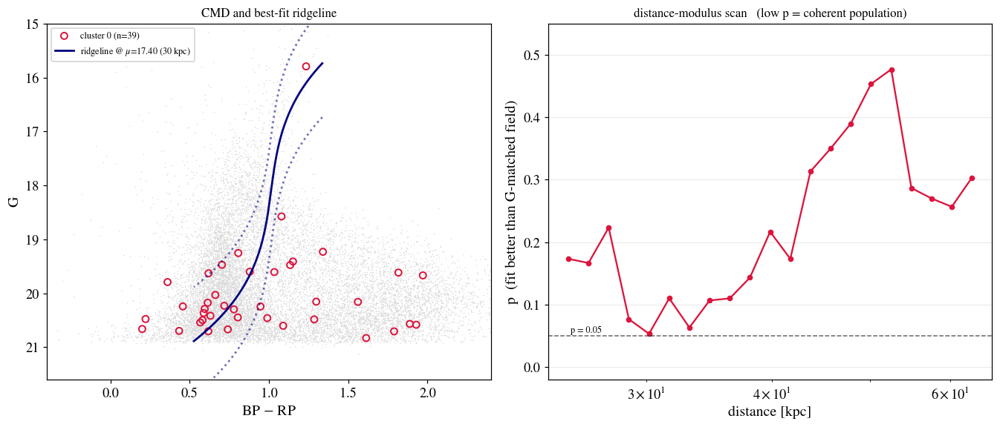


VALIDATION -- fit 37 held-out ReticulumII members (truth mu=17.39):
  best mu = 17.00  (d = 25.1 kpc)  T_obs=0.077 vs field 0.216  p=0.0000   [24 stars]
  testable mu range 16.90-19.00 = 24-63 kpc (template coverage)


In [ ]:
import importlib, wake_test as wt
importlib.reload(wt)

# ---- template: a known system at a known distance ----------------------------
# It does NOT have to be in this field. Members outside the queried box are fetched
# from Gaia by source_id (one small query, cached) -- otherwise the ridgeline would
# silently be built from zero stars.
TEMPLATE_NAME = "ReticulumII"      # Battaglia key, e.g. "ReticulumII", "BootesIII"
TEMPLATE_DIST = None             # kpc; None -> look it up in DW20

if TEMPLATE_DIST is None:
    TEMPLATE_DIST, _dwname = wt._dw20_distance(dwarfs, TEMPLATE_NAME)
    if TEMPLATE_DIST is None:
        raise ValueError(f"{TEMPLATE_NAME!r} not found in DW20 -- set TEMPLATE_DIST "
                         f"by hand")
    print(f"DW20: {TEMPLATE_NAME} = '{_dwname}', D = {TEMPLATE_DIST} kpc")
MU_TMPL = 5*np.log10(TEMPLATE_DIST*1e3/10.)

_tg, _tc, _tinfo = wt.template_photometry(bat, TEMPLATE_NAME, r,
                                          pmemb_min=NEIGHBOUR_PMEMB_MIN,
                                          cache_dir=CACHE_DIR)
if _tg.size < 20:
    raise RuntimeError(f"only {_tg.size} template stars with photometry -- too few "
                       f"for a ridgeline (need ~20+). Pick another template.")
# Template members that ARE in this field must be excluded from the field control
# below, or the comparison sample contains the very population we are fitting.
_sid = np.asarray(r["source_id"], dtype="int64")
_tm  = np.isin(_sid, np.fromiter(
    {int(x) for x in bat[(bat["Galaxy"]==TEMPLATE_NAME)
                         & (bat["Pmemb"]>NEIGHBOUR_PMEMB_MIN)]["GaiaEDR3"]},
    dtype="int64"))

ridge, M_RANGE = wt.build_ridgeline(_tg, _tc, MU_TMPL)
print(f"template mu={MU_TMPL:.2f}, covers M_G {M_RANGE[0]:.2f} .. {M_RANGE[1]:.2f}")

# ---- the cluster to fit, and the field it is compared against -----------------
GID   = sorted(run["gamma_clusters"])[0]
_rows = np.asarray(run["parts"]["test_idx"], int)[
    np.asarray(run["gamma_clusters"][GID], int)]
_ins  = np.where(np.asarray(run["parts"]["inside"], bool))[0]
_fld  = np.setdiff1d(_ins, np.union1d(_rows, np.where(_tm)[0]))

MU_GRID = np.arange(16.0, 19.01, 0.10)
df_iso = wt.isochrone_scan(r["phot_g_mean_mag"][_rows], r["bp_rp"][_rows],
                           ridge, M_RANGE, mu_grid=MU_GRID,
                           g_field=r["phot_g_mean_mag"][_fld],
                           col_field=r["bp_rp"][_fld], n_null=300)

axes, best = wt.plot_isochrone_scan(
    df_iso, r["phot_g_mean_mag"][_rows], r["bp_rp"][_rows], ridge, M_RANGE,
    r["phot_g_mean_mag"][_fld], r["bp_rp"][_fld], label=f"cluster {GID}")
plt.tight_layout(); plt.show()

# ---- VALIDATION: does the machinery recover a distance it already knows? ------
# Template from half the members, fit the other half. Without this the scan is
# uncalibrated -- a null result could just mean the method has no power.
# Split the TEMPLATE arrays (which may have come from Gaia, not from `r`).
_p = np.random.default_rng(0).permutation(_tg.size)
_A, _B = _p[::2], _p[1::2]
_ridgeA, _MrA = wt.build_ridgeline(_tg[_A], _tc[_A], MU_TMPL)
print(f"\nVALIDATION -- fit {_B.size} held-out {TEMPLATE_NAME} members "
      f"(truth mu={MU_TMPL:.2f}):")
_ = wt.isochrone_scan(_tg[_B], _tc[_B], _ridgeA, _MrA,
                      mu_grid=MU_GRID, g_field=r["phot_g_mean_mag"][_fld],
                      col_field=r["bp_rp"][_fld], n_null=300)

available scan configurations: ['nominal', 'shiftE', 'shiftW', 'shiftN', 'shiftS', 'scale x0.67', 'scale x1.50', 'diagonal']
fitting scan: scale x1.50  (h=1.5000, 3 cluster(s))
template: ReticulumII, 75 members, mu=17.39
template covers M_G -1.66 .. 3.49  -> testable range 3-321 kpc-ish
cluster 1: 35 stars, field comparison 31963 stars
  best mu = 17.30  (d = 28.8 kpc)  T_obs=0.192 vs field 0.306  p=0.0300   [34 stars]
  testable mu range 17.00-19.00 = 25-63 kpc (template coverage)


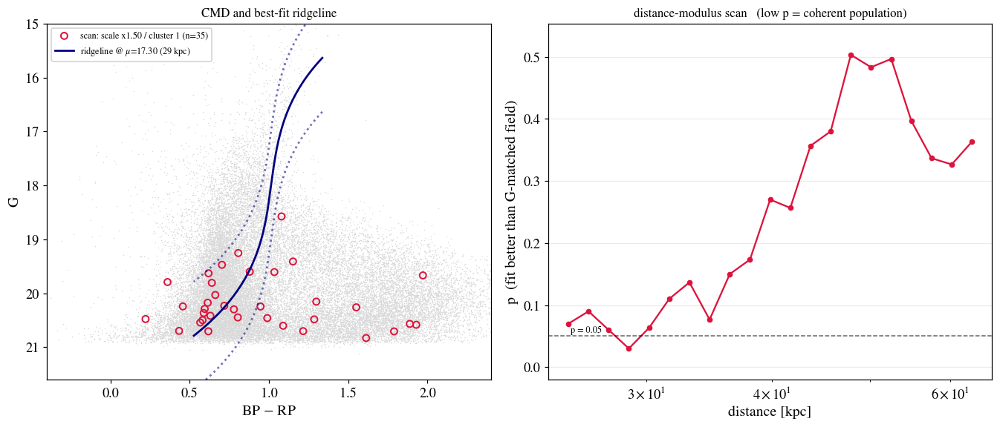


VALIDATION -- fit 37 held-out ReticulumII members (truth mu=17.39):
  best mu = 17.00  (d = 25.1 kpc)  T_obs=0.077 vs field 0.217  p=0.0000   [24 stars]
  testable mu range 16.90-19.00 = 24-63 kpc (template coverage)


In [ ]:
import importlib, wake_test as wt
importlib.reload(wt)

# ======================= WHICH RESULT TO FIT =======================
# None            -> the Part 2/3 `run`
# "shiftW", ...   -> that Part 5 scan configuration
ISO_RUN_KEY = 'scale x1.50'
ISO_GID     = None      # None -> cluster nearest ISO_RADEC, else the largest
ISO_RADEC   = ((float(TARGET["ra_c"]), float(TARGET["dec_c"]))
               if "TARGET" in globals() else None)

if "scan_runs" in globals():
    print("available scan configurations:", list(scan_runs))
if ISO_RUN_KEY is None:
    ISO_RUN, ISO_TAB, _tag = run, r, "discovery run"
else:
    # scan runs were computed on SCAN_R -- the table MUST match the run, because
    # parts["test_idx"] holds row indices into it.
    ISO_RUN, ISO_TAB, _tag = scan_runs[ISO_RUN_KEY], SCAN_R, f"scan: {ISO_RUN_KEY}"
print(f"fitting {_tag}  (h={ISO_RUN['grid']['cell_h']:.4f}, "
      f"{len(ISO_RUN['gamma_clusters'])} cluster(s))")

# ---- template: a known system in the same field, at a known distance ----------
TEMPLATE_NAME = "ReticulumII"        # Battaglia key
TEMPLATE_DIST = 30.0                 # kpc (DW20)
MU_TMPL = 5*np.log10(TEMPLATE_DIST*1e3/10.)

_sid = np.asarray(ISO_TAB["source_id"], dtype="int64")
_tm  = np.isin(_sid, np.fromiter(
    {int(x) for x in bat[(bat["Galaxy"]==TEMPLATE_NAME)&(bat["Pmemb"]>0.5)]["GaiaEDR3"]},
    dtype="int64"))
print(f"template: {TEMPLATE_NAME}, {_tm.sum()} members, mu={MU_TMPL:.2f}")
ridge, M_RANGE = wt.build_ridgeline(ISO_TAB["phot_g_mean_mag"][_tm],
                                    ISO_TAB["bp_rp"][_tm], MU_TMPL)
print(f"template covers M_G {M_RANGE[0]:.2f} .. {M_RANGE[1]:.2f}  -> testable range "
      f"{10**((min(ISO_TAB['phot_g_mean_mag'][_tm])-M_RANGE[1])/5-2):.0f}"
      f"-{10**((max(ISO_TAB['phot_g_mean_mag'][_tm])-M_RANGE[0])/5-2):.0f} kpc-ish")

# ---- the cluster, and the field it is compared against ------------------------
# Select by POSITION: DBSCAN relabels clusters every run, so gid is not comparable
# across scan configurations.
_rows, _gid = wt.cluster_rows(ISO_RUN, ISO_TAB, gid=ISO_GID,
                              ra_c=None if ISO_RADEC is None else ISO_RADEC[0],
                              dec_c=None if ISO_RADEC is None else ISO_RADEC[1])
_ins = np.where(np.asarray(ISO_RUN["parts"]["inside"], bool))[0]
_fld = np.setdiff1d(_ins, np.union1d(_rows, np.where(_tm)[0]))
print(f"cluster {_gid}: {len(_rows)} stars, field comparison {_fld.size} stars")

MU_GRID = np.arange(16.0, 19.01, 0.10)
df_iso = wt.isochrone_scan(ISO_TAB["phot_g_mean_mag"][_rows], ISO_TAB["bp_rp"][_rows],
                           ridge, M_RANGE, mu_grid=MU_GRID,
                           g_field=ISO_TAB["phot_g_mean_mag"][_fld],
                           col_field=ISO_TAB["bp_rp"][_fld], n_null=300)

axes, best = wt.plot_isochrone_scan(
    df_iso, ISO_TAB["phot_g_mean_mag"][_rows], ISO_TAB["bp_rp"][_rows], ridge, M_RANGE,
    ISO_TAB["phot_g_mean_mag"][_fld], ISO_TAB["bp_rp"][_fld],
    label=f"{_tag} / cluster {_gid}")
plt.tight_layout(); plt.show()

# ---- VALIDATION: does the machinery recover a distance it already knows? ------
# Template from half the members, fit the other half. Without this a null result
# could just mean the method has no power at these magnitudes.
_ix = np.where(_tm)[0]; _p = np.random.default_rng(0).permutation(len(_ix))
_A, _B = _ix[_p[::2]], _ix[_p[1::2]]
_rA, _MA = wt.build_ridgeline(ISO_TAB["phot_g_mean_mag"][_A], ISO_TAB["bp_rp"][_A], MU_TMPL)
print(f"\nVALIDATION -- fit {len(_B)} held-out {TEMPLATE_NAME} members "
      f"(truth mu={MU_TMPL:.2f}):")
_ = wt.isochrone_scan(ISO_TAB["phot_g_mean_mag"][_B], ISO_TAB["bp_rp"][_B], _rA, _MA,
                      mu_grid=MU_GRID, g_field=ISO_TAB["phot_g_mean_mag"][_fld],
                      col_field=ISO_TAB["bp_rp"][_fld], n_null=300)

available scan configurations: ['nominal', 'shiftE', 'shiftW', 'shiftN', 'shiftS', 'scale x0.67', 'scale x1.50', 'diagonal']
fitting scan: shiftN  (h=1.0000, 2 cluster(s))
template: ReticulumII, 75 members, mu=17.39
template covers M_G -1.66 .. 3.49  -> testable range 3-321 kpc-ish
cluster 0: 27 stars, field comparison 14031 stars
  best mu = 17.60  (d = 33.1 kpc)  T_obs=0.211 vs field 0.305  p=0.0400   [27 stars]
  testable mu range 16.90-19.00 = 24-63 kpc (template coverage)


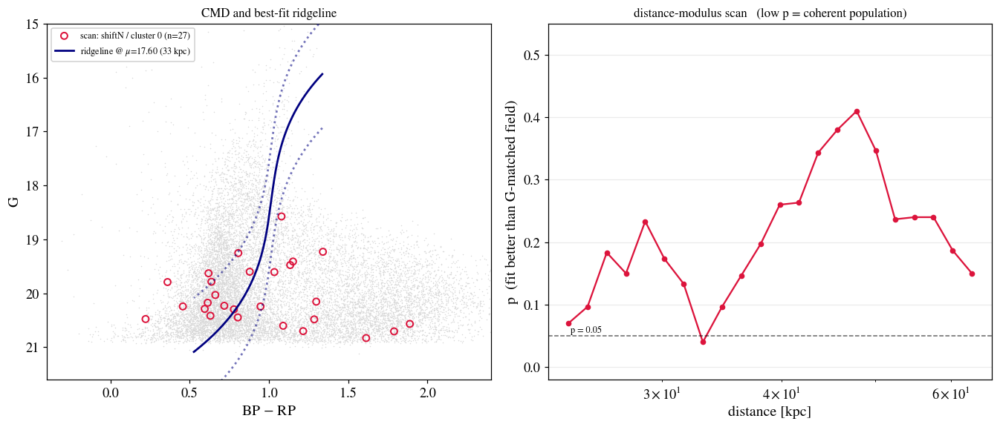


VALIDATION -- fit 37 held-out ReticulumII members (truth mu=17.39):
  best mu = 17.00  (d = 25.1 kpc)  T_obs=0.077 vs field 0.212  p=0.0000   [24 stars]
  testable mu range 16.90-19.00 = 24-63 kpc (template coverage)


In [ ]:
import importlib, wake_test as wt
importlib.reload(wt)

# ======================= WHICH RESULT TO FIT =======================
# None            -> the Part 2/3 `run`
# "shiftW", ...   -> that Part 5 scan configuration
ISO_RUN_KEY = 'shiftN'
ISO_GID     = None      # None -> cluster nearest ISO_RADEC, else the largest
ISO_RADEC   = ((float(TARGET["ra_c"]), float(TARGET["dec_c"]))
               if "TARGET" in globals() else None)

if "scan_runs" in globals():
    print("available scan configurations:", list(scan_runs))
if ISO_RUN_KEY is None:
    ISO_RUN, ISO_TAB, _tag = run, r, "discovery run"
else:
    # scan runs were computed on SCAN_R -- the table MUST match the run, because
    # parts["test_idx"] holds row indices into it.
    ISO_RUN, ISO_TAB, _tag = scan_runs[ISO_RUN_KEY], SCAN_R, f"scan: {ISO_RUN_KEY}"
print(f"fitting {_tag}  (h={ISO_RUN['grid']['cell_h']:.4f}, "
      f"{len(ISO_RUN['gamma_clusters'])} cluster(s))")

# ---- template: a known system in the same field, at a known distance ----------
TEMPLATE_NAME = "ReticulumII"        # Battaglia key
TEMPLATE_DIST = 30.0                 # kpc (DW20)
MU_TMPL = 5*np.log10(TEMPLATE_DIST*1e3/10.)

_sid = np.asarray(ISO_TAB["source_id"], dtype="int64")
_tm  = np.isin(_sid, np.fromiter(
    {int(x) for x in bat[(bat["Galaxy"]==TEMPLATE_NAME)&(bat["Pmemb"]>0.5)]["GaiaEDR3"]},
    dtype="int64"))
print(f"template: {TEMPLATE_NAME}, {_tm.sum()} members, mu={MU_TMPL:.2f}")
ridge, M_RANGE = wt.build_ridgeline(ISO_TAB["phot_g_mean_mag"][_tm],
                                    ISO_TAB["bp_rp"][_tm], MU_TMPL)
print(f"template covers M_G {M_RANGE[0]:.2f} .. {M_RANGE[1]:.2f}  -> testable range "
      f"{10**((min(ISO_TAB['phot_g_mean_mag'][_tm])-M_RANGE[1])/5-2):.0f}"
      f"-{10**((max(ISO_TAB['phot_g_mean_mag'][_tm])-M_RANGE[0])/5-2):.0f} kpc-ish")

# ---- the cluster, and the field it is compared against ------------------------
# Select by POSITION: DBSCAN relabels clusters every run, so gid is not comparable
# across scan configurations.
_rows, _gid = wt.cluster_rows(ISO_RUN, ISO_TAB, gid=ISO_GID,
                              ra_c=None if ISO_RADEC is None else ISO_RADEC[0],
                              dec_c=None if ISO_RADEC is None else ISO_RADEC[1])
_ins = np.where(np.asarray(ISO_RUN["parts"]["inside"], bool))[0]
_fld = np.setdiff1d(_ins, np.union1d(_rows, np.where(_tm)[0]))
print(f"cluster {_gid}: {len(_rows)} stars, field comparison {_fld.size} stars")

MU_GRID = np.arange(16.0, 19.01, 0.10)
df_iso = wt.isochrone_scan(ISO_TAB["phot_g_mean_mag"][_rows], ISO_TAB["bp_rp"][_rows],
                           ridge, M_RANGE, mu_grid=MU_GRID,
                           g_field=ISO_TAB["phot_g_mean_mag"][_fld],
                           col_field=ISO_TAB["bp_rp"][_fld], n_null=300)

axes, best = wt.plot_isochrone_scan(
    df_iso, ISO_TAB["phot_g_mean_mag"][_rows], ISO_TAB["bp_rp"][_rows], ridge, M_RANGE,
    ISO_TAB["phot_g_mean_mag"][_fld], ISO_TAB["bp_rp"][_fld],
    label=f"{_tag} / cluster {_gid}")
plt.tight_layout(); plt.show()

# ---- VALIDATION: does the machinery recover a distance it already knows? ------
# Template from half the members, fit the other half. Without this a null result
# could just mean the method has no power at these magnitudes.
_ix = np.where(_tm)[0]; _p = np.random.default_rng(0).permutation(len(_ix))
_A, _B = _ix[_p[::2]], _ix[_p[1::2]]
_rA, _MA = wt.build_ridgeline(ISO_TAB["phot_g_mean_mag"][_A], ISO_TAB["bp_rp"][_A], MU_TMPL)
print(f"\nVALIDATION -- fit {len(_B)} held-out {TEMPLATE_NAME} members "
      f"(truth mu={MU_TMPL:.2f}):")
_ = wt.isochrone_scan(ISO_TAB["phot_g_mean_mag"][_B], ISO_TAB["bp_rp"][_B], _rA, _MA,
                      mu_grid=MU_GRID, g_field=ISO_TAB["phot_g_mean_mag"][_fld],
                      col_field=ISO_TAB["bp_rp"][_fld], n_null=300)

available scan configurations: ['nominal', 'shiftE', 'shiftW', 'shiftN', 'shiftS', 'scale x0.67', 'scale x1.50', 'diagonal']
fitting scan: shiftW  (h=1.0000, 1 cluster(s))
template: ReticulumII, 75 members, mu=17.39
template covers M_G -1.66 .. 3.49  -> testable range 3-321 kpc-ish
cluster 0: 27 stars, field comparison 14058 stars
  best mu = 17.60  (d = 33.1 kpc)  T_obs=0.211 vs field 0.297  p=0.0833   [27 stars]
  testable mu range 16.90-19.00 = 24-63 kpc (template coverage)


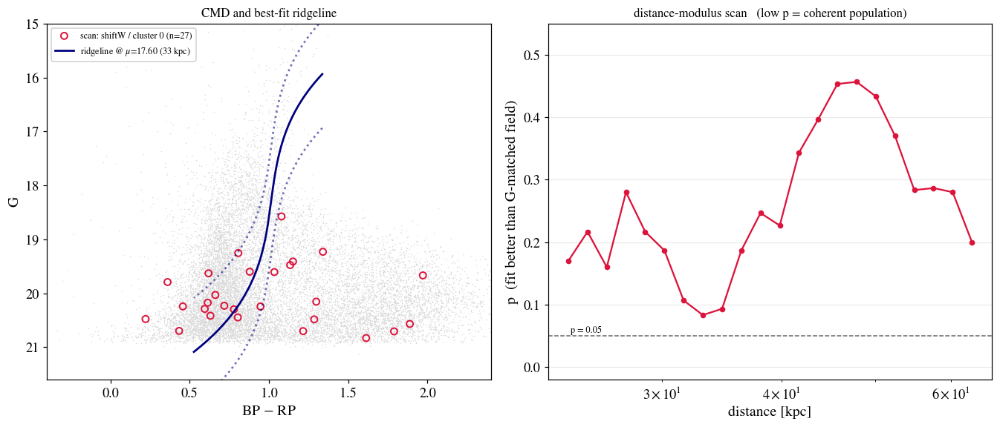


VALIDATION -- fit 37 held-out ReticulumII members (truth mu=17.39):
  best mu = 17.00  (d = 25.1 kpc)  T_obs=0.077 vs field 0.219  p=0.0000   [24 stars]
  testable mu range 16.90-19.00 = 24-63 kpc (template coverage)


In [ ]:
import importlib, wake_test as wt
importlib.reload(wt)

# ======================= WHICH RESULT TO FIT =======================
# None            -> the Part 2/3 `run`
# "shiftW", ...   -> that Part 5 scan configuration
ISO_RUN_KEY = 'shiftW'
ISO_GID     = None      # None -> cluster nearest ISO_RADEC, else the largest
ISO_RADEC   = ((float(TARGET["ra_c"]), float(TARGET["dec_c"]))
               if "TARGET" in globals() else None)

if "scan_runs" in globals():
    print("available scan configurations:", list(scan_runs))
if ISO_RUN_KEY is None:
    ISO_RUN, ISO_TAB, _tag = run, r, "discovery run"
else:
    # scan runs were computed on SCAN_R -- the table MUST match the run, because
    # parts["test_idx"] holds row indices into it.
    ISO_RUN, ISO_TAB, _tag = scan_runs[ISO_RUN_KEY], SCAN_R, f"scan: {ISO_RUN_KEY}"
print(f"fitting {_tag}  (h={ISO_RUN['grid']['cell_h']:.4f}, "
      f"{len(ISO_RUN['gamma_clusters'])} cluster(s))")

# ---- template: a known system in the same field, at a known distance ----------
TEMPLATE_NAME = "ReticulumII"        # Battaglia key
TEMPLATE_DIST = 30.0                 # kpc (DW20)
MU_TMPL = 5*np.log10(TEMPLATE_DIST*1e3/10.)

_sid = np.asarray(ISO_TAB["source_id"], dtype="int64")
_tm  = np.isin(_sid, np.fromiter(
    {int(x) for x in bat[(bat["Galaxy"]==TEMPLATE_NAME)&(bat["Pmemb"]>0.5)]["GaiaEDR3"]},
    dtype="int64"))
print(f"template: {TEMPLATE_NAME}, {_tm.sum()} members, mu={MU_TMPL:.2f}")
ridge, M_RANGE = wt.build_ridgeline(ISO_TAB["phot_g_mean_mag"][_tm],
                                    ISO_TAB["bp_rp"][_tm], MU_TMPL)
print(f"template covers M_G {M_RANGE[0]:.2f} .. {M_RANGE[1]:.2f}  -> testable range "
      f"{10**((min(ISO_TAB['phot_g_mean_mag'][_tm])-M_RANGE[1])/5-2):.0f}"
      f"-{10**((max(ISO_TAB['phot_g_mean_mag'][_tm])-M_RANGE[0])/5-2):.0f} kpc-ish")

# ---- the cluster, and the field it is compared against ------------------------
# Select by POSITION: DBSCAN relabels clusters every run, so gid is not comparable
# across scan configurations.
_rows, _gid = wt.cluster_rows(ISO_RUN, ISO_TAB, gid=ISO_GID,
                              ra_c=None if ISO_RADEC is None else ISO_RADEC[0],
                              dec_c=None if ISO_RADEC is None else ISO_RADEC[1])
_ins = np.where(np.asarray(ISO_RUN["parts"]["inside"], bool))[0]
_fld = np.setdiff1d(_ins, np.union1d(_rows, np.where(_tm)[0]))
print(f"cluster {_gid}: {len(_rows)} stars, field comparison {_fld.size} stars")

MU_GRID = np.arange(16.0, 19.01, 0.10)
df_iso = wt.isochrone_scan(ISO_TAB["phot_g_mean_mag"][_rows], ISO_TAB["bp_rp"][_rows],
                           ridge, M_RANGE, mu_grid=MU_GRID,
                           g_field=ISO_TAB["phot_g_mean_mag"][_fld],
                           col_field=ISO_TAB["bp_rp"][_fld], n_null=300)

axes, best = wt.plot_isochrone_scan(
    df_iso, ISO_TAB["phot_g_mean_mag"][_rows], ISO_TAB["bp_rp"][_rows], ridge, M_RANGE,
    ISO_TAB["phot_g_mean_mag"][_fld], ISO_TAB["bp_rp"][_fld],
    label=f"{_tag} / cluster {_gid}")
plt.tight_layout(); plt.show()

# ---- VALIDATION: does the machinery recover a distance it already knows? ------
# Template from half the members, fit the other half. Without this a null result
# could just mean the method has no power at these magnitudes.
_ix = np.where(_tm)[0]; _p = np.random.default_rng(0).permutation(len(_ix))
_A, _B = _ix[_p[::2]], _ix[_p[1::2]]
_rA, _MA = wt.build_ridgeline(ISO_TAB["phot_g_mean_mag"][_A], ISO_TAB["bp_rp"][_A], MU_TMPL)
print(f"\nVALIDATION -- fit {len(_B)} held-out {TEMPLATE_NAME} members "
      f"(truth mu={MU_TMPL:.2f}):")
_ = wt.isochrone_scan(ISO_TAB["phot_g_mean_mag"][_B], ISO_TAB["bp_rp"][_B], _rA, _MA,
                      mu_grid=MU_GRID, g_field=ISO_TAB["phot_g_mean_mag"][_fld],
                      col_field=ISO_TAB["bp_rp"][_fld], n_null=300)

available scan configurations: ['nominal', 'shiftE', 'shiftW', 'shiftN', 'shiftS', 'scale x0.67', 'scale x1.50', 'diagonal']
fitting scan: shiftN  (h=1.0000, 2 cluster(s))
template: ReticulumII, 75 members, mu=17.39
template covers M_G -1.66 .. 3.49  -> testable range 3-321 kpc-ish
cluster 0: 27 stars, field comparison 14031 stars
  best mu = 17.60  (d = 33.1 kpc)  T_obs=0.211 vs field 0.305  p=0.0400   [27 stars]
  testable mu range 16.90-19.00 = 24-63 kpc (template coverage)


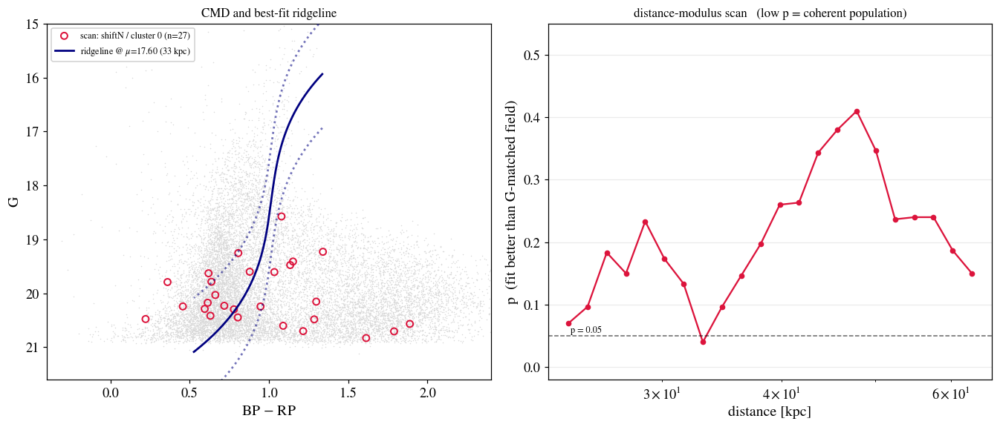


VALIDATION -- fit 37 held-out ReticulumII members (truth mu=17.39):
  best mu = 17.00  (d = 25.1 kpc)  T_obs=0.077 vs field 0.212  p=0.0000   [24 stars]
  testable mu range 16.90-19.00 = 24-63 kpc (template coverage)


In [ ]:
import importlib, wake_test as wt
importlib.reload(wt)

# ======================= WHICH RESULT TO FIT =======================
# None            -> the Part 2/3 `run`
# "shiftW", ...   -> that Part 5 scan configuration
ISO_RUN_KEY = 'shiftN'
ISO_GID     = None      # None -> cluster nearest ISO_RADEC, else the largest
ISO_RADEC   = ((float(TARGET["ra_c"]), float(TARGET["dec_c"]))
               if "TARGET" in globals() else None)

if "scan_runs" in globals():
    print("available scan configurations:", list(scan_runs))
if ISO_RUN_KEY is None:
    ISO_RUN, ISO_TAB, _tag = run, r, "discovery run"
else:
    # scan runs were computed on SCAN_R -- the table MUST match the run, because
    # parts["test_idx"] holds row indices into it.
    ISO_RUN, ISO_TAB, _tag = scan_runs[ISO_RUN_KEY], SCAN_R, f"scan: {ISO_RUN_KEY}"
print(f"fitting {_tag}  (h={ISO_RUN['grid']['cell_h']:.4f}, "
      f"{len(ISO_RUN['gamma_clusters'])} cluster(s))")

# ---- template: a known system in the same field, at a known distance ----------
TEMPLATE_NAME = "ReticulumII"        # Battaglia key
TEMPLATE_DIST = 30.0                 # kpc (DW20)
MU_TMPL = 5*np.log10(TEMPLATE_DIST*1e3/10.)

_sid = np.asarray(ISO_TAB["source_id"], dtype="int64")
_tm  = np.isin(_sid, np.fromiter(
    {int(x) for x in bat[(bat["Galaxy"]==TEMPLATE_NAME)&(bat["Pmemb"]>0.5)]["GaiaEDR3"]},
    dtype="int64"))
print(f"template: {TEMPLATE_NAME}, {_tm.sum()} members, mu={MU_TMPL:.2f}")
ridge, M_RANGE = wt.build_ridgeline(ISO_TAB["phot_g_mean_mag"][_tm],
                                    ISO_TAB["bp_rp"][_tm], MU_TMPL)
print(f"template covers M_G {M_RANGE[0]:.2f} .. {M_RANGE[1]:.2f}  -> testable range "
      f"{10**((min(ISO_TAB['phot_g_mean_mag'][_tm])-M_RANGE[1])/5-2):.0f}"
      f"-{10**((max(ISO_TAB['phot_g_mean_mag'][_tm])-M_RANGE[0])/5-2):.0f} kpc-ish")

# ---- the cluster, and the field it is compared against ------------------------
# Select by POSITION: DBSCAN relabels clusters every run, so gid is not comparable
# across scan configurations.
_rows, _gid = wt.cluster_rows(ISO_RUN, ISO_TAB, gid=ISO_GID,
                              ra_c=None if ISO_RADEC is None else ISO_RADEC[0],
                              dec_c=None if ISO_RADEC is None else ISO_RADEC[1])
_ins = np.where(np.asarray(ISO_RUN["parts"]["inside"], bool))[0]
_fld = np.setdiff1d(_ins, np.union1d(_rows, np.where(_tm)[0]))
print(f"cluster {_gid}: {len(_rows)} stars, field comparison {_fld.size} stars")

MU_GRID = np.arange(16.0, 19.01, 0.10)
df_iso = wt.isochrone_scan(ISO_TAB["phot_g_mean_mag"][_rows], ISO_TAB["bp_rp"][_rows],
                           ridge, M_RANGE, mu_grid=MU_GRID,
                           g_field=ISO_TAB["phot_g_mean_mag"][_fld],
                           col_field=ISO_TAB["bp_rp"][_fld], n_null=300)

axes, best = wt.plot_isochrone_scan(
    df_iso, ISO_TAB["phot_g_mean_mag"][_rows], ISO_TAB["bp_rp"][_rows], ridge, M_RANGE,
    ISO_TAB["phot_g_mean_mag"][_fld], ISO_TAB["bp_rp"][_fld],
    label=f"{_tag} / cluster {_gid}")
plt.tight_layout(); plt.show()

# ---- VALIDATION: does the machinery recover a distance it already knows? ------
# Template from half the members, fit the other half. Without this a null result
# could just mean the method has no power at these magnitudes.
_ix = np.where(_tm)[0]; _p = np.random.default_rng(0).permutation(len(_ix))
_A, _B = _ix[_p[::2]], _ix[_p[1::2]]
_rA, _MA = wt.build_ridgeline(ISO_TAB["phot_g_mean_mag"][_A], ISO_TAB["bp_rp"][_A], MU_TMPL)
print(f"\nVALIDATION -- fit {len(_B)} held-out {TEMPLATE_NAME} members "
      f"(truth mu={MU_TMPL:.2f}):")
_ = wt.isochrone_scan(ISO_TAB["phot_g_mean_mag"][_B], ISO_TAB["bp_rp"][_B], _rA, _MA,
                      mu_grid=MU_GRID, g_field=ISO_TAB["phot_g_mean_mag"][_fld],
                      col_field=ISO_TAB["bp_rp"][_fld], n_null=300)

0.14285714285714285

## Stacked Gamma vs a single pooled reference

Does keeping the 8 tiles separate actually beat concatenating them, for a FAINT
overdensity? Synthetic data matched to this field: the same `nY` and the same eight
`nXs`, so the spread in `p_hat_j` is the real one, and each reference carries its own
small random lumps.

Two things make the comparison fair rather than flattering:

- the threshold for each method is set from **its own background** at a common FPR,
  so a difference in null calibration cannot decide it;
- **AUC** is reported alongside, because at 6-30 signal stars the TPR is very noisy
  (+/-0.2 over 5 trials) while AUC is stable.

Three configurations separate the two effects. **A** is the realistic case (lumpy
references, real cardinalities); **B** removes the lumps; **C** removes the cardinality
spread. Comparing A against B and C says which of the two is doing the work.


=== full grid ===
 sig_w  sig_n  tpr_stacked  tpr_pooled  tpr_gain  srb_stacked  srb_pooled  auc_stacked  auc_pooled  tpr_sd_stacked
 0.030      8        0.438       0.500    -0.062        9.019       2.614        0.977       0.971           0.380
 0.030     14        0.768       1.000    -0.232       12.702       3.925        0.987       1.000           0.325
 0.030     22        1.000       1.000     0.000       13.132       6.897        1.000       1.000           0.000
 0.055      8        0.031       0.281    -0.250        4.146       0.368        0.840       0.916           0.054
 0.055     14        0.679       0.625     0.054        9.725       3.432        0.979       0.968           0.147
 0.055     22        0.932       0.773     0.159       13.131       5.483        0.996       0.943           0.075
 0.085      8        0.062       0.000     0.062        5.960         NaN        0.695       0.675           0.062
 0.085     14        0.268       0.107     0.161        5.255

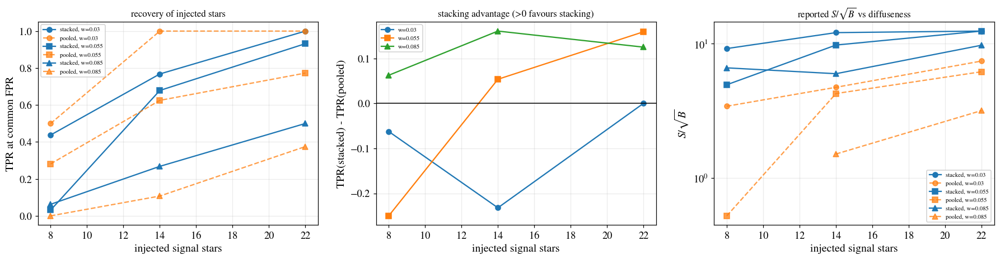


reported S/rootB vs actual recovery:
  w=0.030 N=  8   S/rootB    9.02 (stacked) /    2.61 (pooled)   TPR 0.44 / 0.50
  w=0.030 N= 14   S/rootB   12.70 (stacked) /    3.92 (pooled)   TPR 0.77 / 1.00
  w=0.030 N= 22   S/rootB   13.13 (stacked) /    6.90 (pooled)   TPR 1.00 / 1.00
  w=0.055 N=  8   S/rootB    4.15 (stacked) /    0.37 (pooled)   TPR 0.03 / 0.28
  w=0.055 N= 14   S/rootB    9.73 (stacked) /    3.43 (pooled)   TPR 0.68 / 0.62
  w=0.055 N= 22   S/rootB   13.13 (stacked) /    5.48 (pooled)   TPR 0.93 / 0.77
  w=0.085 N=  8   S/rootB    5.96 (stacked) /     nan (pooled)   TPR 0.06 / 0.00
  w=0.085 N= 14   S/rootB    5.26 (stacked) /    1.41 (pooled)   TPR 0.27 / 0.11
  w=0.085 N= 22   S/rootB    9.69 (stacked) /    2.38 (pooled)   TPR 0.50 / 0.38


In [ ]:
import importlib, stack_vs_pool as svp
importlib.reload(svp)

# ---- one realisation, drawn before and after the analysis --------------------
fig_d, demo = svp.demo_realisation(run["nY"], run["nXs"], sig_n=20, seed=3)
plt.show()
print(f"stacked recovered {demo['stacked_rec']}/20, "
      f"pooled recovered {demo['pooled_rec']}/20")

# ---- scan STRENGTH x DIFFUSENESS --------------------------------------------
# TPR is the metric that matters here: EagleEye is being used to FLAG regions for a
# later supervised dynamical study, so a missed object costs far more than an impure
# one. AUC is printed alongside because TPR is noisy at these counts, and S/rootB is
# computed exactly as the rest of this notebook does it -- Gamma clusters via
# srootB_for_Gamma_clusters_from_Brefs with the overlap-weighted background.
SIG_NS   = (8, 14, 22)                 # injected stars
SIG_WS   = (0.030, 0.055, 0.085)       # Gaussian width -> diffuseness
N_TRIALS = 4                           # raise for smoother TPR

df = svp.stacking_benchmark(run["nY"], run["nXs"], sig_ns=SIG_NS, sig_ws=SIG_WS,
                            n_trials=N_TRIALS, n_bumps=8, bump_frac=0.02,
                            bump_w=0.05, n_boot=3, seed=1)

print("\n=== full grid ===")
print(df.round(3).to_string(index=False))

fig, axes = plt.subplots(1, 3, figsize=(16.5, 4.4))
for w, m in zip(SIG_WS, "os^"):
    d = df[df.sig_w == w]
    axes[0].plot(d.sig_n, d.tpr_stacked, m + "-", color="tab:blue",
                 label=f"stacked, w={w}")
    axes[0].plot(d.sig_n, d.tpr_pooled, m + "--", color="tab:orange", alpha=.75,
                 label=f"pooled, w={w}")
    axes[1].plot(d.sig_n, d.tpr_gain, m + "-", label=f"w={w}")
    axes[2].plot(d.sig_n, d.srb_stacked, m + "-", color="tab:blue",
                 label=f"stacked, w={w}")
    axes[2].plot(d.sig_n, d.srb_pooled, m + "--", color="tab:orange", alpha=.75,
                 label=f"pooled, w={w}")
axes[0].set_ylabel("TPR at common FPR"); axes[0].set_title("recovery of injected stars",
                                                           fontsize=11)
axes[1].axhline(0, color="k", lw=1)
axes[1].set_ylabel("TPR(stacked) - TPR(pooled)")
axes[1].set_title("stacking advantage (>0 favours stacking)", fontsize=11)
axes[2].set_ylabel(r"$S/\sqrt{B}$"); axes[2].set_yscale("symlog")
axes[2].set_title(r"reported $S/\sqrt{B}$ vs diffuseness", fontsize=11)
for a in axes:
    a.set_xlabel("injected signal stars"); a.legend(fontsize=7); a.grid(alpha=.25)
plt.tight_layout(); plt.show()

# The comparison worth making explicitly: does the REPORTED significance track the
# ACTUAL recovery? If S/rootB rises while TPR does not, the number is describing the
# cluster that was found, not the method's ability to find one.
print("\nreported S/rootB vs actual recovery:")
for _, r in df.iterrows():
    print(f"  w={r.sig_w:.3f} N={int(r.sig_n):3d}   "
          f"S/rootB {r.srb_stacked:7.2f} (stacked) / {r.srb_pooled:7.2f} (pooled)"
          f"   TPR {r.tpr_stacked:.2f} / {r.tpr_pooled:.2f}")



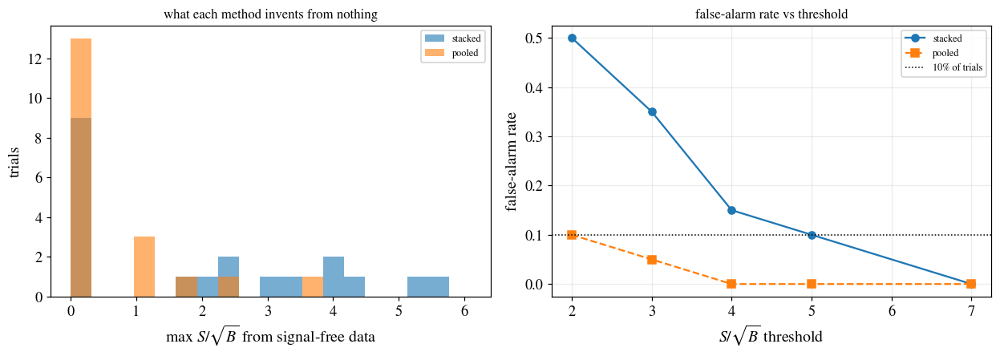


minimum passable S/rootB at 10% false-alarm rate:
  stacked 4.53   pooled 1.92
  (from 20 signal-free trials -- the rate cannot resolve below 0.05)


In [ ]:
import importlib, stack_vs_pool as svp
importlib.reload(svp)
# ---- FALSE ALARMS: the same machinery on point clouds with NOTHING in them ----
# p_ext is a per-STAR flagging level and says nothing about how often a CLUSTER
# appears. This runs the identical pipeline on signal-free data at the same
# cardinalities and the same reference lumpiness, and counts how often each method
# invents a cluster above a given S/rootB. Read together with the TPR scan above,
# that is sensitivity against a real false-alarm rate rather than against p_ext.
FA_TRIALS = 20        # p floors at 1/FA_TRIALS; raise it to resolve rarer alarms

df_fa, fa_raw = svp.false_alarm_test(run["nY"], run["nXs"], n_trials=FA_TRIALS,
                                     thresholds=(2, 3, 4, 5, 7),
                                     n_bumps=8, bump_frac=0.02, bump_w=0.05,
                                     n_boot=3, seed=11)

fig, axes = plt.subplots(1, 2, figsize=(11.5, 4.2))
bins = np.linspace(0, max(fa_raw["stacked"].max(), fa_raw["pooled"].max(), 1) * 1.1, 20)
axes[0].hist(fa_raw["stacked"], bins=bins, alpha=.6, label="stacked", color="tab:blue")
axes[0].hist(fa_raw["pooled"], bins=bins, alpha=.6, label="pooled", color="tab:orange")
axes[0].set_xlabel(r"max $S/\sqrt{B}$ from signal-free data")
axes[0].set_ylabel("trials"); axes[0].legend(fontsize=8)
axes[0].set_title("what each method invents from nothing", fontsize=11)
axes[1].plot(df_fa.threshold, df_fa.stacked_rate, "o-", label="stacked")
axes[1].plot(df_fa.threshold, df_fa.pooled_rate, "s--", label="pooled")
axes[1].axhline(0.1, color="k", ls=":", lw=1, label="10% of trials")
axes[1].set_xlabel(r"$S/\sqrt{B}$ threshold"); axes[1].set_ylabel("false-alarm rate")
axes[1].legend(fontsize=8); axes[1].grid(alpha=.25)
axes[1].set_title("false-alarm rate vs threshold", fontsize=11)
plt.tight_layout(); plt.show()

# Put the two together: the S/rootB a real candidate must beat, and whether the
# TPR scan above says it can be reached at all.
_q90s = np.quantile(fa_raw["stacked"], 0.9); _q90p = np.quantile(fa_raw["pooled"], 0.9)
print(f"\nminimum passable S/rootB at 10% false-alarm rate:")
print(f"  stacked {_q90s:.2f}   pooled {_q90p:.2f}")
print(f"  (from {FA_TRIALS} signal-free trials -- the rate cannot resolve below "
      f"{1/FA_TRIALS:.2f})")



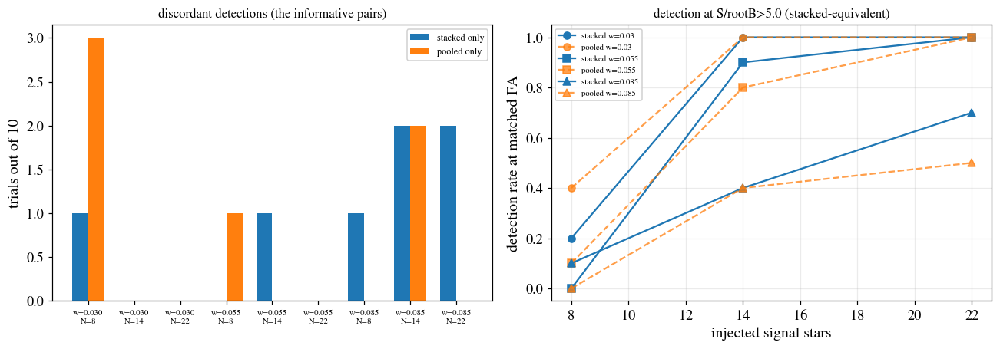


across the whole grid: stacked-only 7, pooled-only 6   (concordant trials carry no information about which is better)
McNemar exact p over all cells = 1.0000


In [ ]:
import importlib, stack_vs_pool as svp
importlib.reload(svp)
# ---- PAIRED TEST: how often does stacked see what pooled cannot? -------------
# Fix the stacked threshold at S/rootB = 5. The pooled threshold is NOT set to 5 --
# the two report on different scales (on identical data stacked can read several
# times pooled), so a common numeric cut would decide the contest by scale rather
# than sensitivity. Instead the pooled threshold is calibrated to give the SAME
# false-alarm rate on signal-free data, putting both on an identical error budget.
#
# Both methods then see the SAME realisations, so the outcomes are PAIRED and the
# discordant pairs (stacked-only vs pooled-only) are what carry the information --
# hence McNemar's exact test rather than comparing two independent rates.
SRB_THRESH = 5.0
PD_TRIALS  = 10       # realisations per grid cell
PD_FA      = 20       # signal-free trials used for the calibration

df_pd, pd_info = svp.paired_detection_test(
    run["nY"], run["nXs"], srb_thresh_stacked=SRB_THRESH,
    sig_ns=SIG_NS, sig_ws=SIG_WS, n_trials=PD_TRIALS, n_fa_trials=PD_FA,
    n_bumps=8, bump_frac=0.02, bump_w=0.05, n_boot=3, seed=5)

print(f"\nthresholds: stacked {pd_info['thr_stacked']:.2f}, "
      f"pooled {pd_info['thr_pooled']:.2f} (matched at FA rate "
      f"{pd_info['fa_rate']:.3f})")
print("\n=== paired outcomes ===")
print(df_pd.round(3).to_string(index=False))

fig, axes = plt.subplots(1, 2, figsize=(12, 4.3))
w = 0.35
x = np.arange(len(df_pd))
axes[0].bar(x - w/2, df_pd.stacked_only, w, label="stacked only", color="tab:blue")
axes[0].bar(x + w/2, df_pd.pooled_only, w, label="pooled only", color="tab:orange")
axes[0].set_xticks(x)
axes[0].set_xticklabels([f"w={r.sig_w:.3f}\nN={int(r.sig_n)}"
                         for _, r in df_pd.iterrows()], fontsize=7)
axes[0].set_ylabel(f"trials out of {PD_TRIALS}")
axes[0].set_title("discordant detections (the informative pairs)", fontsize=11)
axes[0].legend(fontsize=8)
for wv, m in zip(SIG_WS, "os^"):
    d = df_pd[df_pd.sig_w == wv]
    axes[1].plot(d.sig_n, d.det_stacked, m + "-", color="tab:blue",
                 label=f"stacked w={wv}")
    axes[1].plot(d.sig_n, d.det_pooled, m + "--", color="tab:orange", alpha=.75,
                 label=f"pooled w={wv}")
axes[1].set_xlabel("injected signal stars")
axes[1].set_ylabel("detection rate at matched FA")
axes[1].set_title(f"detection at S/rootB>{SRB_THRESH} (stacked-equivalent)",
                  fontsize=11)
axes[1].legend(fontsize=7); axes[1].grid(alpha=.25)
plt.tight_layout(); plt.show()

_so, _po = int(df_pd.stacked_only.sum()), int(df_pd.pooled_only.sum())
print(f"\nacross the whole grid: stacked-only {_so}, pooled-only {_po}"
      f"   (concordant trials carry no information about which is better)")
if _so + _po:
    from scipy import stats as _st
    print(f"McNemar exact p over all cells = "
          f"{_st.binomtest(_so, _so + _po, 0.5).pvalue:.4f}")

### False alarms for the ROBUSTNESS SCAN (persistence, not one configuration)

`false_alarm_test` above asks how often a *single* configuration invents a cluster.
The scan's claim is stronger — that a real feature survives regridding — so what has
to be calibrated is **how often several configurations agree on the same patch of sky
by chance**. A 10% per-configuration rate does not imply 10% for "5 of 8 agreeing
within 0.25 deg": it could be far lower, or, since the configurations share most of
their stars, considerably higher.

This runs the **real** `rb.scan()` on signal-free fields built by smoothed bootstrap
of your own table — the large-scale gradient, tile-to-tile density spread and PM
distribution all survive, only the clumping is erased — so everything it finds is
manufactured by the pipeline.

**On your box-size point.** Shrinking the tile lowers nY, hence the locality bound on
K_M, hence the achievable Upsilon, so the same object reports a *smaller* S/rootB in
the smaller configurations. One threshold across all eight is therefore biased against
them. The function records S/rootB **per configuration** under the null and reports
each one's 90th percentile — use those as per-config thresholds rather than a single
number. `summary["per_config"]` holds the full per-trial table if you want a different
quantile.

Staged, not run: it is `n_trials` full 8-configuration scans, so budget accordingly.

In [ ]:
import importlib, stack_vs_pool as svp
importlib.reload(svp)

# One full 8-config scan per trial -- start at 3 to time it, then scale up.
SFA_TRIALS = 3
SFA_MATCH  = 0.25        # deg; two configs "agree" if their clusters are this close

# Mirror the settings of the real scan, or the calibration describes a different
# pipeline from the one you are calibrating.
SFA_SCAN_KW = dict(
    kM=SCAN_KM, p_ext=SCAN_P_EXT, null_N=SCAN_NULL_N, n_boot=SCAN_N_BOOT,
    dpa_Z=DPA_Z, dbscan_eps=DBSCAN_EPS, dbscan_min=DBSCAN_MIN,
    n_jobs=N_JOBS, seed=SEED, rho=SCAN_RHO, scale_factors=SCAN_SCALES,
    freeze_scale=SCAN_FREEZE, km_mode=SCAN_KM_MODE,
    # Parallelism: rb.scan defaults every worker count to 1, so without this the
    # whole test is serial -- n_trials x 8 configs x ~112 s.
    # config_workers, NOT ref_workers: joblib disables nested Parallel, so
    # config_workers=8 + ref_workers=8 silently degrades to config-level only, and
    # a configuration (~112 s) amortises loky's startup where a single Soar (0.7 s)
    # does not.
    config_workers=8, ref_workers=1, boot_workers=1,
    equalise=EQUALISE, eq_srb=EQ_SRB, eq_max_passes=EQ_MAX_PASSES,
    eq_km=EQ_KM, eq_headroom=EQ_HEADROOM, verbose=False)

sfa, sfa_recs = svp.scan_false_alarm(
    SCAN_R, TARGET, h0=float(SCAN_RUN["grid"]["cell_h"]),
    n_trials=SFA_TRIALS, match_deg=SFA_MATCH, scan_kw=SFA_SCAN_KW, seed=17)

# ---- what a real candidate has to beat --------------------------------------
if sfa.get("n_trials"):
    pers = sfa["persistence"]
    fig, axes = plt.subplots(1, 2, figsize=(11.5, 4.2))
    axes[0].step(pers.k_configs, pers.rate, where="mid", lw=2)
    axes[0].axhline(0.1, color="k", ls=":", lw=1, label="10%")
    axes[0].set_xlabel("configurations agreeing (within "
                       f"{SFA_MATCH} deg)")
    axes[0].set_ylabel("false-alarm rate"); axes[0].legend(fontsize=8)
    axes[0].set_title("chance persistence, signal-free", fontsize=11)
    axes[0].grid(alpha=.25)
    axes[1].plot(pers.k_configs, pers.srb_q90, "o-", label="90th pct")
    axes[1].plot(pers.k_configs, pers.srb_max, "s--", alpha=.7, label="max")
    axes[1].set_xlabel("configurations agreeing")
    axes[1].set_ylabel(r"weakest member's $S/\sqrt{B}$")
    axes[1].set_title("threshold a real group must beat", fontsize=11)
    axes[1].legend(fontsize=8); axes[1].grid(alpha=.25)
    plt.tight_layout(); plt.show()

    print("\nTo flag a candidate AFTER the robustness scan, require BOTH:")
    print(f"  (a) >= k configurations with clusters within {SFA_MATCH} deg, and")
    print("  (b) each of those clusters above ITS OWN configuration's threshold")
    print("      (per_config_q90 above -- not one number for all eight).")
    print("\nThe rate column says how often signal-free data satisfies (a) alone.")

In [39]:
# ---- PER-REFERENCE CONTRIBUTIONS: who actually supports each cluster? ----------
# |A_Gamma|/sqrt(B_w) hides two things. (1) How many of the 8 references produced an
# EE cluster here at all -- the rest contribute nothing and that absence is
# persistence information. (2) EagleEye's own per-cluster z is
#     z = (N_on - alpha N_off)/sqrt(alpha N_off)
# which treats B_hat as exact. It is not: Eq.9's B_hat = |Background| * alpha is an
# ON/OFF measurement (ON = Repechaged, OFF = the injected Background sample), so
# Var = B(1+alpha). At the alpha ~ 1 equalisation enforces, z is overstated by
# ~1/sqrt(2). Li & Ma (1983) on the SAME native sets fixes it -- no aperture, no ball.
#
# rb.run_summary now prints a one-line version under every run (rb.SHOW_CONTRIBUTIONS
# = False to silence it), and rb.plot_scan_overlay puts n_refs and Z_LiMa in each
# contour's legend entry.
import importlib, wake_test as wt
importlib.reload(wt)

# ---- 1) the discovery run, in full -------------------------------------------
rep = wt.contribution_report(run)

# ---- 2) the same thing across the robustness scan ----------------------------
# The centroid persisting across every tile perturbation is the headline; this asks
# the sharper question underneath it -- is the SAME set of references carrying the
# feature each time, or a rotating cast? A persistent centroid supported by a
# different 3-of-8 at every configuration is a much weaker claim than one supported
# by the same references throughout.
# scan_runs is a DICT {label: run}; SCAN_CFGS_OK is the subset of configs that ran.
try:
    scan_runs, SCAN_CFGS_OK
except NameError:
    print("run the Part 5 scan first (needs scan_runs / SCAN_CFGS_OK)")
else:
    sc = wt.scan_contributions(scan_runs, SCAN_CFGS_OK)

    print("\n" + "=" * 78)
    print("every configuration x cluster x reference")
    print("=" * 78)
    with pd.option_context("display.max_rows", 300, "display.width", 200):
        display(sc["per_reference"])

    # which references recur? a feature carried by one reference in every
    # configuration is the Fisher-sum failure mode, not persistence.
    pr = sc["per_reference"]
    if len(pr):
        piv = pr.pivot_table(index="config", columns="ref", values="Z_LiMa",
                             aggfunc="max")
        print("\nZ_LiMa per reference per configuration (blank = no cluster):")
        display(piv.round(2))
        print(f"\nreferences appearing in >= half the configurations: "
              f"{[int(k) for k, v in pr.groupby('ref').size().items() if v >= len(scan_runs)/2]}")



--- Gamma cluster 0:  |A|=39  pipeline S/sqrt(B)=8.52 ---
 ref  cid  overlap  ov_frac  N_on  N_off  alpha  B_hat  z_EE  Z_LiMa  exact
   0    0        6   0.3529    17     12  1.073  12.79 1.176  0.7426  False
   1    0       24     0.75    32     23 0.9932  22.66 1.963   1.242  False
   3    0       34   0.8718    61     21   1.02  21.16  8.66   4.426  False
  contributing references : 3 of 8  [0, 1, 3]
  mean Z_LiMa 2.14  sd 2.00   (sd ~ 1 if the references agree)
  rho=0.448  R_eff=1.94  effective independent refs here = 1.6
  Z_pooled  = 3.01   (pool the OFF counts; optimistic, refs are correlated)
  Z_scatter = 1.85   (let the reference spread set the error; recommended)
per-configuration summary
     config  gid   S  n_refs  R                     refs  Z_pooled  Z_scatter  srb_pipeline
    nominal    0   5       3  8                [1, 2, 3]      4.56       3.09           1.5
    nominal    1  28       3  8                [1, 2, 3]      2.57       2.09          8.04
    nominal 

,ref,cid,overlap,ov_frac,N_on,N_off,alpha,B_hat,z_EE,Z_LiMa,exact,config,gid
0,1,1,2,0.400000,45,14,1.010526,14.069956,8.245826,4.100266,False,nominal,0
1,2,1,1,0.200000,12,7,0.990291,6.940134,1.920680,1.175009,False,nominal,0
2,3,1,1,0.200000,42,9,1.073684,9.549072,10.501384,4.570269,False,nominal,0
3,1,0,15,0.625000,24,15,1.010526,15.168645,2.267535,1.415129,False,nominal,1
4,2,0,11,0.550000,20,16,0.990291,15.804520,1.055336,0.696595,False,nominal,1
5,3,0,24,0.857143,33,8,1.073684,8.567639,8.347085,3.826242,False,nominal,1
6,0,1,27,1.000000,27,6,1.075808,6.368317,8.175651,3.600563,False,nominal,2
7,1,1,40,0.888889,45,14,1.010526,14.069956,8.245826,4.100266,False,nominal,2
8,2,2,34,1.000000,34,9,0.990291,8.829566,8.470733,3.966728,False,nominal,2
9,3,1,38,0.904762,42,9,1.073684,9.549072,10.501384,4.570269,False,nominal,2



Z_LiMa per reference per configuration (blank = no cluster):


ref,0,1,2,3,4,5,6,7
config,,,,,,,,
diagonal,5.37,5.86,6.82,5.04,4.25,4.57,3.62,6.17
nominal,3.60,4.10,3.97,4.57,3.90,3.44,3.21,4.60
scale x0.67,0.63,0.77,0.53,0.95,NaN,0.28,0.14,0.81
scale x1.50,4.46,3.89,5.14,5.03,4.67,2.94,3.46,4.61
shiftE,5.59,6.41,5.32,6.06,4.48,5.51,4.62,6.06
shiftN,3.17,4.17,4.44,3.27,4.57,2.21,2.40,4.14
shiftS,0.56,1.77,2.37,3.82,NaN,0.95,NaN,NaN
shiftW,0.16,2.15,0.71,3.22,NaN,NaN,NaN,0.47



references appearing in >= half the configurations: [0, 1, 2, 3, 4, 5, 6, 7]


Underful Vlist: Vlist<w=10.52 h=12.73 d=0.00 s=0.00>[Hrule, Glue, Hlist<w=10.52 h=12.53 d=0.00 s=0.00>[Hbox, Hlist<w=7.47 h=12.53 d=0.00 s=0.00>[Vlist<w=7.47 h=12.53 d=0.00 s=0.00>[HCentered<w=7.38 h=2.00 d=0.00 s=0.00>[Glue, Hbox, `\circumflexaccent`, Glue], Vbox, Hlist<w=7.47 h=9.00 d=0.00 s=0.00>[`B`, k0.09]]], Hbox]]
Underful Vlist: Vlist<w=10.52 h=12.73 d=0.00 s=0.00>[Hrule, Glue, Hlist<w=10.52 h=12.53 d=0.00 s=0.00>[Hbox, Hlist<w=7.47 h=12.53 d=0.00 s=0.00>[Vlist<w=7.47 h=12.53 d=0.00 s=0.00>[HCentered<w=7.38 h=2.00 d=0.00 s=0.00>[Glue, Hbox, `\circumflexaccent`, Glue], Vbox, Hlist<w=7.47 h=9.00 d=0.00 s=0.00>[`B`, k0.09]]], Hbox]]
Underful Vlist: Vlist<w=10.52 h=12.73 d=0.00 s=0.00>[Hrule, Glue, Hlist<w=10.52 h=12.53 d=0.00 s=0.00>[Hbox, Hlist<w=7.47 h=12.53 d=0.00 s=0.00>[Vlist<w=7.47 h=12.53 d=0.00 s=0.00>[HCentered<w=7.38 h=2.00 d=0.00 s=0.00>[Glue, Hbox, `\circumflexaccent`, Glue], Vbox, Hlist<w=7.47 h=9.00 d=0.00 s=0.00>[`B`, k0.09]]], Hbox]]
Underful Vlist: Vlist<w=10.52 h

  tile cell0 (ref 0): 2.7  <- contributes
  tile cell1 (ref 1): --
  tile cell2 (ref 2): 1.8  <- contributes
  tile cell3 (ref 3): 3.1  <- contributes
  tile cell5 (ref 4): --
  tile cell6 (ref 5): 4.6  <- contributes
  tile cell7 (ref 6): 5.6  <- contributes
  tile cell8 (ref 7): 3.5  <- contributes


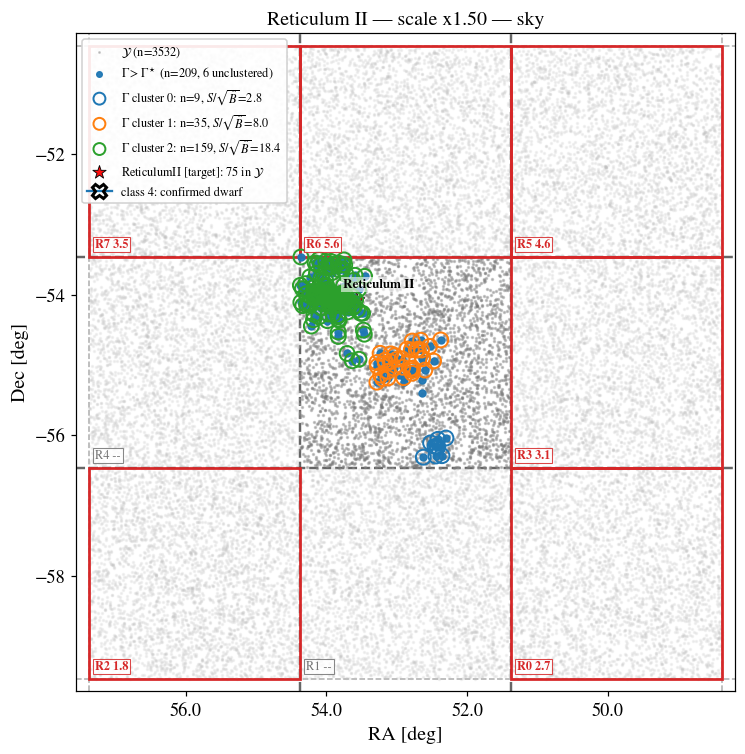

Underful Vlist: Vlist<w=10.52 h=12.73 d=0.00 s=0.00>[Hrule, Glue, Hlist<w=10.52 h=12.53 d=0.00 s=0.00>[Hbox, Hlist<w=7.47 h=12.53 d=0.00 s=0.00>[Vlist<w=7.47 h=12.53 d=0.00 s=0.00>[HCentered<w=7.38 h=2.00 d=0.00 s=0.00>[Glue, Hbox, `\circumflexaccent`, Glue], Vbox, Hlist<w=7.47 h=9.00 d=0.00 s=0.00>[`B`, k0.09]]], Hbox]]
Underful Vlist: Vlist<w=10.52 h=12.73 d=0.00 s=0.00>[Hrule, Glue, Hlist<w=10.52 h=12.53 d=0.00 s=0.00>[Hbox, Hlist<w=7.47 h=12.53 d=0.00 s=0.00>[Vlist<w=7.47 h=12.53 d=0.00 s=0.00>[HCentered<w=7.38 h=2.00 d=0.00 s=0.00>[Glue, Hbox, `\circumflexaccent`, Glue], Vbox, Hlist<w=7.47 h=9.00 d=0.00 s=0.00>[`B`, k0.09]]], Hbox]]
Underful Vlist: Vlist<w=10.52 h=12.73 d=0.00 s=0.00>[Hrule, Glue, Hlist<w=10.52 h=12.53 d=0.00 s=0.00>[Hbox, Hlist<w=7.47 h=12.53 d=0.00 s=0.00>[Vlist<w=7.47 h=12.53 d=0.00 s=0.00>[HCentered<w=7.38 h=2.00 d=0.00 s=0.00>[Glue, Hbox, `\circumflexaccent`, Glue], Vbox, Hlist<w=7.47 h=9.00 d=0.00 s=0.00>[`B`, k0.09]]], Hbox]]
Underful Vlist: Vlist<w=10.52 h

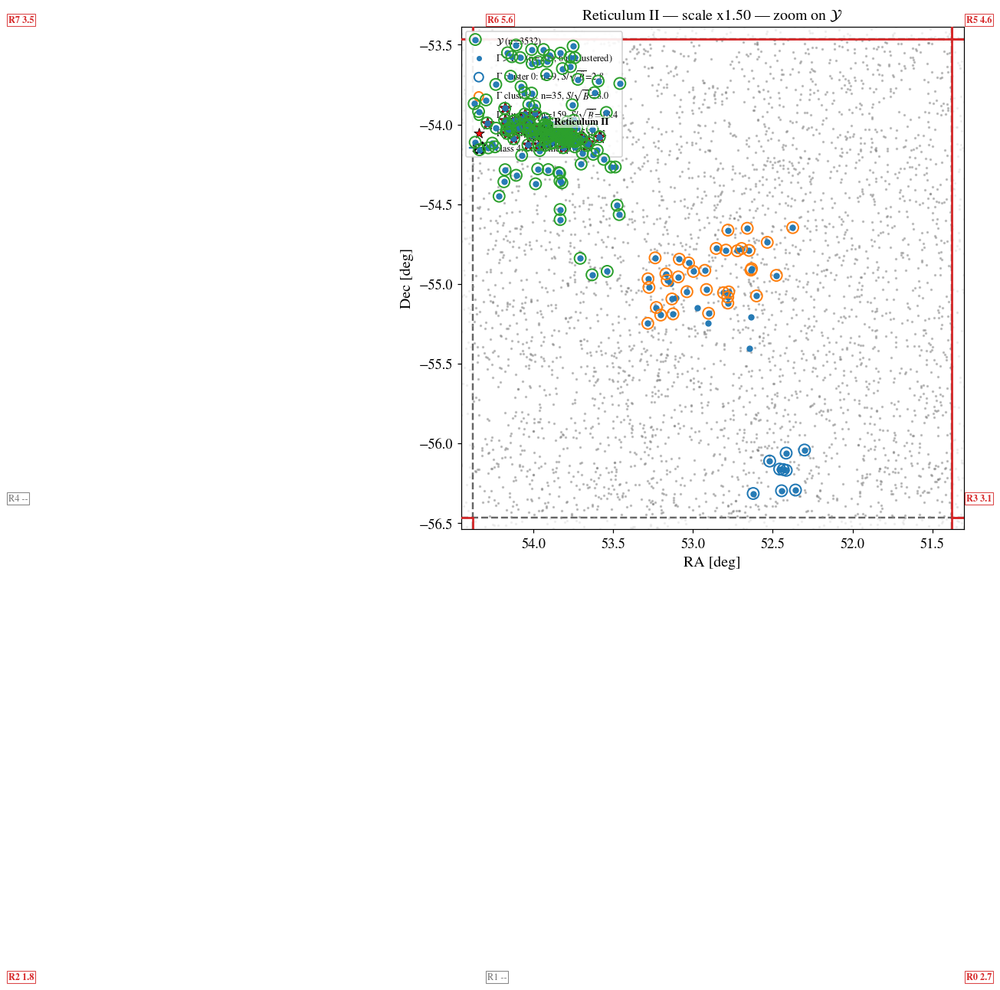

In [41]:
# ---- PER-REFERENCE S/sqrt(B) IN THE CORNER OF EACH TILE ------------------------
# plot_field returns its ax, so one extra line labels every reference tile with the
# estimate EagleEye got for that X^(j) -> Y run. References that produced a cluster
# overlapping the anomaly are red/bold and outlined (same idea as the equalised-
# reference outline plot_field already draws); the rest are dimmed and show "--",
# or their whole-reference 'Total' in brackets when EE_books are kept.
#
#   stat="z_EE"  EagleEye's own (N_on - B_hat)/sqrt(B_hat)      <- what EE reports
#   stat="lima"  Li & Ma on the same repechage sets
#   stat="both"  "z / Z"
import importlib, wake_test as wt
importlib.reload(wt)

STAT = "z_EE"

ax = plot_field(run_s, SCAN_R, neigh_s, field_cat_s, space="sky",
                title=f"{DWARF} — {SCAN_LABEL} — sky")
wt.label_reference_tiles(ax, run_s, r=SCAN_R, target=TARGET, stat=STAT, verbose=True)
plt.show()

ax = plot_field(run_s, SCAN_R, neigh_s, field_cat_s, space="sky", zoom_to_Y=True,
                title=f"{DWARF} — {SCAN_LABEL} — zoom on $\\mathcal{{Y}}$")
wt.label_reference_tiles(ax, run_s, r=SCAN_R, target=TARGET, stat=STAT)
plt.show()   # tiles sit outside the zoomed axes; the outline of Y is what matters here
